In [1]:
# Requirements
# python = 3.6.2
# pynwb = 1.0.1

In [2]:
#################################
# NWB Packages
#################################

import numpy
import pynwb
from pynwb import NWBFile, TimeSeries, get_manager
from pynwb.spec import NWBGroupSpec, NWBDatasetSpec, NWBNamespace
from pynwb.base import ProcessingModule
from pynwb.ecephys import ElectrodeGroup, Device
from pynwb.image import ImageSeries
from pynwb.core import set_parents
from pynwb import *
from datetime import datetime
from pynwb import NWBFile #, TimeSeries, get_manager

In [3]:
#################################
# neo Packages
#################################

import neo
from neo import *
print ("neo.__version__ = ", neo.__version__)

import urllib
import numpy as np
import quantities as pq
from matplotlib import pyplot
import matplotlib.pyplot as plt

neo.__version__ =  0.8.0.dev


In [4]:
#################################
# NWB File
# http://download.alleninstitute.org/informatics-archive/prerelease/
# H19.29.141.11.21.01.nwb
#################################

# Read the NWB File
filename = "/home/elodie/NWB_Files/NWB_org/H19.29.141.11.21.01.nwb"
io2 = pynwb.NWBHDF5IO(filename, mode='r')

In [5]:
# An other way to read the NWB file
container = io2.read()
#print("container = ", container)

neurodata_type =  VoltageClampSeries
file =  {
    "cycle_id": 0,
    "file": "H19_29_141_11_21_01_0000.abf",
    "name": "IN 0",
    "number": 0,
    "protocol": "EXTPINBATH_IN0",
    "protocolPath": "C:\\Allen Institute\\Allen Institute protocols with text attachment\\IN0\\EXTPINBATH_IN0.pro"
}
desc =  EXTPINBATH
rate =  10000.0
gain =  1.0
capacitance_fast =  nan
capacitance_slow =  nan
resistance_comp_bandwidth =  nan
resistance_comp_correction =  nan
resistance_comp_prediction =  nan
whole_cell_capacitance_comp =  nan
whole_cell_series_resistance_comp =  nan
data.data =  <HDF5 dataset "data": shape (2500,), type "<f4">
   
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current_shape =  (2500,)
starting_time =  2.25
current_shape[0] =  2500
temps[j] =  [2.25   2.2501 2.2502 ... 2.4997 2.4998 2.4999]


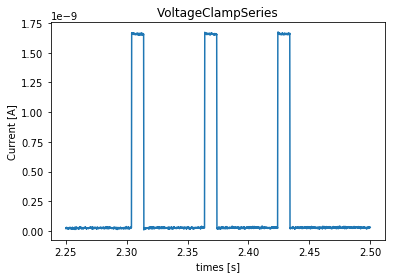

In [6]:
# VoltageClampSeries
# Current vs time
    
for i in container.acquisition:

    if i=='index_00':
        print("neurodata_type = ", container.get_acquisition(i).neurodata_type)
        print("file = ", container.get_acquisition(i).description)
        print("desc = ", container.get_acquisition(i).stimulus_description)
        print("rate = ", container.get_acquisition(i).rate) # Hz
        print("gain = ", container.get_acquisition(i).gain) # x
        print("capacitance_fast = ", container.get_acquisition(i).capacitance_fast) # F
        print("capacitance_slow = ", container.get_acquisition(i).capacitance_slow)
        print("resistance_comp_bandwidth = ", container.get_acquisition(i).resistance_comp_bandwidth)
        print("resistance_comp_correction = ", container.get_acquisition(i).resistance_comp_correction)
        print("resistance_comp_prediction = ", container.get_acquisition(i).resistance_comp_prediction)
        print("whole_cell_capacitance_comp = ", container.get_acquisition(i).whole_cell_capacitance_comp)
        print("whole_cell_series_resistance_comp = ", container.get_acquisition(i).whole_cell_series_resistance_comp)        
        print("data.data = ", container.get_acquisition(i).data)
        print("   ")
        print("current = ", container.get_acquisition(i).data[:])
        print("current_shape = ", container.get_acquisition(i).data.shape)
        print("starting_time = ",container.get_acquisition(i).starting_time)
 
        current_shape = container.get_acquisition(i).data.shape[0]
        print("current_shape[0] = ", current_shape)
        temps = np.zeros(current_shape)
        for j in range(0, current_shape):
            temps[j]=1./container.get_acquisition(i).rate*j+container.get_acquisition(i).starting_time
            
        print("temps[j] = ", temps)

        plt.plot(temps, container.get_acquisition(i).data[:]*container.get_acquisition(i).conversion)
        plt.xlabel('times [s]')
        plt.ylabel('Current [%s]' %container.get_acquisition(i).unit) 
        plt.title('%s' %container.get_acquisition(i).neurodata_type)
        plt.show()   


i =  index_00
ii =  index_00


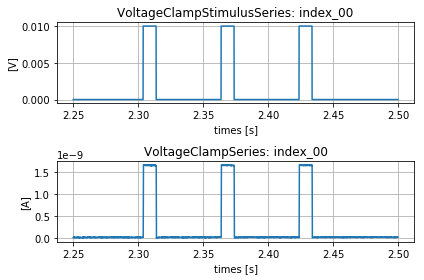

i =  index_01
ii =  index_01


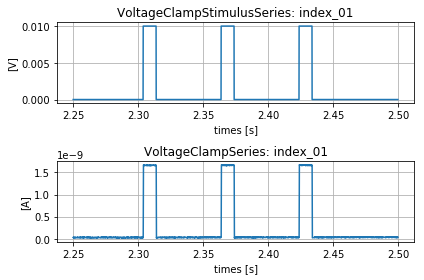

i =  index_02
ii =  index_02


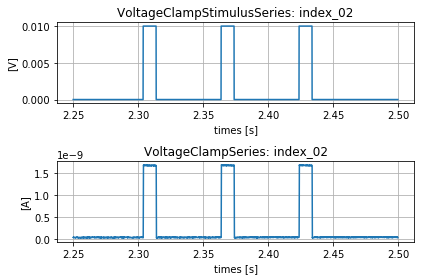

i =  index_03
ii =  index_03


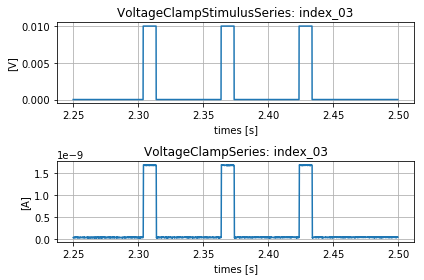

i =  index_04
ii =  index_04


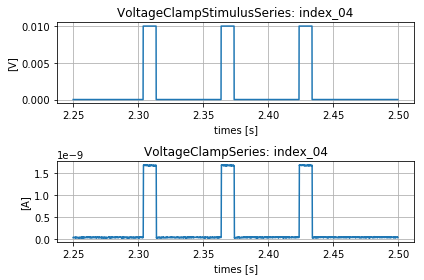

i =  index_05
ii =  index_05


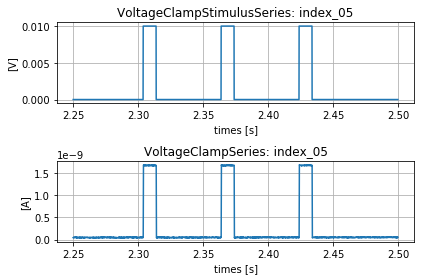

i =  index_06
ii =  index_06


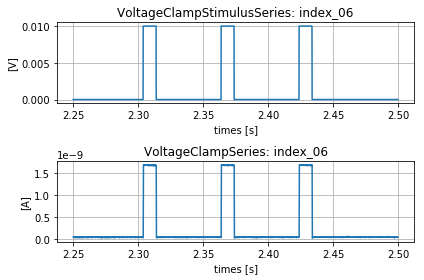

i =  index_07
ii =  index_07


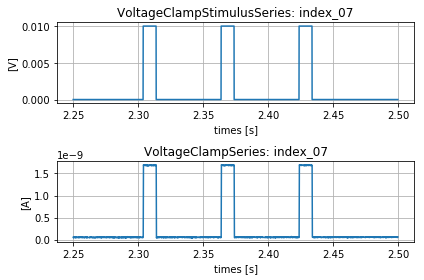

i =  index_08
ii =  index_08


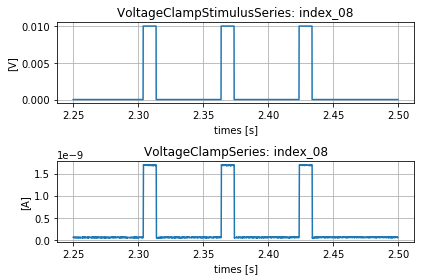

i =  index_09
ii =  index_09


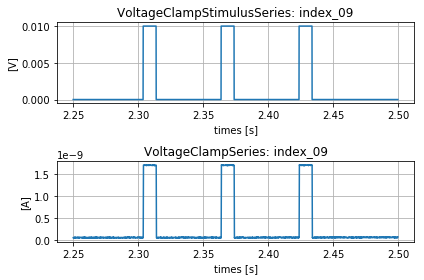

i =  index_10
ii =  index_10


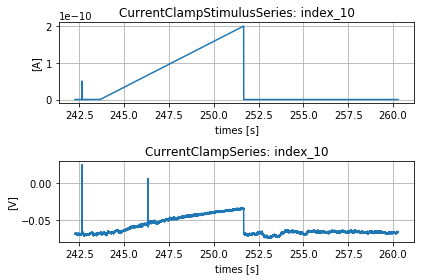

i =  index_11
ii =  index_11


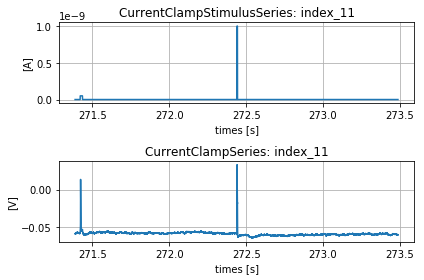

i =  index_12
ii =  index_12


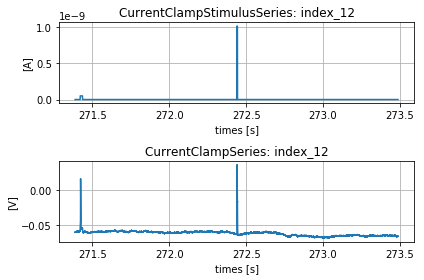

i =  index_13
ii =  index_13


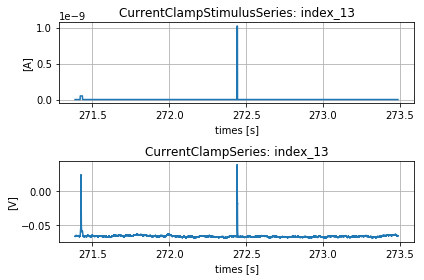

i =  index_14
ii =  index_14


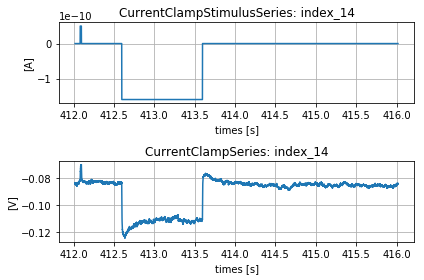

i =  index_15
ii =  index_15


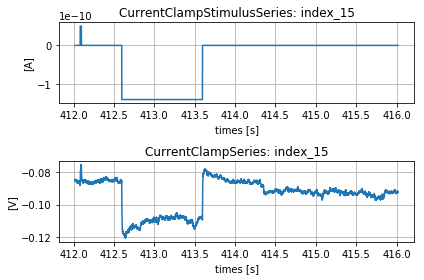

i =  index_16
ii =  index_16


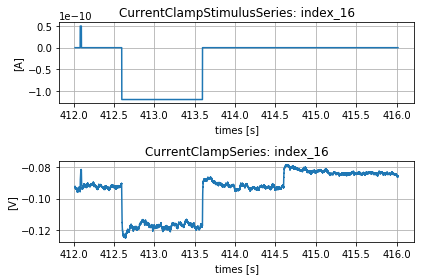

i =  index_17
ii =  index_17


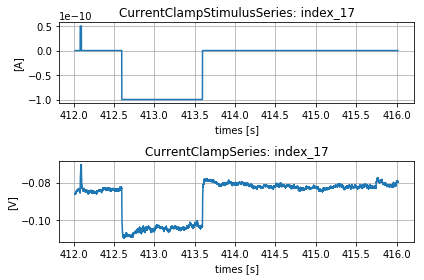

i =  index_18
ii =  index_18


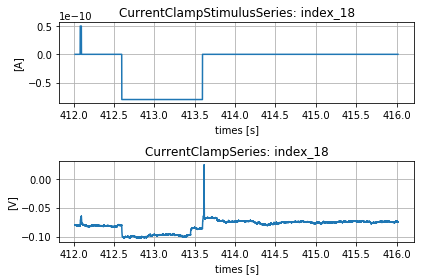

i =  index_19
ii =  index_19


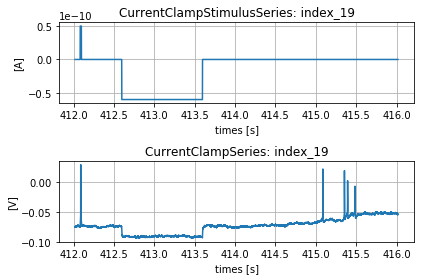

i =  index_20
ii =  index_20


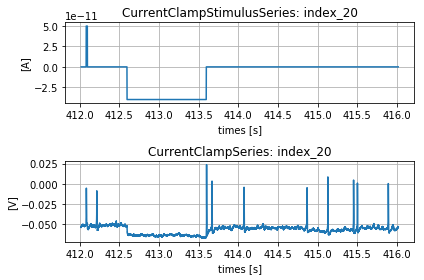

i =  index_21
ii =  index_21


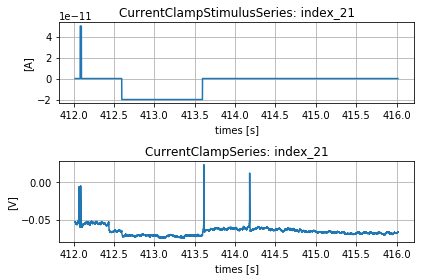

i =  index_22
ii =  index_22


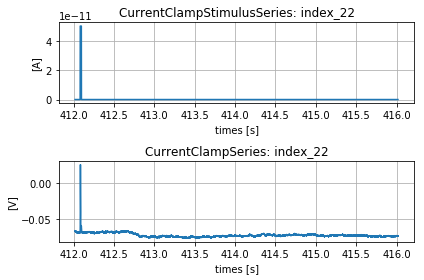

i =  index_23
ii =  index_23


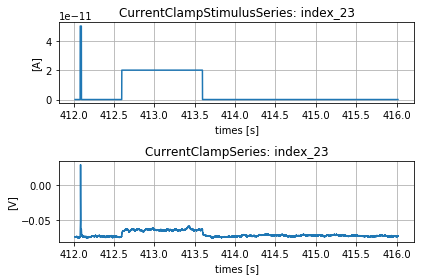

i =  index_24
ii =  index_24


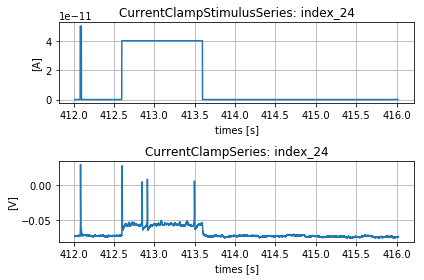

i =  index_25
ii =  index_25


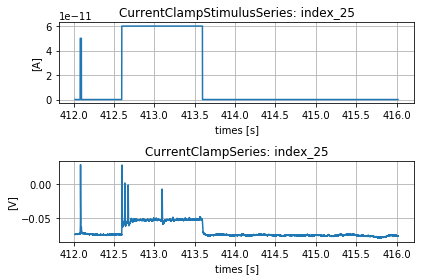

i =  index_26
ii =  index_26


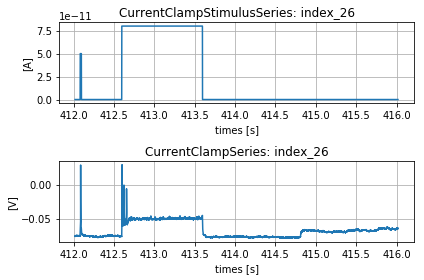

i =  index_27
ii =  index_27


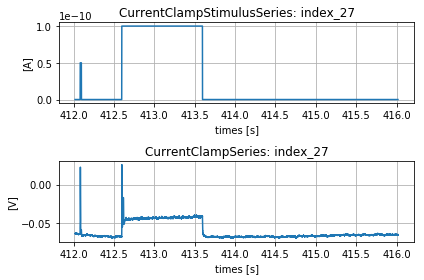

i =  index_28
ii =  index_28


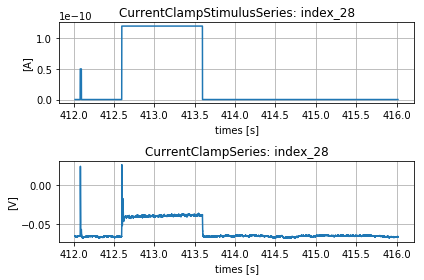

i =  index_29
ii =  index_29


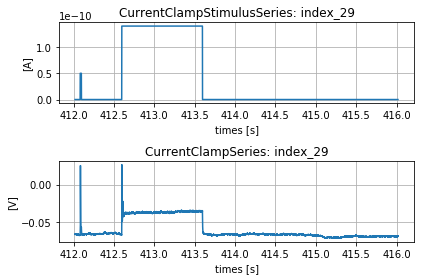

i =  index_30
ii =  index_30


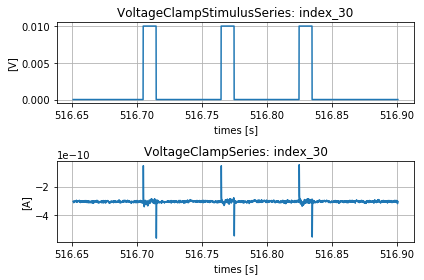

i =  index_31
ii =  index_31


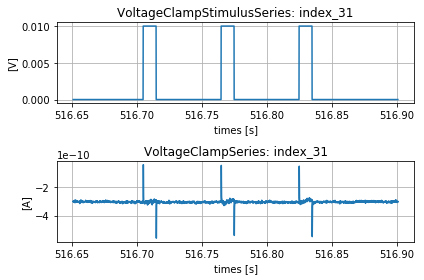

i =  index_32
ii =  index_32


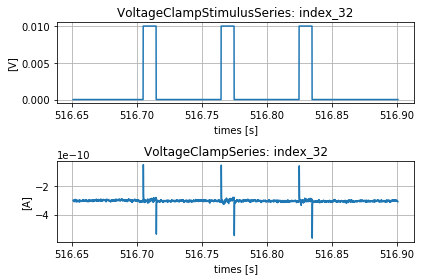

i =  index_33
ii =  index_33


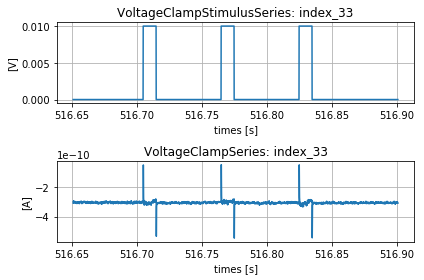

i =  index_34
ii =  index_34


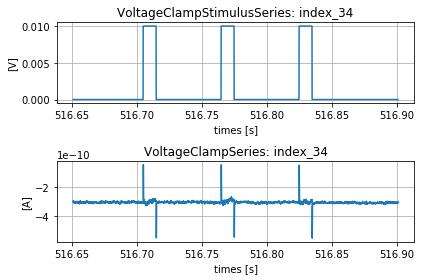

i =  index_35
ii =  index_35


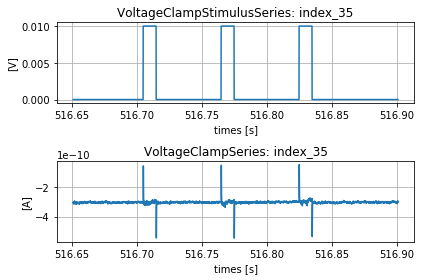

i =  index_36
ii =  index_36


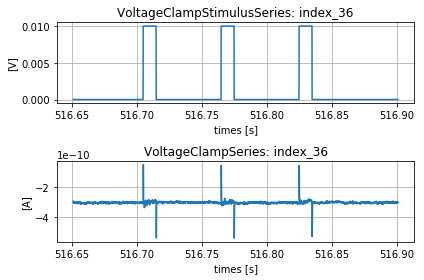

i =  index_37
ii =  index_37


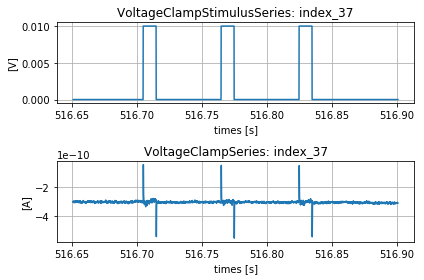

i =  index_38
ii =  index_38


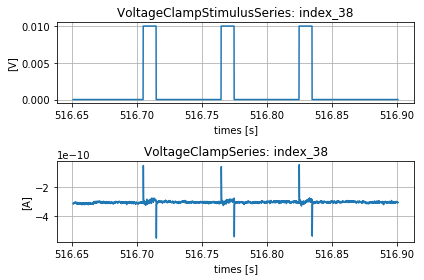

i =  index_39
ii =  index_39


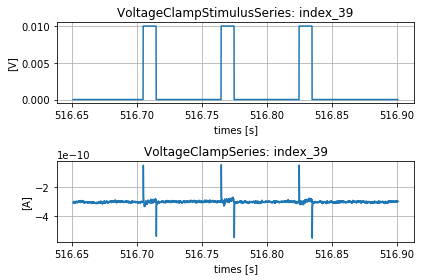

In [7]:
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('NWB_H19_29_141_11_21_01_multigraphs.pdf')

for i in container.stimulus:
#for i in ['index_00', 'index_01']: # To only have the first two

    fig = plt.figure()

    print("i = ", i)
    voltage_shape = container.get_stimulus(i).data.shape[0]
           
    temps_voltage = np.zeros(voltage_shape)
    for k in range(0, voltage_shape):
        temps_voltage[k]=1./container.get_stimulus(i).rate*k+container.get_acquisition(i).starting_time

    plt.subplot(2, 1, 1)    
#    plt.plot(temps_voltage, container.get_stimulus(i).data[:]/1000.)
    plt.plot(temps_voltage, container.get_stimulus(i).data[:]*container.get_stimulus(i).conversion)
    plt.xlabel('times [s]')
    plt.ylabel('[%s]' %container.get_stimulus(i).unit) 
    plt.title('%s: %s' %(container.get_stimulus(i).neurodata_type,i))
    plt.grid(True)
    
    print("ii = ", i)
    current_shape = container.get_acquisition(i).data.shape[0]
    temps = np.zeros(current_shape)
    for j in range(0, current_shape):
        temps[j]=1./container.get_acquisition(i).rate*j+container.get_acquisition(i).starting_time
        
    plt.subplot(2, 1, 2)
#    plt.plot(temps, container.get_acquisition(i).data[:]/1000)
    plt.plot(temps, container.get_acquisition(i).data[:]*container.get_acquisition(i).conversion)
    plt.xlabel('times [s]')
    plt.ylabel('[%s]' %container.get_acquisition(i).unit) 
    plt.title('%s: %s' %(container.get_acquisition(i).neurodata_type, i))
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    pp.savefig(fig)
pp.close()
    
#    #plt.savefig(pp, format='pdf')
#    pp.savefig(fig)
#    plt.clf() # clear the figure
#
#pp.close()
        

In [8]:
for i in container.stimulus:
    for k in range(0, voltage_shape):
        print("k = ", k)
        temps_voltage[k]=1./container.get_stimulus(i).rate*k+container.get_stimulus(i).starting_time
       
        print("temps_voltage[k] = ", temps_voltage[k])
        print("current = ", container.get_acquisition(i).data[:])
        print("current.unit = ", container.get_acquisition(i).unit)
        

k =  0
temps_voltage[k] =  0.0
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1
temps_voltage[k] =  0.0001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2
temps_voltage[k] =  0.0002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  3
temps_voltage[k] =  0.00030000000000000003
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  4
temps_voltage[k] =  0.0004
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  5
temps_voltage[k] =  0.0005
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  6
temps_voltage[k] =  0.0006000000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  7
temps_voltage[k] =  0.0007
current =  [19.897459 25.268553 28.

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  181
temps_voltage[k] =  0.0181
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  182
temps_voltage[k] =  0.0182
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  183
temps_voltage[k] =  0.0183
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  184
temps_voltage[k] =  0.0184
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  185
temps_voltage[k] =  0.018500000000000003
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  186
temps_voltage[k] =  0.018600000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  187
temps_voltage[k] =  0.0187
current =  [19.897459 25.268553 28.07617  ... 29.907225

temps_voltage[k] =  0.0396
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  397
temps_voltage[k] =  0.0397
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  398
temps_voltage[k] =  0.0398
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  399
temps_voltage[k] =  0.039900000000000005
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  400
temps_voltage[k] =  0.04
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  401
temps_voltage[k] =  0.040100000000000004
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  402
temps_voltage[k] =  0.0402
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  403
temps_voltage[k] =  0.0403
current =  [19.897459 25.26855

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  629
temps_voltage[k] =  0.0629
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  630
temps_voltage[k] =  0.063
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  631
temps_voltage[k] =  0.0631
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  632
temps_voltage[k] =  0.0632
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  633
temps_voltage[k] =  0.06330000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  634
temps_voltage[k] =  0.0634
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  635
temps_voltage[k] =  0.0635
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.27

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  871
temps_voltage[k] =  0.08710000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  872
temps_voltage[k] =  0.0872
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  873
temps_voltage[k] =  0.0873
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  874
temps_voltage[k] =  0.0874
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  875
temps_voltage[k] =  0.08750000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  876
temps_voltage[k] =  0.0876
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  877
temps_voltage[k] =  0.0877
current =  [19.897459 25.268553 28.07617  ... 29.907225 2

current.unit =  A
k =  1106
temps_voltage[k] =  0.1106
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1107
temps_voltage[k] =  0.1107
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1108
temps_voltage[k] =  0.11080000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1109
temps_voltage[k] =  0.1109
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1110
temps_voltage[k] =  0.111
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1111
temps_voltage[k] =  0.1111
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1112
temps_voltage[k] =  0.11120000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1113
temps_voltage[k] =  0.1

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1306
temps_voltage[k] =  0.1306
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1307
temps_voltage[k] =  0.1307
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1308
temps_voltage[k] =  0.1308
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1309
temps_voltage[k] =  0.13090000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1310
temps_voltage[k] =  0.131
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1311
temps_voltage[k] =  0.1311
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1312
temps_voltage[k] =  0.1312
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.93066

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1513
temps_voltage[k] =  0.15130000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1514
temps_voltage[k] =  0.1514
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1515
temps_voltage[k] =  0.1515
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1516
temps_voltage[k] =  0.1516
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1517
temps_voltage[k] =  0.1517
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1518
temps_voltage[k] =  0.15180000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1519
temps_voltage[k] =  0.1519
current =  [19.897459 25.268553 28.07617  ... 29.9

temps_voltage[k] =  0.17200000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1721
temps_voltage[k] =  0.1721
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1722
temps_voltage[k] =  0.17220000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1723
temps_voltage[k] =  0.1723
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1724
temps_voltage[k] =  0.1724
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1725
temps_voltage[k] =  0.17250000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1726
temps_voltage[k] =  0.1726
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1727
temps_voltage[k] =  0.172700000000000

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1924
temps_voltage[k] =  0.19240000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1925
temps_voltage[k] =  0.1925
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1926
temps_voltage[k] =  0.19260000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1927
temps_voltage[k] =  0.1927
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1928
temps_voltage[k] =  0.1928
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1929
temps_voltage[k] =  0.19290000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  1930
temps_voltage[k] =  0.193
current =  [19.897459 25.268553 28.076

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2099
temps_voltage[k] =  0.2099
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2100
temps_voltage[k] =  0.21000000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2101
temps_voltage[k] =  0.2101
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2102
temps_voltage[k] =  0.2102
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2103
temps_voltage[k] =  0.21030000000000001
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2104
temps_voltage[k] =  0.2104
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2105
temps_voltage[k] =  0.21050000000000002
current =  [19.897459 25.268553 28.07

current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2325
temps_voltage[k] =  0.2325
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2326
temps_voltage[k] =  0.2326
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2327
temps_voltage[k] =  0.23270000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2328
temps_voltage[k] =  0.2328
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2329
temps_voltage[k] =  0.23290000000000002
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2330
temps_voltage[k] =  0.233
current =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]
current.unit =  A
k =  2331
temps_voltage[k] =  0.2331
current =  [19.897459 25.268553 28.07617  ... 29.90

temps_voltage[k] =  0.2553
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  54
temps_voltage[k] =  0.2554
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  55
temps_voltage[k] =  0.2555
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  56
temps_voltage[k] =  0.2556
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  57
temps_voltage[k] =  0.2557
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  58
temps_voltage[k] =  0.2558
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  59
temps_voltage[k] =  0.2559
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  60
temps_voltage[k] =  0.256
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.24999

temps_voltage[k] =  0.2792
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  293
temps_voltage[k] =  0.2793
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  294
temps_voltage[k] =  0.2794
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  295
temps_voltage[k] =  0.2795
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  296
temps_voltage[k] =  0.2796
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  297
temps_voltage[k] =  0.2797
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  298
temps_voltage[k] =  0.2798
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  299
temps_voltage[k] =  0.2799
current =  [29.052732 24.04785  31.616209 ... 37.475582 

current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  523
temps_voltage[k] =  0.3023
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  524
temps_voltage[k] =  0.3024
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  525
temps_voltage[k] =  0.3025
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  526
temps_voltage[k] =  0.3026
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  527
temps_voltage[k] =  0.3027
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  528
temps_voltage[k] =  0.3028
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  529
temps_voltage[k] =  0.3029
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
curren

current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  742
temps_voltage[k] =  0.3242
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  743
temps_voltage[k] =  0.32430000000000003
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  744
temps_voltage[k] =  0.3244
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  745
temps_voltage[k] =  0.3245
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  746
temps_voltage[k] =  0.3246
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  747
temps_voltage[k] =  0.3247
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  748
temps_voltage[k] =  0.3248
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.9

temps_voltage[k] =  0.3462
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  963
temps_voltage[k] =  0.3463
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  964
temps_voltage[k] =  0.3464
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  965
temps_voltage[k] =  0.34650000000000003
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  966
temps_voltage[k] =  0.3466
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  967
temps_voltage[k] =  0.3467
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  968
temps_voltage[k] =  0.3468
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  969
temps_voltage[k] =  0.3469
current =  [29.052732 24.04785  31.616209 .

current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1168
temps_voltage[k] =  0.3668
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1169
temps_voltage[k] =  0.3669
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1170
temps_voltage[k] =  0.367
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1171
temps_voltage[k] =  0.3671
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1172
temps_voltage[k] =  0.3672
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1173
temps_voltage[k] =  0.3673
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1174
temps_voltage[k] =  0.3674
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]


current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1389
temps_voltage[k] =  0.3889
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1390
temps_voltage[k] =  0.389
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1391
temps_voltage[k] =  0.3891
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1392
temps_voltage[k] =  0.3892
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1393
temps_voltage[k] =  0.3893
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1394
temps_voltage[k] =  0.38939999999999997
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1395
temps_voltage[k] =  0.3895
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.24999

current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1619
temps_voltage[k] =  0.41190000000000004
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1620
temps_voltage[k] =  0.41200000000000003
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1621
temps_voltage[k] =  0.4121
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1622
temps_voltage[k] =  0.4122
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1623
temps_voltage[k] =  0.4123
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1624
temps_voltage[k] =  0.4124
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1625
temps_voltage[k] =  0.4125
current =  [29.052732 24.04785  31.616209 ... 37.4

current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1840
temps_voltage[k] =  0.434
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1841
temps_voltage[k] =  0.43410000000000004
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1842
temps_voltage[k] =  0.43420000000000003
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1843
temps_voltage[k] =  0.4343
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1844
temps_voltage[k] =  0.4344
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1845
temps_voltage[k] =  0.4345
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  1846
temps_voltage[k] =  0.4346
current =  [29.052732 24.04785  31.616209 ... 37.47

current.unit =  A
k =  2066
temps_voltage[k] =  0.4566
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2067
temps_voltage[k] =  0.4567
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2068
temps_voltage[k] =  0.4568
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2069
temps_voltage[k] =  0.4569
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2070
temps_voltage[k] =  0.457
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2071
temps_voltage[k] =  0.4571
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2072
temps_voltage[k] =  0.45720000000000005
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2073
temps_voltage[k] =  0.45730000000000

current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2291
temps_voltage[k] =  0.47909999999999997
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2292
temps_voltage[k] =  0.4792
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2293
temps_voltage[k] =  0.4793
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2294
temps_voltage[k] =  0.47940000000000005
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2295
temps_voltage[k] =  0.47950000000000004
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2296
temps_voltage[k] =  0.4796
current =  [29.052732 24.04785  31.616209 ... 37.475582 31.249998 31.98242 ]
current.unit =  A
k =  2297
temps_voltage[k] =  0.4797
current =  [29.052732 24.04785  31.61

temps_voltage[k] =  0.5021
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  22
temps_voltage[k] =  0.5022
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  23
temps_voltage[k] =  0.5023
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  24
temps_voltage[k] =  0.5024
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  25
temps_voltage[k] =  0.5025
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  26
temps_voltage[k] =  0.5026
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  27
temps_voltage[k] =  0.5027
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  28
temps_voltage[k] =  0.5028
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.1044

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  225
temps_voltage[k] =  0.5225
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  226
temps_voltage[k] =  0.5226
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  227
temps_voltage[k] =  0.5227
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  228
temps_voltage[k] =  0.5228
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  229
temps_voltage[k] =  0.5229
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  230
temps_voltage[k] =  0.523
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  231
temps_voltage[k] =  0.5231
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  424
temps_voltage[k] =  0.5424
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  425
temps_voltage[k] =  0.5425
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  426
temps_voltage[k] =  0.5426
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  427
temps_voltage[k] =  0.5427
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  428
temps_voltage[k] =  0.5428
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  429
temps_voltage[k] =  0.5429
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  430
temps_voltage[k] =  0.543
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  632
temps_voltage[k] =  0.5632
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  633
temps_voltage[k] =  0.5633
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  634
temps_voltage[k] =  0.5634
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  635
temps_voltage[k] =  0.5635
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  636
temps_voltage[k] =  0.5636
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  637
temps_voltage[k] =  0.5637
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  638
temps_voltage[k] =  0.5638
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
curren

current.unit =  A
k =  853
temps_voltage[k] =  0.5853
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  854
temps_voltage[k] =  0.5854
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  855
temps_voltage[k] =  0.5855
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  856
temps_voltage[k] =  0.5856
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  857
temps_voltage[k] =  0.5857
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  858
temps_voltage[k] =  0.5858
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  859
temps_voltage[k] =  0.5859
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  860
temps_voltage[k] =  0.586
current =  [35.034176 38.57421

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1063
temps_voltage[k] =  0.6063000000000001
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1064
temps_voltage[k] =  0.6064
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1065
temps_voltage[k] =  0.6065
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1066
temps_voltage[k] =  0.6066
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1067
temps_voltage[k] =  0.6067
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1068
temps_voltage[k] =  0.6068
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1069
temps_voltage[k] =  0.6069
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449

k =  1289
temps_voltage[k] =  0.6289
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1290
temps_voltage[k] =  0.629
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1291
temps_voltage[k] =  0.6291
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1292
temps_voltage[k] =  0.6292
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1293
temps_voltage[k] =  0.6293
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1294
temps_voltage[k] =  0.6294
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1295
temps_voltage[k] =  0.6295
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1296
temps_voltage[k] =  0.6295999999999999
current =  [35.034176 38.574

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1520
temps_voltage[k] =  0.652
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1521
temps_voltage[k] =  0.6521
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1522
temps_voltage[k] =  0.6522
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1523
temps_voltage[k] =  0.6523
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1524
temps_voltage[k] =  0.6524
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1525
temps_voltage[k] =  0.6525
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1526
temps_voltage[k] =  0.6526000000000001
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449 

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1753
temps_voltage[k] =  0.6753
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1754
temps_voltage[k] =  0.6754
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1755
temps_voltage[k] =  0.6755
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1756
temps_voltage[k] =  0.6756
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1757
temps_voltage[k] =  0.6757
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1758
temps_voltage[k] =  0.6758
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1759
temps_voltage[k] =  0.6759
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1951
temps_voltage[k] =  0.6951
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1952
temps_voltage[k] =  0.6952
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1953
temps_voltage[k] =  0.6953
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1954
temps_voltage[k] =  0.6954
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1955
temps_voltage[k] =  0.6955
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1956
temps_voltage[k] =  0.6956
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  1957
temps_voltage[k] =  0.6957
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2148
temps_voltage[k] =  0.7148
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2149
temps_voltage[k] =  0.7149
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2150
temps_voltage[k] =  0.715
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2151
temps_voltage[k] =  0.7151000000000001
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2152
temps_voltage[k] =  0.7152000000000001
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2153
temps_voltage[k] =  0.7153
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2154
temps_voltage[k] =  0.7154
current =  [35.034176 38.574215 31.249998 ... 37.7197

current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2358
temps_voltage[k] =  0.7358
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2359
temps_voltage[k] =  0.7359
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2360
temps_voltage[k] =  0.736
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2361
temps_voltage[k] =  0.7361
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2362
temps_voltage[k] =  0.7362
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2363
temps_voltage[k] =  0.7363
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449  28.32031 ]
current.unit =  A
k =  2364
temps_voltage[k] =  0.7363999999999999
current =  [35.034176 38.574215 31.249998 ... 37.719723 32.10449 

current.unit =  A
k =  89
temps_voltage[k] =  0.7589
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  90
temps_voltage[k] =  0.759
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  91
temps_voltage[k] =  0.7591
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  92
temps_voltage[k] =  0.7592
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  93
temps_voltage[k] =  0.7593
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  94
temps_voltage[k] =  0.7594
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  95
temps_voltage[k] =  0.7595
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  96
temps_voltage[k] =  0.7596
current =  [34.301754 40.16113  37.597

current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  328
temps_voltage[k] =  0.7828
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  329
temps_voltage[k] =  0.7829
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  330
temps_voltage[k] =  0.783
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  331
temps_voltage[k] =  0.7831
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  332
temps_voltage[k] =  0.7832
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  333
temps_voltage[k] =  0.7833
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  334
temps_voltage[k] =  0.7834
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current

current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  559
temps_voltage[k] =  0.8059000000000001
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  560
temps_voltage[k] =  0.806
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  561
temps_voltage[k] =  0.8061
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  562
temps_voltage[k] =  0.8062
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  563
temps_voltage[k] =  0.8063
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  564
temps_voltage[k] =  0.8064
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  565
temps_voltage[k] =  0.8065
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748

temps_voltage[k] =  0.8287
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  788
temps_voltage[k] =  0.8288
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  789
temps_voltage[k] =  0.8289
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  790
temps_voltage[k] =  0.829
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  791
temps_voltage[k] =  0.8291
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  792
temps_voltage[k] =  0.8292
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  793
temps_voltage[k] =  0.8293
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  794
temps_voltage[k] =  0.8294
current =  [34.301754 40.16113  37.597652 ... 42.236324 4

current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1015
temps_voltage[k] =  0.8515
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1016
temps_voltage[k] =  0.8516
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1017
temps_voltage[k] =  0.8517
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1018
temps_voltage[k] =  0.8518
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1019
temps_voltage[k] =  0.8519
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1020
temps_voltage[k] =  0.852
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1021
temps_voltage[k] =  0.8521
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]


current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1237
temps_voltage[k] =  0.8737
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1238
temps_voltage[k] =  0.8738
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1239
temps_voltage[k] =  0.8739
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1240
temps_voltage[k] =  0.874
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1241
temps_voltage[k] =  0.8741
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1242
temps_voltage[k] =  0.8742
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1243
temps_voltage[k] =  0.8743
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]


temps_voltage[k] =  0.8969
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1470
temps_voltage[k] =  0.897
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1471
temps_voltage[k] =  0.8971
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1472
temps_voltage[k] =  0.8972
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1473
temps_voltage[k] =  0.8973
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1474
temps_voltage[k] =  0.8974
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1475
temps_voltage[k] =  0.8975
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1476
temps_voltage[k] =  0.8976
current =  [34.301754 40.16113  37.597652 ... 42.2

current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1706
temps_voltage[k] =  0.9206
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1707
temps_voltage[k] =  0.9207000000000001
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1708
temps_voltage[k] =  0.9208000000000001
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1709
temps_voltage[k] =  0.9209
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1710
temps_voltage[k] =  0.921
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1711
temps_voltage[k] =  0.9211
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1712
temps_voltage[k] =  0.9212
current =  [34.301754 40.16113  37.597652 ... 42.2363

current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1936
temps_voltage[k] =  0.9436
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1937
temps_voltage[k] =  0.9437
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1938
temps_voltage[k] =  0.9438
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1939
temps_voltage[k] =  0.9439
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1940
temps_voltage[k] =  0.944
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1941
temps_voltage[k] =  0.9441
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  1942
temps_voltage[k] =  0.9442
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]


k =  2169
temps_voltage[k] =  0.9669
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2170
temps_voltage[k] =  0.967
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2171
temps_voltage[k] =  0.9671000000000001
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2172
temps_voltage[k] =  0.9672000000000001
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2173
temps_voltage[k] =  0.9673
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2174
temps_voltage[k] =  0.9674
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2175
temps_voltage[k] =  0.9675
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2176
temps_voltage[k] =  0.9676
current =  [34.3

temps_voltage[k] =  0.9899
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2400
temps_voltage[k] =  0.99
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2401
temps_voltage[k] =  0.9901
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2402
temps_voltage[k] =  0.9902
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2403
temps_voltage[k] =  0.9903
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2404
temps_voltage[k] =  0.9904
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2405
temps_voltage[k] =  0.9905
current =  [34.301754 40.16113  37.597652 ... 42.236324 41.870113 41.748043]
current.unit =  A
k =  2406
temps_voltage[k] =  0.9906
current =  [34.301754 40.16113  37.597652 ... 42.23

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  134
temps_voltage[k] =  1.0134
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  135
temps_voltage[k] =  1.0135
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  136
temps_voltage[k] =  1.0136
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  137
temps_voltage[k] =  1.0137
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  138
temps_voltage[k] =  1.0138
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  139
temps_voltage[k] =  1.0139
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  140
temps_voltage[k] =  1.014
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  348
temps_voltage[k] =  1.0348
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  349
temps_voltage[k] =  1.0349
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  350
temps_voltage[k] =  1.035
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  351
temps_voltage[k] =  1.0351
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  352
temps_voltage[k] =  1.0352
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  353
temps_voltage[k] =  1.0353
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  354
temps_voltage[k] =  1.0354
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current

current.unit =  A
k =  523
temps_voltage[k] =  1.0523
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  524
temps_voltage[k] =  1.0524
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  525
temps_voltage[k] =  1.0525
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  526
temps_voltage[k] =  1.0526
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  527
temps_voltage[k] =  1.0527
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  528
temps_voltage[k] =  1.0528
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  529
temps_voltage[k] =  1.0529
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  530
temps_voltage[k] =  1.053
current =  [35.888668 35.27831

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  732
temps_voltage[k] =  1.0732
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  733
temps_voltage[k] =  1.0733
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  734
temps_voltage[k] =  1.0734
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  735
temps_voltage[k] =  1.0735000000000001
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  736
temps_voltage[k] =  1.0735999999999999
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  737
temps_voltage[k] =  1.0737
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  738
temps_voltage[k] =  1.0738
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  937
temps_voltage[k] =  1.0937000000000001
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  938
temps_voltage[k] =  1.0938
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  939
temps_voltage[k] =  1.0939
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  940
temps_voltage[k] =  1.094
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  941
temps_voltage[k] =  1.0941
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  942
temps_voltage[k] =  1.0942
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  943
temps_voltage[k] =  1.0943
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1094
temps_voltage[k] =  1.1094
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1095
temps_voltage[k] =  1.1095
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1096
temps_voltage[k] =  1.1096
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1097
temps_voltage[k] =  1.1097
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1098
temps_voltage[k] =  1.1098
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1099
temps_voltage[k] =  1.1099
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1100
temps_voltage[k] =  1.11
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
c

temps_voltage[k] =  1.1248
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1249
temps_voltage[k] =  1.1249
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1250
temps_voltage[k] =  1.125
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1251
temps_voltage[k] =  1.1251
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1252
temps_voltage[k] =  1.1252
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1253
temps_voltage[k] =  1.1253
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1254
temps_voltage[k] =  1.1254
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1255
temps_voltage[k] =  1.1255
current =  [35.888668 35.278316 47.485348 ... 42.2

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1437
temps_voltage[k] =  1.1437
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1438
temps_voltage[k] =  1.1438
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1439
temps_voltage[k] =  1.1439
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1440
temps_voltage[k] =  1.1440000000000001
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1441
temps_voltage[k] =  1.1441
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1442
temps_voltage[k] =  1.1442
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1443
temps_voltage[k] =  1.1443
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1638
temps_voltage[k] =  1.1638
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1639
temps_voltage[k] =  1.1639
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1640
temps_voltage[k] =  1.164
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1641
temps_voltage[k] =  1.1641
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1642
temps_voltage[k] =  1.1642000000000001
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1643
temps_voltage[k] =  1.1643
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1644
temps_voltage[k] =  1.1644
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152 

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1838
temps_voltage[k] =  1.1838
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1839
temps_voltage[k] =  1.1839
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1840
temps_voltage[k] =  1.184
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1841
temps_voltage[k] =  1.1841
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1842
temps_voltage[k] =  1.1842
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1843
temps_voltage[k] =  1.1843
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  1844
temps_voltage[k] =  1.1844000000000001
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152 

current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2048
temps_voltage[k] =  1.2048
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2049
temps_voltage[k] =  1.2049
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2050
temps_voltage[k] =  1.205
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2051
temps_voltage[k] =  1.2051
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2052
temps_voltage[k] =  1.2052
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2053
temps_voltage[k] =  1.2053
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2054
temps_voltage[k] =  1.2054
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]


current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2256
temps_voltage[k] =  1.2256
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2257
temps_voltage[k] =  1.2257
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2258
temps_voltage[k] =  1.2258
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2259
temps_voltage[k] =  1.2259
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2260
temps_voltage[k] =  1.226
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2261
temps_voltage[k] =  1.2261
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2262
temps_voltage[k] =  1.2262
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]


current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2455
temps_voltage[k] =  1.2455
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2456
temps_voltage[k] =  1.2456
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2457
temps_voltage[k] =  1.2457
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2458
temps_voltage[k] =  1.2458
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2459
temps_voltage[k] =  1.2459
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2460
temps_voltage[k] =  1.246
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]
current.unit =  A
k =  2461
temps_voltage[k] =  1.2461
current =  [35.888668 35.278316 47.485348 ... 42.236324 44.31152  41.748043]


current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  117
temps_voltage[k] =  1.2617
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  118
temps_voltage[k] =  1.2618
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  119
temps_voltage[k] =  1.2619
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  120
temps_voltage[k] =  1.262
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  121
temps_voltage[k] =  1.2621
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  122
temps_voltage[k] =  1.2622
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  123
temps_voltage[k] =  1.2623
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  290
temps_voltage[k] =  1.279
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  291
temps_voltage[k] =  1.2791
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  292
temps_voltage[k] =  1.2792
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  293
temps_voltage[k] =  1.2793
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  294
temps_voltage[k] =  1.2794
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  295
temps_voltage[k] =  1.2795
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  296
temps_voltage[k] =  1.2796
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  445
temps_voltage[k] =  1.2945
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  446
temps_voltage[k] =  1.2946
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  447
temps_voltage[k] =  1.2947
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  448
temps_voltage[k] =  1.2948
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  449
temps_voltage[k] =  1.2949
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  450
temps_voltage[k] =  1.295
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  451
temps_voltage[k] =  1.2951
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  634
temps_voltage[k] =  1.3134
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  635
temps_voltage[k] =  1.3135
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  636
temps_voltage[k] =  1.3136
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  637
temps_voltage[k] =  1.3137
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  638
temps_voltage[k] =  1.3138
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  639
temps_voltage[k] =  1.3139
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  640
temps_voltage[k] =  1.314
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  833
temps_voltage[k] =  1.3333
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  834
temps_voltage[k] =  1.3334
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  835
temps_voltage[k] =  1.3335
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  836
temps_voltage[k] =  1.3336000000000001
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  837
temps_voltage[k] =  1.3337
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  838
temps_voltage[k] =  1.3338
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  839
temps_voltage[k] =  1.3339
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1054
temps_voltage[k] =  1.3554
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1055
temps_voltage[k] =  1.3555
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1056
temps_voltage[k] =  1.3556
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1057
temps_voltage[k] =  1.3557
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1058
temps_voltage[k] =  1.3558
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1059
temps_voltage[k] =  1.3559
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1060
temps_voltage[k] =  1.356
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]


current.unit =  A
k =  1275
temps_voltage[k] =  1.3775
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1276
temps_voltage[k] =  1.3776
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1277
temps_voltage[k] =  1.3777
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1278
temps_voltage[k] =  1.3778
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1279
temps_voltage[k] =  1.3779
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1280
temps_voltage[k] =  1.3780000000000001
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1281
temps_voltage[k] =  1.3781
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1282
temps_voltage[k] =  1.3782
current =

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1496
temps_voltage[k] =  1.3996
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1497
temps_voltage[k] =  1.3997
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1498
temps_voltage[k] =  1.3998
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1499
temps_voltage[k] =  1.3999
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1500
temps_voltage[k] =  1.4
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1501
temps_voltage[k] =  1.4001000000000001
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1502
temps_voltage[k] =  1.4002
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  5

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1714
temps_voltage[k] =  1.4214
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1715
temps_voltage[k] =  1.4215
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1716
temps_voltage[k] =  1.4216
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1717
temps_voltage[k] =  1.4217
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1718
temps_voltage[k] =  1.4218
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1719
temps_voltage[k] =  1.4219
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1720
temps_voltage[k] =  1.422
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]


current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1932
temps_voltage[k] =  1.4432
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1933
temps_voltage[k] =  1.4433
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1934
temps_voltage[k] =  1.4434
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1935
temps_voltage[k] =  1.4435
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1936
temps_voltage[k] =  1.4436
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1937
temps_voltage[k] =  1.4437
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  1938
temps_voltage[k] =  1.4438
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2151
temps_voltage[k] =  1.4651
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2152
temps_voltage[k] =  1.4652
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2153
temps_voltage[k] =  1.4653
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2154
temps_voltage[k] =  1.4654
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2155
temps_voltage[k] =  1.4655
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2156
temps_voltage[k] =  1.4656
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2157
temps_voltage[k] =  1.4657
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]

current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2368
temps_voltage[k] =  1.4868000000000001
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2369
temps_voltage[k] =  1.4868999999999999
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2370
temps_voltage[k] =  1.487
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2371
temps_voltage[k] =  1.4871
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2372
temps_voltage[k] =  1.4872
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2373
temps_voltage[k] =  1.4873
current =  [42.236324 37.23144  42.480465 ... 46.264645 51.63574  52.49023 ]
current.unit =  A
k =  2374
temps_voltage[k] =  1.4874
current =  [42.236324 37.23144  42.480465 ... 46.2646

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  87
temps_voltage[k] =  1.5087
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  88
temps_voltage[k] =  1.5088
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  89
temps_voltage[k] =  1.5089
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  90
temps_voltage[k] =  1.509
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  91
temps_voltage[k] =  1.5091
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  92
temps_voltage[k] =  1.5092
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  93
temps_voltage[k] =  1.5093
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  308
temps_voltage[k] =  1.5308
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  309
temps_voltage[k] =  1.5309
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  310
temps_voltage[k] =  1.531
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  311
temps_voltage[k] =  1.5311
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  312
temps_voltage[k] =  1.5312
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  313
temps_voltage[k] =  1.5313
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  314
temps_voltage[k] =  1.5314
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  523
temps_voltage[k] =  1.5523
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  524
temps_voltage[k] =  1.5524
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  525
temps_voltage[k] =  1.5525
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  526
temps_voltage[k] =  1.5526
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  527
temps_voltage[k] =  1.5527
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  528
temps_voltage[k] =  1.5528
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  529
temps_voltage[k] =  1.5529
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
curren

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  742
temps_voltage[k] =  1.5742
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  743
temps_voltage[k] =  1.5743
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  744
temps_voltage[k] =  1.5744
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  745
temps_voltage[k] =  1.5745
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  746
temps_voltage[k] =  1.5746
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  747
temps_voltage[k] =  1.5747
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  748
temps_voltage[k] =  1.5748
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
curren

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  969
temps_voltage[k] =  1.5969
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  970
temps_voltage[k] =  1.597
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  971
temps_voltage[k] =  1.5971
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  972
temps_voltage[k] =  1.5972
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  973
temps_voltage[k] =  1.5973
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  974
temps_voltage[k] =  1.5974
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  975
temps_voltage[k] =  1.5975
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1195
temps_voltage[k] =  1.6195
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1196
temps_voltage[k] =  1.6196
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1197
temps_voltage[k] =  1.6197
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1198
temps_voltage[k] =  1.6198
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1199
temps_voltage[k] =  1.6199
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1200
temps_voltage[k] =  1.62
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1201
temps_voltage[k] =  1.6201
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
c

current.unit =  A
k =  1419
temps_voltage[k] =  1.6419
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1420
temps_voltage[k] =  1.642
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1421
temps_voltage[k] =  1.6421000000000001
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1422
temps_voltage[k] =  1.6421999999999999
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1423
temps_voltage[k] =  1.6423
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1424
temps_voltage[k] =  1.6424
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1425
temps_voltage[k] =  1.6425
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1426
temps_voltage[k] =  1.642

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1641
temps_voltage[k] =  1.6641
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1642
temps_voltage[k] =  1.6642000000000001
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1643
temps_voltage[k] =  1.6643
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1644
temps_voltage[k] =  1.6644
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1645
temps_voltage[k] =  1.6645
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1646
temps_voltage[k] =  1.6646
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1647
temps_voltage[k] =  1.6647
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1865
temps_voltage[k] =  1.6865
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1866
temps_voltage[k] =  1.6866
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1867
temps_voltage[k] =  1.6867
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1868
temps_voltage[k] =  1.6868
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1869
temps_voltage[k] =  1.6869
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1870
temps_voltage[k] =  1.687
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  1871
temps_voltage[k] =  1.6871
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]


current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2091
temps_voltage[k] =  1.7091
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2092
temps_voltage[k] =  1.7092
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2093
temps_voltage[k] =  1.7093
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2094
temps_voltage[k] =  1.7094
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2095
temps_voltage[k] =  1.7095
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2096
temps_voltage[k] =  1.7096
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2097
temps_voltage[k] =  1.7097
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]

current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2317
temps_voltage[k] =  1.7317
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2318
temps_voltage[k] =  1.7318
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2319
temps_voltage[k] =  1.7319
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2320
temps_voltage[k] =  1.732
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2321
temps_voltage[k] =  1.7321
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2322
temps_voltage[k] =  1.7322
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]
current.unit =  A
k =  2323
temps_voltage[k] =  1.7323
current =  [53.222652 47.97363  50.415035 ... 51.391598 52.00195  48.0957  ]


current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  40
temps_voltage[k] =  1.754
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  41
temps_voltage[k] =  1.7541
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  42
temps_voltage[k] =  1.7542
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  43
temps_voltage[k] =  1.7543
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  44
temps_voltage[k] =  1.7544
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  45
temps_voltage[k] =  1.7545
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  46
temps_voltage[k] =  1.7546
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  265
temps_voltage[k] =  1.7765
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  266
temps_voltage[k] =  1.7766
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  267
temps_voltage[k] =  1.7767
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  268
temps_voltage[k] =  1.7768
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  269
temps_voltage[k] =  1.7769
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  270
temps_voltage[k] =  1.777
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  271
temps_voltage[k] =  1.7771
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  489
temps_voltage[k] =  1.7989
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  490
temps_voltage[k] =  1.799
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  491
temps_voltage[k] =  1.7991
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  492
temps_voltage[k] =  1.7992
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  493
temps_voltage[k] =  1.7993
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  494
temps_voltage[k] =  1.7993999999999999
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  495
temps_voltage[k] =  1.7995
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  713
temps_voltage[k] =  1.8213
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  714
temps_voltage[k] =  1.8214
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  715
temps_voltage[k] =  1.8215
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  716
temps_voltage[k] =  1.8216
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  717
temps_voltage[k] =  1.8217
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  718
temps_voltage[k] =  1.8218
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  719
temps_voltage[k] =  1.8219
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
curren

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  938
temps_voltage[k] =  1.8438
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  939
temps_voltage[k] =  1.8439
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  940
temps_voltage[k] =  1.844
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  941
temps_voltage[k] =  1.8441
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  942
temps_voltage[k] =  1.8442
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  943
temps_voltage[k] =  1.8443
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  944
temps_voltage[k] =  1.8444
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current

current.unit =  A
k =  1161
temps_voltage[k] =  1.8661
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1162
temps_voltage[k] =  1.8662
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1163
temps_voltage[k] =  1.8663
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1164
temps_voltage[k] =  1.8664
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1165
temps_voltage[k] =  1.8665
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1166
temps_voltage[k] =  1.8666
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1167
temps_voltage[k] =  1.8667
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1168
temps_voltage[k] =  1.8668
current =  [55.175777

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1382
temps_voltage[k] =  1.8882
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1383
temps_voltage[k] =  1.8883
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1384
temps_voltage[k] =  1.8884
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1385
temps_voltage[k] =  1.8885
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1386
temps_voltage[k] =  1.8886
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1387
temps_voltage[k] =  1.8887
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1388
temps_voltage[k] =  1.8888
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1607
temps_voltage[k] =  1.9107
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1608
temps_voltage[k] =  1.9108
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1609
temps_voltage[k] =  1.9109
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1610
temps_voltage[k] =  1.911
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1611
temps_voltage[k] =  1.9111
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1612
temps_voltage[k] =  1.9112
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1613
temps_voltage[k] =  1.9113
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]


current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1831
temps_voltage[k] =  1.9331
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1832
temps_voltage[k] =  1.9332
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1833
temps_voltage[k] =  1.9333
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1834
temps_voltage[k] =  1.9334
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1835
temps_voltage[k] =  1.9335
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1836
temps_voltage[k] =  1.9336
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  1837
temps_voltage[k] =  1.9337
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]

current.unit =  A
k =  2054
temps_voltage[k] =  1.9554
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2055
temps_voltage[k] =  1.9555
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2056
temps_voltage[k] =  1.9556
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2057
temps_voltage[k] =  1.9557
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2058
temps_voltage[k] =  1.9558
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2059
temps_voltage[k] =  1.9559
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2060
temps_voltage[k] =  1.956
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2061
temps_voltage[k] =  1.9561
current =  [55.175777 

current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2279
temps_voltage[k] =  1.9779
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2280
temps_voltage[k] =  1.978
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2281
temps_voltage[k] =  1.9781
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2282
temps_voltage[k] =  1.9782
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2283
temps_voltage[k] =  1.9783
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2284
temps_voltage[k] =  1.9784
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]
current.unit =  A
k =  2285
temps_voltage[k] =  1.9785
current =  [55.175777 48.95019  48.82812  ... 56.39648  53.222652 61.157223]


current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  5
temps_voltage[k] =  2.0005
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  6
temps_voltage[k] =  2.0006
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  7
temps_voltage[k] =  2.0007
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  8
temps_voltage[k] =  2.0008
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  9
temps_voltage[k] =  2.0009
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  10
temps_voltage[k] =  2.001
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  11
temps_voltage[k] =  2.0011
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  233
temps_voltage[k] =  2.0233
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  234
temps_voltage[k] =  2.0234
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  235
temps_voltage[k] =  2.0235
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  236
temps_voltage[k] =  2.0236
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  237
temps_voltage[k] =  2.0237
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  238
temps_voltage[k] =  2.0238
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  239
temps_voltage[k] =  2.0239
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
curren

temps_voltage[k] =  2.0461
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  462
temps_voltage[k] =  2.0462
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  463
temps_voltage[k] =  2.0463
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  464
temps_voltage[k] =  2.0464
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  465
temps_voltage[k] =  2.0465
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  466
temps_voltage[k] =  2.0466
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  467
temps_voltage[k] =  2.0467
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  468
temps_voltage[k] =  2.0468
current =  [60.30273  57.250973 59.204098 ... 57.373043 

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  692
temps_voltage[k] =  2.0692
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  693
temps_voltage[k] =  2.0693
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  694
temps_voltage[k] =  2.0694
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  695
temps_voltage[k] =  2.0695
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  696
temps_voltage[k] =  2.0696
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  697
temps_voltage[k] =  2.0697
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  698
temps_voltage[k] =  2.0698
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
curren

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  924
temps_voltage[k] =  2.0924
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  925
temps_voltage[k] =  2.0925
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  926
temps_voltage[k] =  2.0926
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  927
temps_voltage[k] =  2.0927
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  928
temps_voltage[k] =  2.0928
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  929
temps_voltage[k] =  2.0929
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  930
temps_voltage[k] =  2.093
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current

current.unit =  A
k =  1154
temps_voltage[k] =  2.1154
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1155
temps_voltage[k] =  2.1155
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1156
temps_voltage[k] =  2.1156
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1157
temps_voltage[k] =  2.1157
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1158
temps_voltage[k] =  2.1158
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1159
temps_voltage[k] =  2.1159
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1160
temps_voltage[k] =  2.116
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1161
temps_voltage[k] =  2.1161
current =  [60.30273  

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1382
temps_voltage[k] =  2.1382
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1383
temps_voltage[k] =  2.1383
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1384
temps_voltage[k] =  2.1384
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1385
temps_voltage[k] =  2.1385
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1386
temps_voltage[k] =  2.1386
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1387
temps_voltage[k] =  2.1387
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1388
temps_voltage[k] =  2.1388
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]

current.unit =  A
k =  1546
temps_voltage[k] =  2.1546
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1547
temps_voltage[k] =  2.1547
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1548
temps_voltage[k] =  2.1548
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1549
temps_voltage[k] =  2.1549
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1550
temps_voltage[k] =  2.155
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1551
temps_voltage[k] =  2.1551
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1552
temps_voltage[k] =  2.1552
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1553
temps_voltage[k] =  2.1553
current =  [60.30273  

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1721
temps_voltage[k] =  2.1721
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1722
temps_voltage[k] =  2.1722
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1723
temps_voltage[k] =  2.1723
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1724
temps_voltage[k] =  2.1724
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1725
temps_voltage[k] =  2.1725
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1726
temps_voltage[k] =  2.1726
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1727
temps_voltage[k] =  2.1727
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1887
temps_voltage[k] =  2.1887
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1888
temps_voltage[k] =  2.1888
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1889
temps_voltage[k] =  2.1889
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1890
temps_voltage[k] =  2.189
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1891
temps_voltage[k] =  2.1891
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1892
temps_voltage[k] =  2.1892
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  1893
temps_voltage[k] =  2.1893
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]


current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2082
temps_voltage[k] =  2.2082
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2083
temps_voltage[k] =  2.2083
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2084
temps_voltage[k] =  2.2084
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2085
temps_voltage[k] =  2.2085
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2086
temps_voltage[k] =  2.2086
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2087
temps_voltage[k] =  2.2087
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2088
temps_voltage[k] =  2.2088
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]

current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2286
temps_voltage[k] =  2.2286
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2287
temps_voltage[k] =  2.2287
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2288
temps_voltage[k] =  2.2288
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2289
temps_voltage[k] =  2.2289
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2290
temps_voltage[k] =  2.229
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2291
temps_voltage[k] =  2.2291
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2292
temps_voltage[k] =  2.2292
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]


current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2491
temps_voltage[k] =  2.2491
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2492
temps_voltage[k] =  2.2492
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2493
temps_voltage[k] =  2.2493
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2494
temps_voltage[k] =  2.2494
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2495
temps_voltage[k] =  2.2495
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2496
temps_voltage[k] =  2.2496
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]
current.unit =  A
k =  2497
temps_voltage[k] =  2.2497
current =  [60.30273  57.250973 59.204098 ... 57.373043 61.401363 55.78613 ]

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  195
temps_voltage[k] =  2.2695
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  196
temps_voltage[k] =  2.2696
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  197
temps_voltage[k] =  2.2697
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  198
temps_voltage[k] =  2.2698
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  199
temps_voltage[k] =  2.2699
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  200
temps_voltage[k] =  2.27
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  201
temps_voltage[k] =  2.2701
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  402
temps_voltage[k] =  2.2902
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  403
temps_voltage[k] =  2.2903000000000002
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  404
temps_voltage[k] =  2.2904
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  405
temps_voltage[k] =  2.2905
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  406
temps_voltage[k] =  2.2906
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  407
temps_voltage[k] =  2.2907
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  408
temps_voltage[k] =  2.2908
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  600
temps_voltage[k] =  2.31
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  601
temps_voltage[k] =  2.3101
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  602
temps_voltage[k] =  2.3102
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  603
temps_voltage[k] =  2.3103
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  604
temps_voltage[k] =  2.3104
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  605
temps_voltage[k] =  2.3105
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  606
temps_voltage[k] =  2.3106
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  782
temps_voltage[k] =  2.3282
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  783
temps_voltage[k] =  2.3283
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  784
temps_voltage[k] =  2.3284
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  785
temps_voltage[k] =  2.3285
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  786
temps_voltage[k] =  2.3286
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  787
temps_voltage[k] =  2.3287
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  788
temps_voltage[k] =  2.3288
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
curren

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  988
temps_voltage[k] =  2.3487999999999998
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  989
temps_voltage[k] =  2.3489
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  990
temps_voltage[k] =  2.349
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  991
temps_voltage[k] =  2.3491
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  992
temps_voltage[k] =  2.3492
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  993
temps_voltage[k] =  2.3493
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  994
temps_voltage[k] =  2.3494
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.096

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1190
temps_voltage[k] =  2.369
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1191
temps_voltage[k] =  2.3691
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1192
temps_voltage[k] =  2.3692
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1193
temps_voltage[k] =  2.3693
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1194
temps_voltage[k] =  2.3694
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1195
temps_voltage[k] =  2.3695
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1196
temps_voltage[k] =  2.3696
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]


current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1395
temps_voltage[k] =  2.3895
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1396
temps_voltage[k] =  2.3896
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1397
temps_voltage[k] =  2.3897
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1398
temps_voltage[k] =  2.3898
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1399
temps_voltage[k] =  2.3899
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1400
temps_voltage[k] =  2.39
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1401
temps_voltage[k] =  2.3901
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
c

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1602
temps_voltage[k] =  2.4102
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1603
temps_voltage[k] =  2.4103
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1604
temps_voltage[k] =  2.4104
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1605
temps_voltage[k] =  2.4105
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1606
temps_voltage[k] =  2.4106
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1607
temps_voltage[k] =  2.4107
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1608
temps_voltage[k] =  2.4108
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]

temps_voltage[k] =  2.4307
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1808
temps_voltage[k] =  2.4308
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1809
temps_voltage[k] =  2.4309
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1810
temps_voltage[k] =  2.431
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1811
temps_voltage[k] =  2.4311
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1812
temps_voltage[k] =  2.4312
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1813
temps_voltage[k] =  2.4313000000000002
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  1814
temps_voltage[k] =  2.4314
current =  [58.715816 64.33105  63.110

current.unit =  A
k =  2013
temps_voltage[k] =  2.4513
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2014
temps_voltage[k] =  2.4514
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2015
temps_voltage[k] =  2.4515000000000002
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2016
temps_voltage[k] =  2.4516
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2017
temps_voltage[k] =  2.4517
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2018
temps_voltage[k] =  2.4518
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2019
temps_voltage[k] =  2.4519
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2020
temps_voltage[k] =  2.452
current = 

current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2219
temps_voltage[k] =  2.4719
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2220
temps_voltage[k] =  2.472
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2221
temps_voltage[k] =  2.4721
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2222
temps_voltage[k] =  2.4722
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2223
temps_voltage[k] =  2.4723
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2224
temps_voltage[k] =  2.4724
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2225
temps_voltage[k] =  2.4725
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]


current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2426
temps_voltage[k] =  2.4926
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2427
temps_voltage[k] =  2.4927
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2428
temps_voltage[k] =  2.4928
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2429
temps_voltage[k] =  2.4929
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2430
temps_voltage[k] =  2.493
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2431
temps_voltage[k] =  2.4931
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]
current.unit =  A
k =  2432
temps_voltage[k] =  2.4932
current =  [58.715816 64.33105  63.110348 ... 69.70214  65.30761  74.09667 ]


current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  8
temps_voltage[k] =  242.27215999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  9
temps_voltage[k] =  242.27218
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  10
temps_voltage[k] =  242.2722
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  11
temps_voltage[k] =  242.27222
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  12
temps_voltage[k] =  242.27223999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  13
temps_voltage[k] =  242.27226
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  14
temps_voltage[k] =  242.27228
current =  [

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  68
temps_voltage[k] =  242.27336
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  69
temps_voltage[k] =  242.27338
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  70
temps_voltage[k] =  242.27339999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  71
temps_voltage[k] =  242.27342
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  72
temps_voltage[k] =  242.27344
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  73
temps_voltage[k] =  242.27346
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  74
temps_voltage[k] =  242.27347999999998
current =

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  136
temps_voltage[k] =  242.27472
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  137
temps_voltage[k] =  242.27473999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  138
temps_voltage[k] =  242.27476
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  139
temps_voltage[k] =  242.27478
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  140
temps_voltage[k] =  242.2748
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  141
temps_voltage[k] =  242.27482
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  142
temps_voltage[k] =  242.27483999999998
cur

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  202
temps_voltage[k] =  242.27604
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  203
temps_voltage[k] =  242.27606
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  204
temps_voltage[k] =  242.27607999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  205
temps_voltage[k] =  242.27609999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  206
temps_voltage[k] =  242.27612
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  207
temps_voltage[k] =  242.27614
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  208
temps_voltage[k] =  242.27616
cu

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  260
temps_voltage[k] =  242.2772
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  261
temps_voltage[k] =  242.27722
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  262
temps_voltage[k] =  242.27723999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  263
temps_voltage[k] =  242.27725999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  264
temps_voltage[k] =  242.27728
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  265
temps_voltage[k] =  242.2773
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  266
temps_voltage[k] =  242.27732
curr

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  329
temps_voltage[k] =  242.27858
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  330
temps_voltage[k] =  242.27859999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  331
temps_voltage[k] =  242.27862
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  332
temps_voltage[k] =  242.27864
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  333
temps_voltage[k] =  242.27866
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  334
temps_voltage[k] =  242.27867999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  335
temps_voltage[k] =  242.2787
cur

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  388
temps_voltage[k] =  242.27975999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  389
temps_voltage[k] =  242.27978
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  390
temps_voltage[k] =  242.2798
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  391
temps_voltage[k] =  242.27982
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  392
temps_voltage[k] =  242.27983999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  393
temps_voltage[k] =  242.27985999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  394
temps_voltage[k] =  242.

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  446
temps_voltage[k] =  242.28091999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  447
temps_voltage[k] =  242.28094
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  448
temps_voltage[k] =  242.28096
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  449
temps_voltage[k] =  242.28098
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  450
temps_voltage[k] =  242.28099999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  451
temps_voltage[k] =  242.28101999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  452
temps_voltage[k] =  242

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  508
temps_voltage[k] =  242.28216
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  509
temps_voltage[k] =  242.28217999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  510
temps_voltage[k] =  242.2822
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  511
temps_voltage[k] =  242.28222
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  512
temps_voltage[k] =  242.28224
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  513
temps_voltage[k] =  242.28225999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  514
temps_voltage[k] =  242.28228
cur

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  579
temps_voltage[k] =  242.28358
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  580
temps_voltage[k] =  242.28359999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  581
temps_voltage[k] =  242.28361999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  582
temps_voltage[k] =  242.28364
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  583
temps_voltage[k] =  242.28366
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  584
temps_voltage[k] =  242.28368
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  585
temps_voltage[k] =  242.28369999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  638
temps_voltage[k] =  242.28475999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  639
temps_voltage[k] =  242.28477999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  640
temps_voltage[k] =  242.2848
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  641
temps_voltage[k] =  242.28482
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  642
temps_voltage[k] =  242.28484
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  643
temps_voltage[k] =  242.28485999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  644
temps_voltage[k] =  242.

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  696
temps_voltage[k] =  242.28592
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  697
temps_voltage[k] =  242.28593999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  698
temps_voltage[k] =  242.28596
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  699
temps_voltage[k] =  242.28598
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  700
temps_voltage[k] =  242.286
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  701
temps_voltage[k] =  242.28601999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  702
temps_voltage[k] =  242.2860399999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  763
temps_voltage[k] =  242.28726
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  764
temps_voltage[k] =  242.28727999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  765
temps_voltage[k] =  242.2873
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  766
temps_voltage[k] =  242.28732
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  767
temps_voltage[k] =  242.28734
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  768
temps_voltage[k] =  242.28735999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  769
temps_voltage[k] =  242.287379999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  821
temps_voltage[k] =  242.28842
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  822
temps_voltage[k] =  242.28843999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  823
temps_voltage[k] =  242.28846
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  824
temps_voltage[k] =  242.28848
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  825
temps_voltage[k] =  242.2885
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  826
temps_voltage[k] =  242.28852
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  827
temps_voltage[k] =  242.28853999999998
cur

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  879
temps_voltage[k] =  242.28958
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  880
temps_voltage[k] =  242.28959999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  881
temps_voltage[k] =  242.28961999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  882
temps_voltage[k] =  242.28964
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  883
temps_voltage[k] =  242.28966
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  884
temps_voltage[k] =  242.28968
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  885
temps_voltage[k] =  242.28969999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  943
temps_voltage[k] =  242.29085999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  944
temps_voltage[k] =  242.29088
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  945
temps_voltage[k] =  242.2909
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  946
temps_voltage[k] =  242.29092
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  947
temps_voltage[k] =  242.29093999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  948
temps_voltage[k] =  242.29095999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  949
temps_voltage[k] =  242.

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1010
temps_voltage[k] =  242.29219999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1011
temps_voltage[k] =  242.29222
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1012
temps_voltage[k] =  242.29224
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1013
temps_voltage[k] =  242.29226
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1014
temps_voltage[k] =  242.29228
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1015
temps_voltage[k] =  242.29229999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1016
temps_voltage[k] =  242.2

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1073
temps_voltage[k] =  242.29345999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1074
temps_voltage[k] =  242.29348
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1075
temps_voltage[k] =  242.2935
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1076
temps_voltage[k] =  242.29352
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1077
temps_voltage[k] =  242.29353999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1078
temps_voltage[k] =  242.29355999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1079
temps_voltage[k] 

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1140
temps_voltage[k] =  242.29479999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1141
temps_voltage[k] =  242.29482
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1142
temps_voltage[k] =  242.29484
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1143
temps_voltage[k] =  242.29486
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1144
temps_voltage[k] =  242.29487999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1145
temps_voltage[k] =  242.29489999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1146
temps_voltage[k]

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1198
temps_voltage[k] =  242.29595999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1199
temps_voltage[k] =  242.29598
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1200
temps_voltage[k] =  242.296
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1201
temps_voltage[k] =  242.29602
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1202
temps_voltage[k] =  242.29604
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1203
temps_voltage[k] =  242.29605999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1204
temps_voltage[k] =  242.296

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1268
temps_voltage[k] =  242.29736
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1269
temps_voltage[k] =  242.29738
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1270
temps_voltage[k] =  242.29739999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1271
temps_voltage[k] =  242.29742
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1272
temps_voltage[k] =  242.29744
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1273
temps_voltage[k] =  242.29746
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1274
temps_voltage[k] =  242.2974799999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1339
temps_voltage[k] =  242.29878
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1340
temps_voltage[k] =  242.2988
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1341
temps_voltage[k] =  242.29881999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1342
temps_voltage[k] =  242.29883999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1343
temps_voltage[k] =  242.29886
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1344
temps_voltage[k] =  242.29888
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1345
temps_voltage[k] =  242.29

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1396
temps_voltage[k] =  242.29992
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1397
temps_voltage[k] =  242.29994
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1398
temps_voltage[k] =  242.29996
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1399
temps_voltage[k] =  242.29998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1400
temps_voltage[k] =  242.29999999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1401
temps_voltage[k] =  242.30002
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1402
temps_voltage[k] =  242.30004
curr

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1455
temps_voltage[k] =  242.3011
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1456
temps_voltage[k] =  242.30112
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1457
temps_voltage[k] =  242.30114
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1458
temps_voltage[k] =  242.30115999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1459
temps_voltage[k] =  242.30118
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1460
temps_voltage[k] =  242.3012
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1461
temps_voltage[k] =  242.30122
curren

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1517
temps_voltage[k] =  242.30234
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1518
temps_voltage[k] =  242.30236
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1519
temps_voltage[k] =  242.30238
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1520
temps_voltage[k] =  242.30239999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1521
temps_voltage[k] =  242.30241999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1522
temps_voltage[k] =  242.30244
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1523
temps_voltage[k] =  242.3

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1579
temps_voltage[k] =  242.30357999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1580
temps_voltage[k] =  242.3036
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1581
temps_voltage[k] =  242.30362
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1582
temps_voltage[k] =  242.30364
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1583
temps_voltage[k] =  242.30365999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1584
temps_voltage[k] =  242.30367999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1585
temps_voltage[k] 

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1650
temps_voltage[k] =  242.30499999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1651
temps_voltage[k] =  242.30501999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1652
temps_voltage[k] =  242.30504
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1653
temps_voltage[k] =  242.30506
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1654
temps_voltage[k] =  242.30508
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1655
temps_voltage[k] =  242.30509999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1656
temps_voltage[k]

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1711
temps_voltage[k] =  242.30622
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1712
temps_voltage[k] =  242.30624
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1713
temps_voltage[k] =  242.30625999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1714
temps_voltage[k] =  242.30628
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1715
temps_voltage[k] =  242.3063
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1716
temps_voltage[k] =  242.30632
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1717
temps_voltage[k] =  242.30633999999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1768
temps_voltage[k] =  242.30736
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1769
temps_voltage[k] =  242.30738
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1770
temps_voltage[k] =  242.3074
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1771
temps_voltage[k] =  242.30741999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1772
temps_voltage[k] =  242.30743999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1773
temps_voltage[k] =  242.30746
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1774
temps_voltage[k] =  242.30

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1834
temps_voltage[k] =  242.30867999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1835
temps_voltage[k] =  242.3087
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1836
temps_voltage[k] =  242.30872
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1837
temps_voltage[k] =  242.30874
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1838
temps_voltage[k] =  242.30875999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1839
temps_voltage[k] =  242.30877999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1840
temps_voltage[k] 

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1894
temps_voltage[k] =  242.30988
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1895
temps_voltage[k] =  242.3099
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1896
temps_voltage[k] =  242.30992
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1897
temps_voltage[k] =  242.30993999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1898
temps_voltage[k] =  242.30996
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1899
temps_voltage[k] =  242.30998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1900
temps_voltage[k] =  242.31
current 

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1962
temps_voltage[k] =  242.31124
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1963
temps_voltage[k] =  242.31126
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1964
temps_voltage[k] =  242.31127999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1965
temps_voltage[k] =  242.3113
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1966
temps_voltage[k] =  242.31132
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1967
temps_voltage[k] =  242.31134
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  1968
temps_voltage[k] =  242.31135999999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2032
temps_voltage[k] =  242.31264
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2033
temps_voltage[k] =  242.31266
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2034
temps_voltage[k] =  242.31268
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2035
temps_voltage[k] =  242.31269999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2036
temps_voltage[k] =  242.31271999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2037
temps_voltage[k] =  242.31274
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2038
temps_voltage[k] =  242.3

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2092
temps_voltage[k] =  242.31384
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2093
temps_voltage[k] =  242.31386
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2094
temps_voltage[k] =  242.31387999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2095
temps_voltage[k] =  242.3139
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2096
temps_voltage[k] =  242.31392
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2097
temps_voltage[k] =  242.31394
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2098
temps_voltage[k] =  242.31395999999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2150
temps_voltage[k] =  242.315
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2151
temps_voltage[k] =  242.31502
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2152
temps_voltage[k] =  242.31503999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2153
temps_voltage[k] =  242.31506
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2154
temps_voltage[k] =  242.31508
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2155
temps_voltage[k] =  242.3151
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2156
temps_voltage[k] =  242.3151199999999

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2209
temps_voltage[k] =  242.31618
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2210
temps_voltage[k] =  242.31619999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2211
temps_voltage[k] =  242.31622
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2212
temps_voltage[k] =  242.31624
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2213
temps_voltage[k] =  242.31626
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2214
temps_voltage[k] =  242.31627999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2215
temps_voltage[k] =  242.3

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2266
temps_voltage[k] =  242.31732
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2267
temps_voltage[k] =  242.31734
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2268
temps_voltage[k] =  242.31735999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2269
temps_voltage[k] =  242.31737999999999
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2270
temps_voltage[k] =  242.3174
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2271
temps_voltage[k] =  242.31742
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2272
temps_voltage[k] =  242.31

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2326
temps_voltage[k] =  242.31851999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2327
temps_voltage[k] =  242.31853999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2328
temps_voltage[k] =  242.31856
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2329
temps_voltage[k] =  242.31858
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2330
temps_voltage[k] =  242.3186
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2331
temps_voltage[k] =  242.31861999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2332
temps_voltage[k] 

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2397
temps_voltage[k] =  242.31994
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2398
temps_voltage[k] =  242.31995999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2399
temps_voltage[k] =  242.31998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2400
temps_voltage[k] =  242.32
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2401
temps_voltage[k] =  242.32002
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2402
temps_voltage[k] =  242.32003999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2403
temps_voltage[k] =  242.3200

current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2467
temps_voltage[k] =  242.32134
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2468
temps_voltage[k] =  242.32136
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2469
temps_voltage[k] =  242.32138
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2470
temps_voltage[k] =  242.32139999999998
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2471
temps_voltage[k] =  242.32142
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2472
temps_voltage[k] =  242.32144
current =  [-68.566895 -68.603516 -68.66455  ... -66.86401  -66.85791  -66.80298 ]
current.unit =  V
k =  2473
temps_voltage[k] =  242.32146
curr

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  175
temps_voltage[k] =  267.1905
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  176
temps_voltage[k] =  267.19052
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  177
temps_voltage[k] =  267.19054
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  178
temps_voltage[k] =  267.19056
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  179
temps_voltage[k] =  267.19058
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  180
temps_voltage[k] =  267.1906
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  181
temps_voltage[k] =  267.19062
current =  [-58.758545

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  344
temps_voltage[k] =  267.19388000000004
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  345
temps_voltage[k] =  267.1939
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  346
temps_voltage[k] =  267.19392
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  347
temps_voltage[k] =  267.19394
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  348
temps_voltage[k] =  267.19396
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  349
temps_voltage[k] =  267.19398
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  350
temps_voltage[k] =  267.194
current =  [-5

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  534
temps_voltage[k] =  267.19768
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  535
temps_voltage[k] =  267.1977
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  536
temps_voltage[k] =  267.19772
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  537
temps_voltage[k] =  267.19774
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  538
temps_voltage[k] =  267.19776
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  539
temps_voltage[k] =  267.19778
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  540
temps_voltage[k] =  267.19780000000003
current =  [

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  721
temps_voltage[k] =  267.20142
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  722
temps_voltage[k] =  267.20144
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  723
temps_voltage[k] =  267.20146
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  724
temps_voltage[k] =  267.20148
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  725
temps_voltage[k] =  267.2015
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  726
temps_voltage[k] =  267.20152
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  727
temps_voltage[k] =  267.20154
current =  [-58.75854

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  911
temps_voltage[k] =  267.20522
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  912
temps_voltage[k] =  267.20524
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  913
temps_voltage[k] =  267.20526
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  914
temps_voltage[k] =  267.20528
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  915
temps_voltage[k] =  267.2053
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  916
temps_voltage[k] =  267.20532000000003
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  917
temps_voltage[k] =  267.20534000000004
cur

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1107
temps_voltage[k] =  267.20914
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1108
temps_voltage[k] =  267.20916
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1109
temps_voltage[k] =  267.20918
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1110
temps_voltage[k] =  267.2092
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1111
temps_voltage[k] =  267.20922
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1112
temps_voltage[k] =  267.20924
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1113
temps_voltage[k] =  267.20926000000003
curre

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1300
temps_voltage[k] =  267.213
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1301
temps_voltage[k] =  267.21302000000003
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1302
temps_voltage[k] =  267.21304000000003
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1303
temps_voltage[k] =  267.21306
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1304
temps_voltage[k] =  267.21308
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1305
temps_voltage[k] =  267.2131
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1306
temps_voltage[k] =  267.2131

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1460
temps_voltage[k] =  267.2162
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1461
temps_voltage[k] =  267.21622
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1462
temps_voltage[k] =  267.21624
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1463
temps_voltage[k] =  267.21626000000003
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1464
temps_voltage[k] =  267.21628000000004
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1465
temps_voltage[k] =  267.2163
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1466
temps_voltage[k] =  267.216

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1625
temps_voltage[k] =  267.21950000000004
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1626
temps_voltage[k] =  267.21952
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1627
temps_voltage[k] =  267.21954
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1628
temps_voltage[k] =  267.21956
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1629
temps_voltage[k] =  267.21958
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1630
temps_voltage[k] =  267.2196
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1631
temps_voltage[k] =  267.21962
curre

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1811
temps_voltage[k] =  267.22322
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1812
temps_voltage[k] =  267.22324000000003
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1813
temps_voltage[k] =  267.22326000000004
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1814
temps_voltage[k] =  267.22328
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1815
temps_voltage[k] =  267.2233
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1816
temps_voltage[k] =  267.22332
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  1817
temps_voltage[k] =  267.22

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2000
temps_voltage[k] =  267.22700000000003
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2001
temps_voltage[k] =  267.22702000000004
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2002
temps_voltage[k] =  267.22704
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2003
temps_voltage[k] =  267.22706
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2004
temps_voltage[k] =  267.22708
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2005
temps_voltage[k] =  267.2271
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2006
temps_voltage[k] =  267.22

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2198
temps_voltage[k] =  267.23096000000004
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2199
temps_voltage[k] =  267.23098
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2200
temps_voltage[k] =  267.231
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2201
temps_voltage[k] =  267.23102
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2202
temps_voltage[k] =  267.23104
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2203
temps_voltage[k] =  267.23106
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2204
temps_voltage[k] =  267.23108
curren

current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2397
temps_voltage[k] =  267.23494
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2398
temps_voltage[k] =  267.23496
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2399
temps_voltage[k] =  267.23498
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2400
temps_voltage[k] =  267.235
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2401
temps_voltage[k] =  267.23502
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2402
temps_voltage[k] =  267.23504
current =  [-58.758545 -58.76465  -58.80127  ... -60.272217 -60.27832  -60.290527]
current.unit =  V
k =  2403
temps_voltage[k] =  267.23506000000003
curren

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  97
temps_voltage[k] =  269.28894
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  98
temps_voltage[k] =  269.28896000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  99
temps_voltage[k] =  269.28898000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  100
temps_voltage[k] =  269.28900000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  101
temps_voltage[k] =  269.28902000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  102
temps_voltage[k] =  269.28904000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  103
temps_vo

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  282
temps_voltage[k] =  269.29264000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  283
temps_voltage[k] =  269.29266
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  284
temps_voltage[k] =  269.29268
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  285
temps_voltage[k] =  269.2927
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  286
temps_voltage[k] =  269.29272000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  287
temps_voltage[k] =  269.29274000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  288
temps_voltage[k] =  269.

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  419
temps_voltage[k] =  269.29538
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  420
temps_voltage[k] =  269.29540000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  421
temps_voltage[k] =  269.29542000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  422
temps_voltage[k] =  269.29544000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  423
temps_voltage[k] =  269.29546000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  424
temps_voltage[k] =  269.29548000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  425
temps

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  595
temps_voltage[k] =  269.29890000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  596
temps_voltage[k] =  269.29892
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  597
temps_voltage[k] =  269.29894
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  598
temps_voltage[k] =  269.29896
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  599
temps_voltage[k] =  269.29898000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  600
temps_voltage[k] =  269.29900000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  601
temps_voltage[k] =  269

temps_voltage[k] =  269.30202
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  752
temps_voltage[k] =  269.30204000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  753
temps_voltage[k] =  269.30206000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  754
temps_voltage[k] =  269.30208000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  755
temps_voltage[k] =  269.30210000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  756
temps_voltage[k] =  269.30212000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  757
temps_voltage[k] =  269.30214
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
cu

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  943
temps_voltage[k] =  269.30586000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  944
temps_voltage[k] =  269.30588000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  945
temps_voltage[k] =  269.3059
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  946
temps_voltage[k] =  269.30592
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  947
temps_voltage[k] =  269.30594
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  948
temps_voltage[k] =  269.30596
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  949
temps_voltage[k] =  269.305980000

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1143
temps_voltage[k] =  269.30986
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1144
temps_voltage[k] =  269.30988
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1145
temps_voltage[k] =  269.3099
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1146
temps_voltage[k] =  269.30992000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1147
temps_voltage[k] =  269.30994000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1148
temps_voltage[k] =  269.30996000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1149
temps_voltage[k] 

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1339
temps_voltage[k] =  269.31378
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1340
temps_voltage[k] =  269.3138
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1341
temps_voltage[k] =  269.31382
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1342
temps_voltage[k] =  269.31384
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1343
temps_voltage[k] =  269.31386000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1344
temps_voltage[k] =  269.31388000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1345
temps_voltage[k] =  269.31

current.unit =  V
k =  1531
temps_voltage[k] =  269.31762000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1532
temps_voltage[k] =  269.31764000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1533
temps_voltage[k] =  269.31766000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1534
temps_voltage[k] =  269.31768000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1535
temps_voltage[k] =  269.31770000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1536
temps_voltage[k] =  269.31772
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1537
temps_voltage[k] =  269.31774
current =  [-60.247803 -60.247803 -60.290527 ... -6

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1695
temps_voltage[k] =  269.32090000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1696
temps_voltage[k] =  269.32092000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1697
temps_voltage[k] =  269.32094
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1698
temps_voltage[k] =  269.32096
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1699
temps_voltage[k] =  269.32098
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1700
temps_voltage[k] =  269.321
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1701
temps_voltage[k] =  269.321

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1830
temps_voltage[k] =  269.32360000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1831
temps_voltage[k] =  269.32362000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1832
temps_voltage[k] =  269.32364
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1833
temps_voltage[k] =  269.32366
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1834
temps_voltage[k] =  269.32368
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1835
temps_voltage[k] =  269.32370000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1836
temps_voltage[k]

temps_voltage[k] =  269.32662000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1982
temps_voltage[k] =  269.32664000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1983
temps_voltage[k] =  269.32666000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1984
temps_voltage[k] =  269.32668
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1985
temps_voltage[k] =  269.3267
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1986
temps_voltage[k] =  269.32672
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  1987
temps_voltage[k] =  269.32674000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
curren

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2118
temps_voltage[k] =  269.32936
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2119
temps_voltage[k] =  269.32938
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2120
temps_voltage[k] =  269.3294
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2121
temps_voltage[k] =  269.32942
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2122
temps_voltage[k] =  269.32944000000003
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2123
temps_voltage[k] =  269.32946000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2124
temps_voltage[k] =  269.32

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2284
temps_voltage[k] =  269.33268000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2285
temps_voltage[k] =  269.33270000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2286
temps_voltage[k] =  269.33272000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2287
temps_voltage[k] =  269.33274000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2288
temps_voltage[k] =  269.33276
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2289
temps_voltage[k] =  269.33278
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2290
temps_v

current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2472
temps_voltage[k] =  269.33644000000004
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2473
temps_voltage[k] =  269.33646000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2474
temps_voltage[k] =  269.33648000000005
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2475
temps_voltage[k] =  269.33650000000006
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2476
temps_voltage[k] =  269.33652
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2477
temps_voltage[k] =  269.33654
current =  [-60.247803 -60.247803 -60.290527 ... -65.997314 -66.02173  -66.04004 ]
current.unit =  V
k =  2478
temps_v

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  167
temps_voltage[k] =  271.39034
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  168
temps_voltage[k] =  271.39036
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  169
temps_voltage[k] =  271.39038
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  170
temps_voltage[k] =  271.3904
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  171
temps_voltage[k] =  271.39042
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  172
temps_voltage[k] =  271.39044
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  173
temps_voltage[k] =  271.39046
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.959

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  366
temps_voltage[k] =  271.39432
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  367
temps_voltage[k] =  271.39434
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  368
temps_voltage[k] =  271.39436
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  369
temps_voltage[k] =  271.39438
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  370
temps_voltage[k] =  271.3944
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  371
temps_voltage[k] =  271.39442
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  372
temps_voltage[k] =  271.39444
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.959

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  561
temps_voltage[k] =  271.39822
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  562
temps_voltage[k] =  271.39824
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  563
temps_voltage[k] =  271.39826
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  564
temps_voltage[k] =  271.39828
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  565
temps_voltage[k] =  271.3983
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  566
temps_voltage[k] =  271.39832
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  567
temps_voltage[k] =  271.39834
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.959

current.unit =  V
k =  764
temps_voltage[k] =  271.40228
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  765
temps_voltage[k] =  271.4023
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  766
temps_voltage[k] =  271.40232
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  767
temps_voltage[k] =  271.40234
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  768
temps_voltage[k] =  271.40236
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  769
temps_voltage[k] =  271.40238
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  770
temps_voltage[k] =  271.4024
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  771
temps_voltage[k] =  271.40242
current

temps_voltage[k] =  271.40626
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  964
temps_voltage[k] =  271.40628
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  965
temps_voltage[k] =  271.4063
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  966
temps_voltage[k] =  271.40632
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  967
temps_voltage[k] =  271.40634
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  968
temps_voltage[k] =  271.40636
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  969
temps_voltage[k] =  271.40638
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  970
temps_voltage[k] =  271.4064
current =  [-66.00952 -66.02173 -6

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1167
temps_voltage[k] =  271.41034
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1168
temps_voltage[k] =  271.41036
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1169
temps_voltage[k] =  271.41038
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1170
temps_voltage[k] =  271.4104
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1171
temps_voltage[k] =  271.41042
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1172
temps_voltage[k] =  271.41044
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1173
temps_voltage[k] =  271.41046
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1377
temps_voltage[k] =  271.41454
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1378
temps_voltage[k] =  271.41456
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1379
temps_voltage[k] =  271.41458
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1380
temps_voltage[k] =  271.4146
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1381
temps_voltage[k] =  271.41462
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1382
temps_voltage[k] =  271.41464
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1383
temps_voltage[k] =  271.41466
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1583
temps_voltage[k] =  271.41866
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1584
temps_voltage[k] =  271.41868
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1585
temps_voltage[k] =  271.4187
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1586
temps_voltage[k] =  271.41872
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1587
temps_voltage[k] =  271.41874
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1588
temps_voltage[k] =  271.41876
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1589
temps_voltage[k] =  271.41878
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1790
temps_voltage[k] =  271.4228
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1791
temps_voltage[k] =  271.42282
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1792
temps_voltage[k] =  271.42284
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1793
temps_voltage[k] =  271.42286
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1794
temps_voltage[k] =  271.42288
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1795
temps_voltage[k] =  271.4229
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1796
temps_voltage[k] =  271.42292
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1993
temps_voltage[k] =  271.42686
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1994
temps_voltage[k] =  271.42688
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1995
temps_voltage[k] =  271.4269
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1996
temps_voltage[k] =  271.42692
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1997
temps_voltage[k] =  271.42694
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1998
temps_voltage[k] =  271.42696
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  1999
temps_voltage[k] =  271.42698
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2187
temps_voltage[k] =  271.43074
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2188
temps_voltage[k] =  271.43076
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2189
temps_voltage[k] =  271.43078
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2190
temps_voltage[k] =  271.4308
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2191
temps_voltage[k] =  271.43082
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2192
temps_voltage[k] =  271.43084
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2193
temps_voltage[k] =  271.43086
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 

current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2346
temps_voltage[k] =  271.43392
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2347
temps_voltage[k] =  271.43394
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2348
temps_voltage[k] =  271.43396
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2349
temps_voltage[k] =  271.43398
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2350
temps_voltage[k] =  271.434
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2351
temps_voltage[k] =  271.43402
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -64.95972 -64.96582]
current.unit =  V
k =  2352
temps_voltage[k] =  271.43404
current =  [-66.00952 -66.02173 -66.07666 ... -64.98413 -

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  13
temps_voltage[k] =  352.01826
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  14
temps_voltage[k] =  352.01827999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  15
temps_voltage[k] =  352.01829999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  16
temps_voltage[k] =  352.01831999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  17
temps_voltage[k] =  352.01833999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  18
temps_voltage[k] =  352.01836
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  19
temps_voltage[k] =  3

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  205
temps_voltage[k] =  352.02209999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  206
temps_voltage[k] =  352.02212
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  207
temps_voltage[k] =  352.02214
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  208
temps_voltage[k] =  352.02216
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  209
temps_voltage[k] =  352.02218
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  210
temps_voltage[k] =  352.0222
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  211
temps_voltage[k] =  352.02221999999995
cur

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  398
temps_voltage[k] =  352.02596
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  399
temps_voltage[k] =  352.02597999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  400
temps_voltage[k] =  352.02599999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  401
temps_voltage[k] =  352.02601999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  402
temps_voltage[k] =  352.02603999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  403
temps_voltage[k] =  352.02606
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  404
temps_voltage[

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  593
temps_voltage[k] =  352.02986
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  594
temps_voltage[k] =  352.02988
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  595
temps_voltage[k] =  352.0299
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  596
temps_voltage[k] =  352.02991999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  597
temps_voltage[k] =  352.02993999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  598
temps_voltage[k] =  352.02995999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  599
temps_voltage[k] =  352.

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  791
temps_voltage[k] =  352.03382
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  792
temps_voltage[k] =  352.03384
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  793
temps_voltage[k] =  352.03385999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  794
temps_voltage[k] =  352.03387999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  795
temps_voltage[k] =  352.03389999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  796
temps_voltage[k] =  352.03391999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  797
temps_voltage[

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  987
temps_voltage[k] =  352.03774
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  988
temps_voltage[k] =  352.03776
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  989
temps_voltage[k] =  352.03778
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  990
temps_voltage[k] =  352.03779999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  991
temps_voltage[k] =  352.03781999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  992
temps_voltage[k] =  352.03783999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  993
temps_voltage[k] =  352

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1185
temps_voltage[k] =  352.0417
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1186
temps_voltage[k] =  352.04172
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1187
temps_voltage[k] =  352.04173999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1188
temps_voltage[k] =  352.04175999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1189
temps_voltage[k] =  352.04177999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1190
temps_voltage[k] =  352.04179999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1191
temps_vo

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1379
temps_voltage[k] =  352.04558
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1380
temps_voltage[k] =  352.0456
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1381
temps_voltage[k] =  352.04562
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1382
temps_voltage[k] =  352.04564
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1383
temps_voltage[k] =  352.04566
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1384
temps_voltage[k] =  352.04567999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1385
temps_voltage[k] =  352.04569999999

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1569
temps_voltage[k] =  352.04938
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1570
temps_voltage[k] =  352.0494
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1571
temps_voltage[k] =  352.04942
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1572
temps_voltage[k] =  352.04943999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1573
temps_voltage[k] =  352.04945999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1574
temps_voltage[k] =  352.04947999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1575
temps_voltage[k] 

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1762
temps_voltage[k] =  352.05323999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1763
temps_voltage[k] =  352.05325999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1764
temps_voltage[k] =  352.05328
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1765
temps_voltage[k] =  352.0533
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1766
temps_voltage[k] =  352.05332
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1767
temps_voltage[k] =  352.05334
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1768
temps_voltage[k] =  352.05

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1959
temps_voltage[k] =  352.05717999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1960
temps_voltage[k] =  352.05719999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1961
temps_voltage[k] =  352.05722
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1962
temps_voltage[k] =  352.05724
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1963
temps_voltage[k] =  352.05726
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1964
temps_voltage[k] =  352.05728
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  1965
temps_voltage[k] =  352.0

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2162
temps_voltage[k] =  352.06124
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2163
temps_voltage[k] =  352.06125999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2164
temps_voltage[k] =  352.06127999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2165
temps_voltage[k] =  352.06129999999996
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2166
temps_voltage[k] =  352.06131999999997
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2167
temps_voltage[k] =  352.06134
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2168
temps_v

current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2365
temps_voltage[k] =  352.0653
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2366
temps_voltage[k] =  352.06532
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2367
temps_voltage[k] =  352.06534
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2368
temps_voltage[k] =  352.06536
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2369
temps_voltage[k] =  352.06537999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2370
temps_voltage[k] =  352.06539999999995
current =  [-83.740234 -83.80127  -83.80127  ... -84.3689   -84.375    -84.33838 ]
current.unit =  V
k =  2371
temps_voltage[k] =  352.06

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  46
temps_voltage[k] =  356.01892
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  47
temps_voltage[k] =  356.01894
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  48
temps_voltage[k] =  356.01896
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  49
temps_voltage[k] =  356.01898
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  50
temps_voltage[k] =  356.01899999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  51
temps_voltage[k] =  356.01901999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  52
temps_voltage[k] =  356.01903999999996


current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  187
temps_voltage[k] =  356.02173999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  188
temps_voltage[k] =  356.02176
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  189
temps_voltage[k] =  356.02178
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  190
temps_voltage[k] =  356.0218
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  191
temps_voltage[k] =  356.02182
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  192
temps_voltage[k] =  356.02184
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  193
temps_voltage[k] =  356.02185999999995
cur

current.unit =  V
k =  358
temps_voltage[k] =  356.02515999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  359
temps_voltage[k] =  356.02518
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  360
temps_voltage[k] =  356.0252
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  361
temps_voltage[k] =  356.02522
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  362
temps_voltage[k] =  356.02524
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  363
temps_voltage[k] =  356.02525999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  364
temps_voltage[k] =  356.02527999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32

temps_voltage[k] =  356.02885999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  544
temps_voltage[k] =  356.02887999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  545
temps_voltage[k] =  356.02889999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  546
temps_voltage[k] =  356.02891999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  547
temps_voltage[k] =  356.02894
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  548
temps_voltage[k] =  356.02896
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  549
temps_voltage[k] =  356.02898
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.uni

temps_voltage[k] =  356.03254
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  728
temps_voltage[k] =  356.03256
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  729
temps_voltage[k] =  356.03258
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  730
temps_voltage[k] =  356.03259999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  731
temps_voltage[k] =  356.03261999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  732
temps_voltage[k] =  356.03263999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  733
temps_voltage[k] =  356.03265999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.uni

temps_voltage[k] =  356.03632
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  917
temps_voltage[k] =  356.03634
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  918
temps_voltage[k] =  356.03635999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  919
temps_voltage[k] =  356.03637999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  920
temps_voltage[k] =  356.03639999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  921
temps_voltage[k] =  356.03641999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  922
temps_voltage[k] =  356.03643999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
cu

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1101
temps_voltage[k] =  356.04001999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1102
temps_voltage[k] =  356.04004
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1103
temps_voltage[k] =  356.04006
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1104
temps_voltage[k] =  356.04008
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1105
temps_voltage[k] =  356.0401
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1106
temps_voltage[k] =  356.04011999999994
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1107
temps_voltage[k] =  356.04

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1309
temps_voltage[k] =  356.04418
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1310
temps_voltage[k] =  356.0442
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1311
temps_voltage[k] =  356.04422
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1312
temps_voltage[k] =  356.04423999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1313
temps_voltage[k] =  356.04425999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1314
temps_voltage[k] =  356.04427999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1315
temps_voltage[k] 

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1510
temps_voltage[k] =  356.04819999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1511
temps_voltage[k] =  356.04821999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1512
temps_voltage[k] =  356.04823999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1513
temps_voltage[k] =  356.04825999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1514
temps_voltage[k] =  356.04828
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1515
temps_voltage[k] =  356.0483
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1516
temps_vo

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1707
temps_voltage[k] =  356.05213999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1708
temps_voltage[k] =  356.05215999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1709
temps_voltage[k] =  356.05217999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1710
temps_voltage[k] =  356.05219999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1711
temps_voltage[k] =  356.05222
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1712
temps_voltage[k] =  356.05224
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1713
temps_v

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1911
temps_voltage[k] =  356.05622
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1912
temps_voltage[k] =  356.05623999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1913
temps_voltage[k] =  356.05625999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1914
temps_voltage[k] =  356.05627999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1915
temps_voltage[k] =  356.05629999999996
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  1916
temps_voltage[k] =  356.05631999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  191

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2113
temps_voltage[k] =  356.06025999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2114
temps_voltage[k] =  356.06028
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2115
temps_voltage[k] =  356.0603
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2116
temps_voltage[k] =  356.06032
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2117
temps_voltage[k] =  356.06034
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2118
temps_voltage[k] =  356.06035999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2119
temps_voltage[k] =  356.06

current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2319
temps_voltage[k] =  356.06437999999997
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2320
temps_voltage[k] =  356.0644
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2321
temps_voltage[k] =  356.06442
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2322
temps_voltage[k] =  356.06444
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2323
temps_voltage[k] =  356.06446
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2324
temps_voltage[k] =  356.06447999999995
current =  [-84.35669  -84.3811   -84.350586 ... -92.30957  -92.34009  -92.32178 ]
current.unit =  V
k =  2325
temps_voltage[k] =  356.06

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  20
temps_voltage[k] =  360.0184
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  21
temps_voltage[k] =  360.01842
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  22
temps_voltage[k] =  360.01844
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  23
temps_voltage[k] =  360.01845999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  24
temps_voltage[k] =  360.01847999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  25
temps_voltage[k] =  360.01849999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  26
temps_voltage[k] =  360.0185199

current.unit =  V
k =  196
temps_voltage[k] =  360.02191999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  197
temps_voltage[k] =  360.02194
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  198
temps_voltage[k] =  360.02196
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  199
temps_voltage[k] =  360.02198
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  200
temps_voltage[k] =  360.022
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  201
temps_voltage[k] =  360.02202
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  202
temps_voltage[k] =  360.02203999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
curr

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  354
temps_voltage[k] =  360.02507999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  355
temps_voltage[k] =  360.02509999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  356
temps_voltage[k] =  360.02511999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  357
temps_voltage[k] =  360.02513999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  358
temps_voltage[k] =  360.02515999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  359
temps_voltage[k] =  360.02518
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  360
temps

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  530
temps_voltage[k] =  360.0286
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  531
temps_voltage[k] =  360.02862
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  532
temps_voltage[k] =  360.02864
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  533
temps_voltage[k] =  360.02865999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  534
temps_voltage[k] =  360.02867999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  535
temps_voltage[k] =  360.02869999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  536
temps_voltage[k] =  360.

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  730
temps_voltage[k] =  360.03259999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  731
temps_voltage[k] =  360.03261999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  732
temps_voltage[k] =  360.03263999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  733
temps_voltage[k] =  360.03265999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  734
temps_voltage[k] =  360.03267999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  735
temps_voltage[k] =  360.0327
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  736
temps_

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  938
temps_voltage[k] =  360.03675999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  939
temps_voltage[k] =  360.03677999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  940
temps_voltage[k] =  360.03679999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  941
temps_voltage[k] =  360.03682
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  942
temps_voltage[k] =  360.03684
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  943
temps_voltage[k] =  360.03686
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  944
temps_voltage[k] =  360

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1144
temps_voltage[k] =  360.04087999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1145
temps_voltage[k] =  360.04089999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1146
temps_voltage[k] =  360.04091999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1147
temps_voltage[k] =  360.04094
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1148
temps_voltage[k] =  360.04096
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1149
temps_voltage[k] =  360.04098
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1150
temps_voltage[k]

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1355
temps_voltage[k] =  360.0451
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1356
temps_voltage[k] =  360.04512
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1357
temps_voltage[k] =  360.04513999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1358
temps_voltage[k] =  360.04515999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1359
temps_voltage[k] =  360.04517999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1360
temps_voltage[k] =  360.04519999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1361
temps_vo

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1562
temps_voltage[k] =  360.04924
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1563
temps_voltage[k] =  360.04925999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1564
temps_voltage[k] =  360.04927999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1565
temps_voltage[k] =  360.04929999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1566
temps_voltage[k] =  360.04931999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1567
temps_voltage[k] =  360.04934
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1568
temps_v

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1772
temps_voltage[k] =  360.05343999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1773
temps_voltage[k] =  360.05346
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1774
temps_voltage[k] =  360.05348
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1775
temps_voltage[k] =  360.0535
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1776
temps_voltage[k] =  360.05352
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1777
temps_voltage[k] =  360.05354
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1778
temps_voltage[k] =  360.05355999999

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1972
temps_voltage[k] =  360.05744
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1973
temps_voltage[k] =  360.05746
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1974
temps_voltage[k] =  360.05748
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1975
temps_voltage[k] =  360.05749999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1976
temps_voltage[k] =  360.05751999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1977
temps_voltage[k] =  360.05753999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  1978
temps_voltage[k]

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2178
temps_voltage[k] =  360.06156
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2179
temps_voltage[k] =  360.06158
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2180
temps_voltage[k] =  360.0616
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2181
temps_voltage[k] =  360.06161999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2182
temps_voltage[k] =  360.06163999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2183
temps_voltage[k] =  360.06165999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2184
temps_voltage[k] 

current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2386
temps_voltage[k] =  360.06572
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2387
temps_voltage[k] =  360.06573999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2388
temps_voltage[k] =  360.06575999999995
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2389
temps_voltage[k] =  360.06577999999996
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2390
temps_voltage[k] =  360.06579999999997
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2391
temps_voltage[k] =  360.06582
current =  [-92.3645   -92.370605 -92.352295 ... -85.88867  -85.91919  -85.86426 ]
current.unit =  V
k =  2392
temps_v

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  92
temps_voltage[k] =  364.01984
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  93
temps_voltage[k] =  364.01986
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  94
temps_voltage[k] =  364.01988
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  95
temps_voltage[k] =  364.01989999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  96
temps_voltage[k] =  364.01991999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  97
temps_voltage[k] =  364.01993999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  98
temps_voltage[k] =  364.019959

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  296
temps_voltage[k] =  364.02392
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  297
temps_voltage[k] =  364.02394
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  298
temps_voltage[k] =  364.02396
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  299
temps_voltage[k] =  364.02398
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  300
temps_voltage[k] =  364.02399999999994
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  301
temps_voltage[k] =  364.02401999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  302
temps_voltage[k] =  364.02403999

current.unit =  V
k =  458
temps_voltage[k] =  364.02716
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  459
temps_voltage[k] =  364.02718
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  460
temps_voltage[k] =  364.0272
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  461
temps_voltage[k] =  364.02722
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  462
temps_voltage[k] =  364.02723999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  463
temps_voltage[k] =  364.02725999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  464
temps_voltage[k] =  364.02727999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66

k =  617
temps_voltage[k] =  364.03033999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  618
temps_voltage[k] =  364.03036
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  619
temps_voltage[k] =  364.03038
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  620
temps_voltage[k] =  364.0304
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  621
temps_voltage[k] =  364.03042
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  622
temps_voltage[k] =  364.03044
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  623
temps_voltage[k] =  364.03045999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =

temps_voltage[k] =  364.03405999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  804
temps_voltage[k] =  364.03407999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  805
temps_voltage[k] =  364.03409999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  806
temps_voltage[k] =  364.03412
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  807
temps_voltage[k] =  364.03414
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  808
temps_voltage[k] =  364.03416
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  809
temps_voltage[k] =  364.03418
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k 

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  991
temps_voltage[k] =  364.03781999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  992
temps_voltage[k] =  364.03783999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  993
temps_voltage[k] =  364.03785999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  994
temps_voltage[k] =  364.03788
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  995
temps_voltage[k] =  364.0379
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  996
temps_voltage[k] =  364.03792
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  997
temps_voltage[k] =  364.

temps_voltage[k] =  364.0417
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1186
temps_voltage[k] =  364.04172
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1187
temps_voltage[k] =  364.04173999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1188
temps_voltage[k] =  364.04175999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1189
temps_voltage[k] =  364.04177999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1190
temps_voltage[k] =  364.04179999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1191
temps_voltage[k] =  364.04182
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
curren

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1392
temps_voltage[k] =  364.04584
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1393
temps_voltage[k] =  364.04585999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1394
temps_voltage[k] =  364.04587999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1395
temps_voltage[k] =  364.04589999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1396
temps_voltage[k] =  364.04591999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1397
temps_voltage[k] =  364.04594
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1398
temps_v

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1602
temps_voltage[k] =  364.05003999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1603
temps_voltage[k] =  364.05006
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1604
temps_voltage[k] =  364.05008
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1605
temps_voltage[k] =  364.0501
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1606
temps_voltage[k] =  364.05012
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1607
temps_voltage[k] =  364.05014
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1608
temps_voltage[k] =  364.05015999999

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1810
temps_voltage[k] =  364.0542
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1811
temps_voltage[k] =  364.05422
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1812
temps_voltage[k] =  364.05424
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1813
temps_voltage[k] =  364.05426
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1814
temps_voltage[k] =  364.05427999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1815
temps_voltage[k] =  364.05429999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  1816
temps_voltage[k] =  364.05

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2009
temps_voltage[k] =  364.05818
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2010
temps_voltage[k] =  364.0582
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2011
temps_voltage[k] =  364.05821999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2012
temps_voltage[k] =  364.05823999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2013
temps_voltage[k] =  364.05825999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2014
temps_voltage[k] =  364.05827999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2015
temps_vo

current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2215
temps_voltage[k] =  364.0623
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2216
temps_voltage[k] =  364.06232
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2217
temps_voltage[k] =  364.06233999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2218
temps_voltage[k] =  364.06235999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2219
temps_voltage[k] =  364.06237999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2220
temps_voltage[k] =  364.06239999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2221
temps_vo

k =  2411
temps_voltage[k] =  364.06622
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2412
temps_voltage[k] =  364.06624
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2413
temps_voltage[k] =  364.06626
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2414
temps_voltage[k] =  364.06627999999995
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2415
temps_voltage[k] =  364.06629999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2416
temps_voltage[k] =  364.06631999999996
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.66919 ]
current.unit =  V
k =  2417
temps_voltage[k] =  364.06633999999997
current =  [-85.894775 -85.913086 -85.84595  ... -79.70581  -79.6875   -79.669

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  114
temps_voltage[k] =  368.02027999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  115
temps_voltage[k] =  368.02029999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  116
temps_voltage[k] =  368.02031999999997
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  117
temps_voltage[k] =  368.02034
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  118
temps_voltage[k] =  368.02036
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  119
temps_voltage[k] =  368.02038
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  120
temps_voltage[k] =  368

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  311
temps_voltage[k] =  368.02421999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  312
temps_voltage[k] =  368.02423999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  313
temps_voltage[k] =  368.02425999999997
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  314
temps_voltage[k] =  368.02428
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  315
temps_voltage[k] =  368.0243
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  316
temps_voltage[k] =  368.02432
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  317
temps_voltage[k] =  368.

k =  495
temps_voltage[k] =  368.0279
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  496
temps_voltage[k] =  368.02792
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  497
temps_voltage[k] =  368.02793999999994
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  498
temps_voltage[k] =  368.02795999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  499
temps_voltage[k] =  368.02797999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  500
temps_voltage[k] =  368.02799999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  501
temps_voltage[k] =  368.02801999999997
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  656
temps_voltage[k] =  368.03112
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  657
temps_voltage[k] =  368.03114
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  658
temps_voltage[k] =  368.03116
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  659
temps_voltage[k] =  368.03117999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  660
temps_voltage[k] =  368.03119999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  661
temps_voltage[k] =  368.03121999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  662
temps_voltage[k] =  368

temps_voltage[k] =  368.03454
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  828
temps_voltage[k] =  368.03456
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  829
temps_voltage[k] =  368.03457999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  830
temps_voltage[k] =  368.03459999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  831
temps_voltage[k] =  368.03461999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  832
temps_voltage[k] =  368.03463999999997
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  833
temps_voltage[k] =  368.03466
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.uni

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1008
temps_voltage[k] =  368.03815999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1009
temps_voltage[k] =  368.03817999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1010
temps_voltage[k] =  368.03819999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1011
temps_voltage[k] =  368.03821999999997
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1012
temps_voltage[k] =  368.03824
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1013
temps_voltage[k] =  368.03826
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1014
temps_v

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1209
temps_voltage[k] =  368.04218
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1210
temps_voltage[k] =  368.0422
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1211
temps_voltage[k] =  368.04222
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1212
temps_voltage[k] =  368.04224
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1213
temps_voltage[k] =  368.04226
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1214
temps_voltage[k] =  368.04227999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1215
temps_voltage[k] =  368.04229999999

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1408
temps_voltage[k] =  368.04616
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1409
temps_voltage[k] =  368.04618
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1410
temps_voltage[k] =  368.0462
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1411
temps_voltage[k] =  368.04621999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1412
temps_voltage[k] =  368.04623999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1413
temps_voltage[k] =  368.04625999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1414
temps_voltage[k] 

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1611
temps_voltage[k] =  368.05021999999997
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1612
temps_voltage[k] =  368.05024
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1613
temps_voltage[k] =  368.05026
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1614
temps_voltage[k] =  368.05028
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1615
temps_voltage[k] =  368.0503
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1616
temps_voltage[k] =  368.05032
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1617
temps_voltage[k] =  368.05033999999

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1802
temps_voltage[k] =  368.05404
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1803
temps_voltage[k] =  368.05406
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1804
temps_voltage[k] =  368.05408
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1805
temps_voltage[k] =  368.05409999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1806
temps_voltage[k] =  368.05411999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1807
temps_voltage[k] =  368.05413999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  1808
temps_voltage[k]

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2006
temps_voltage[k] =  368.05812
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2007
temps_voltage[k] =  368.05814
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2008
temps_voltage[k] =  368.05816
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2009
temps_voltage[k] =  368.05818
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2010
temps_voltage[k] =  368.0582
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2011
temps_voltage[k] =  368.05821999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2012
temps_voltage[k] =  368.05823999999

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2203
temps_voltage[k] =  368.06206
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2204
temps_voltage[k] =  368.06208
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2205
temps_voltage[k] =  368.0621
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2206
temps_voltage[k] =  368.06212
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2207
temps_voltage[k] =  368.06214
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2208
temps_voltage[k] =  368.06215999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2209
temps_voltage[k] =  368.06217999999

current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2393
temps_voltage[k] =  368.06586
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2394
temps_voltage[k] =  368.06588
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2395
temps_voltage[k] =  368.0659
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2396
temps_voltage[k] =  368.06591999999995
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2397
temps_voltage[k] =  368.06593999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2398
temps_voltage[k] =  368.06595999999996
current =  [-79.71802  -79.748535 -79.70581  ... -74.84131  -74.84131  -74.78638 ]
current.unit =  V
k =  2399
temps_voltage[k] 

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  96
temps_voltage[k] =  372.01991999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  97
temps_voltage[k] =  372.01993999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  98
temps_voltage[k] =  372.01995999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  99
temps_voltage[k] =  372.01998
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  100
temps_voltage[k] =  372.02
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  101
temps_voltage[k] =  372.02002
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  102
temps_voltage[k] =  372.02004


current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  294
temps_voltage[k] =  372.02387999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  295
temps_voltage[k] =  372.02389999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  296
temps_voltage[k] =  372.02392
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  297
temps_voltage[k] =  372.02394
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  298
temps_voltage[k] =  372.02396
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  299
temps_voltage[k] =  372.02398
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  300
temps_voltage[k] =  372.02399999

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  496
temps_voltage[k] =  372.02792
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  497
temps_voltage[k] =  372.02793999999994
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  498
temps_voltage[k] =  372.02795999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  499
temps_voltage[k] =  372.02797999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  500
temps_voltage[k] =  372.02799999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  501
temps_voltage[k] =  372.02801999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  502
temps

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  693
temps_voltage[k] =  372.03186
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  694
temps_voltage[k] =  372.03187999999994
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  695
temps_voltage[k] =  372.03189999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  696
temps_voltage[k] =  372.03191999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  697
temps_voltage[k] =  372.03193999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  698
temps_voltage[k] =  372.03195999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  699
temps

temps_voltage[k] =  372.03463999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  833
temps_voltage[k] =  372.03466
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  834
temps_voltage[k] =  372.03468
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  835
temps_voltage[k] =  372.0347
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  836
temps_voltage[k] =  372.03472
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  837
temps_voltage[k] =  372.03474
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  838
temps_voltage[k] =  372.03475999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  839
tem

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  992
temps_voltage[k] =  372.03783999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  993
temps_voltage[k] =  372.03785999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  994
temps_voltage[k] =  372.03788
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  995
temps_voltage[k] =  372.0379
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  996
temps_voltage[k] =  372.03792
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  997
temps_voltage[k] =  372.03794
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  998
temps_voltage[k] =  372.03796
cur

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1185
temps_voltage[k] =  372.0417
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1186
temps_voltage[k] =  372.04172
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1187
temps_voltage[k] =  372.04173999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1188
temps_voltage[k] =  372.04175999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1189
temps_voltage[k] =  372.04177999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1190
temps_voltage[k] =  372.04179999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1191
temps_vo

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1393
temps_voltage[k] =  372.04585999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1394
temps_voltage[k] =  372.04587999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1395
temps_voltage[k] =  372.04589999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1396
temps_voltage[k] =  372.04591999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1397
temps_voltage[k] =  372.04594
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1398
temps_voltage[k] =  372.04596
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1399
temps_v

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1597
temps_voltage[k] =  372.04994
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1598
temps_voltage[k] =  372.04996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1599
temps_voltage[k] =  372.04997999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1600
temps_voltage[k] =  372.04999999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1601
temps_voltage[k] =  372.05001999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1602
temps_voltage[k] =  372.05003999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1603
temps_v

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1806
temps_voltage[k] =  372.05411999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1807
temps_voltage[k] =  372.05413999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1808
temps_voltage[k] =  372.05415999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1809
temps_voltage[k] =  372.05418
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1810
temps_voltage[k] =  372.0542
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1811
temps_voltage[k] =  372.05422
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  1812
temps_voltage[k] 

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2015
temps_voltage[k] =  372.0583
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2016
temps_voltage[k] =  372.05832
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2017
temps_voltage[k] =  372.05834
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2018
temps_voltage[k] =  372.05836
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2019
temps_voltage[k] =  372.05838
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2020
temps_voltage[k] =  372.05839999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2021
temps_voltage[k] =  372.05841999999

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2217
temps_voltage[k] =  372.06233999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2218
temps_voltage[k] =  372.06235999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2219
temps_voltage[k] =  372.06237999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2220
temps_voltage[k] =  372.06239999999997
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2221
temps_voltage[k] =  372.06242
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2222
temps_voltage[k] =  372.06244
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2223
temps_v

current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2420
temps_voltage[k] =  372.0664
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2421
temps_voltage[k] =  372.06642
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2422
temps_voltage[k] =  372.06644
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2423
temps_voltage[k] =  372.06645999999995
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2424
temps_voltage[k] =  372.06647999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2425
temps_voltage[k] =  372.06649999999996
current =  [-74.853516 -74.90234  -74.85962  ... -53.894043 -53.881836 -53.814697]
current.unit =  V
k =  2426
temps_voltage[k] 

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  126
temps_voltage[k] =  376.02052
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  127
temps_voltage[k] =  376.02054
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  128
temps_voltage[k] =  376.02056
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  129
temps_voltage[k] =  376.02058
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  130
temps_voltage[k] =  376.02059999999994
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  131
temps_voltage[k] =  376.02061999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  132
temps_voltage[k] =  376.02063999

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  334
temps_voltage[k] =  376.02468
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  335
temps_voltage[k] =  376.0247
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  336
temps_voltage[k] =  376.02471999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  337
temps_voltage[k] =  376.02473999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  338
temps_voltage[k] =  376.02475999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  339
temps_voltage[k] =  376.02477999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  340
temps_voltage[k

temps_voltage[k] =  376.0288
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  541
temps_voltage[k] =  376.02882
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  542
temps_voltage[k] =  376.02883999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  543
temps_voltage[k] =  376.02885999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  544
temps_voltage[k] =  376.02887999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  545
temps_voltage[k] =  376.02889999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  546
temps_voltage[k] =  376.02891999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
cur

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  743
temps_voltage[k] =  376.03285999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  744
temps_voltage[k] =  376.03288
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  745
temps_voltage[k] =  376.0329
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  746
temps_voltage[k] =  376.03292
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  747
temps_voltage[k] =  376.03294
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  748
temps_voltage[k] =  376.03295999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  749
temps_voltage[k] =  376.032979999

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  928
temps_voltage[k] =  376.03655999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  929
temps_voltage[k] =  376.03657999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  930
temps_voltage[k] =  376.03659999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  931
temps_voltage[k] =  376.03661999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  932
temps_voltage[k] =  376.03664
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  933
temps_voltage[k] =  376.03666
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  934
temps_voltage[

k =  1066
temps_voltage[k] =  376.03932
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1067
temps_voltage[k] =  376.03934
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1068
temps_voltage[k] =  376.03936
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1069
temps_voltage[k] =  376.03938
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1070
temps_voltage[k] =  376.0394
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1071
temps_voltage[k] =  376.03941999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1072
temps_voltage[k] =  376.03943999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1223
temps_voltage[k] =  376.04245999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1224
temps_voltage[k] =  376.04247999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1225
temps_voltage[k] =  376.04249999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1226
temps_voltage[k] =  376.04251999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1227
temps_voltage[k] =  376.04254
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1228
temps_voltage[k] =  376.04256
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1229
temps_v

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1385
temps_voltage[k] =  376.04569999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1386
temps_voltage[k] =  376.04571999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1387
temps_voltage[k] =  376.04573999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1388
temps_voltage[k] =  376.04576
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1389
temps_voltage[k] =  376.04578
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1390
temps_voltage[k] =  376.0458
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1391
temps_voltage[k] 

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1568
temps_voltage[k] =  376.04936
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1569
temps_voltage[k] =  376.04938
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1570
temps_voltage[k] =  376.0494
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1571
temps_voltage[k] =  376.04942
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1572
temps_voltage[k] =  376.04943999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1573
temps_voltage[k] =  376.04945999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1574
temps_voltage[k] =  376.04

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1755
temps_voltage[k] =  376.0531
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1756
temps_voltage[k] =  376.05312
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1757
temps_voltage[k] =  376.05314
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1758
temps_voltage[k] =  376.05316
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1759
temps_voltage[k] =  376.05318
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1760
temps_voltage[k] =  376.05319999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1761
temps_voltage[k] =  376.05321999999

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1937
temps_voltage[k] =  376.05674
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1938
temps_voltage[k] =  376.05676
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1939
temps_voltage[k] =  376.05677999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1940
temps_voltage[k] =  376.05679999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1941
temps_voltage[k] =  376.05681999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1942
temps_voltage[k] =  376.05683999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  1943
temps_v

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2122
temps_voltage[k] =  376.06043999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2123
temps_voltage[k] =  376.06046
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2124
temps_voltage[k] =  376.06048
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2125
temps_voltage[k] =  376.0605
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2126
temps_voltage[k] =  376.06052
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2127
temps_voltage[k] =  376.06053999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2128
temps_voltage[k] =  376.06

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2307
temps_voltage[k] =  376.06413999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2308
temps_voltage[k] =  376.06415999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2309
temps_voltage[k] =  376.06417999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2310
temps_voltage[k] =  376.06419999999997
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2311
temps_voltage[k] =  376.06422
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2312
temps_voltage[k] =  376.06424
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2313
temps_v

current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2492
temps_voltage[k] =  376.06784
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2493
temps_voltage[k] =  376.06786
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2494
temps_voltage[k] =  376.06787999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2495
temps_voltage[k] =  376.06789999999995
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2496
temps_voltage[k] =  376.06791999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2497
temps_voltage[k] =  376.06793999999996
current =  [-53.814697 -53.80249  -53.741455 ... -53.033447 -53.009033 -52.96631 ]
current.unit =  V
k =  2498
temps_v

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  173
temps_voltage[k] =  380.02146
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  174
temps_voltage[k] =  380.02148
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  175
temps_voltage[k] =  380.02149999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  176
temps_voltage[k] =  380.02151999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  177
temps_voltage[k] =  380.02153999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  178
temps_voltage[k] =  380.02155999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  179
temps_voltage[k] =  380.02158
current =  [-52.96631 -53.

k =  356
temps_voltage[k] =  380.02511999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  357
temps_voltage[k] =  380.02513999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  358
temps_voltage[k] =  380.02515999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  359
temps_voltage[k] =  380.02518
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  360
temps_voltage[k] =  380.0252
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  361
temps_voltage[k] =  380.02522
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  362
temps_voltage[k] =  380.02524
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  363
temps_voltage[k] =  380.025

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  512
temps_voltage[k] =  380.02824
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  513
temps_voltage[k] =  380.02826
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  514
temps_voltage[k] =  380.02828
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  515
temps_voltage[k] =  380.02829999999994
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  516
temps_voltage[k] =  380.02831999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  517
temps_voltage[k] =  380.02833999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  518
temps_voltage[k] =  380.02835999999996
current =  [-52.96631 -53.

temps_voltage[k] =  380.03187999999994
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  695
temps_voltage[k] =  380.03189999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  696
temps_voltage[k] =  380.03191999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  697
temps_voltage[k] =  380.03193999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  698
temps_voltage[k] =  380.03195999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  699
temps_voltage[k] =  380.03198
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  700
temps_voltage[k] =  380.032
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  701
temps_voltage[k] = 

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  864
temps_voltage[k] =  380.03528
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  865
temps_voltage[k] =  380.03529999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  866
temps_voltage[k] =  380.03531999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  867
temps_voltage[k] =  380.03533999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  868
temps_voltage[k] =  380.03535999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  869
temps_voltage[k] =  380.03538
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  870
temps_voltage[k] =  380.0354
current =  [-52.96631 -53.0

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1022
temps_voltage[k] =  380.03844
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1023
temps_voltage[k] =  380.03846
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1024
temps_voltage[k] =  380.03848
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1025
temps_voltage[k] =  380.0385
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1026
temps_voltage[k] =  380.03851999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1027
temps_voltage[k] =  380.03853999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1028
temps_voltage[k] =  380.03855999999996
current =  [-52.96631 -53.002

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1180
temps_voltage[k] =  380.04159999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1181
temps_voltage[k] =  380.04161999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1182
temps_voltage[k] =  380.04164
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1183
temps_voltage[k] =  380.04166
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1184
temps_voltage[k] =  380.04168
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1185
temps_voltage[k] =  380.0417
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1186
temps_voltage[k] =  380.04172
current =  [-52.96631 -53.00293 -53.00

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1331
temps_voltage[k] =  380.04461999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1332
temps_voltage[k] =  380.04463999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1333
temps_voltage[k] =  380.04465999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1334
temps_voltage[k] =  380.04467999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1335
temps_voltage[k] =  380.0447
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1336
temps_voltage[k] =  380.04472
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1337
temps_voltage[k] =  380.04474
current =  [-52.9663

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1506
temps_voltage[k] =  380.04812
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1507
temps_voltage[k] =  380.04814
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1508
temps_voltage[k] =  380.04816
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1509
temps_voltage[k] =  380.04817999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1510
temps_voltage[k] =  380.04819999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1511
temps_voltage[k] =  380.04821999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1512
temps_voltage[k] =  380.04823999999996
current =  [-52.966

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1689
temps_voltage[k] =  380.05177999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1690
temps_voltage[k] =  380.05179999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1691
temps_voltage[k] =  380.05181999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1692
temps_voltage[k] =  380.05183999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1693
temps_voltage[k] =  380.05186
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1694
temps_voltage[k] =  380.05188
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1695
temps_voltage[k] =  380.0519
current =  [-52.9663

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1874
temps_voltage[k] =  380.05548
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1875
temps_voltage[k] =  380.0555
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1876
temps_voltage[k] =  380.05551999999994
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1877
temps_voltage[k] =  380.05553999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1878
temps_voltage[k] =  380.05555999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1879
temps_voltage[k] =  380.05557999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  1880
temps_voltage[k] =  380.05559999999997
current =  

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2053
temps_voltage[k] =  380.05906
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2054
temps_voltage[k] =  380.05908
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2055
temps_voltage[k] =  380.05909999999994
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2056
temps_voltage[k] =  380.05911999999995
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2057
temps_voltage[k] =  380.05913999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2058
temps_voltage[k] =  380.05915999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2059
temps_voltage[k] =  380.05917999999997
current = 

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2236
temps_voltage[k] =  380.06271999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2237
temps_voltage[k] =  380.06273999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2238
temps_voltage[k] =  380.06275999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2239
temps_voltage[k] =  380.06278
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2240
temps_voltage[k] =  380.0628
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2241
temps_voltage[k] =  380.06282
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2242
temps_voltage[k] =  380.06284
current =  [-52.96631 -53.002

current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2416
temps_voltage[k] =  380.06631999999996
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2417
temps_voltage[k] =  380.06633999999997
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2418
temps_voltage[k] =  380.06636
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2419
temps_voltage[k] =  380.06638
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2420
temps_voltage[k] =  380.0664
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2421
temps_voltage[k] =  380.06642
current =  [-52.96631 -53.00293 -53.00293 ... -66.79077 -66.85181 -66.80298]
current.unit =  V
k =  2422
temps_voltage[k] =  380.06644
current =  [-52.96631 -53.00293 -53.00

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  100
temps_voltage[k] =  384.02
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  101
temps_voltage[k] =  384.02002
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  102
temps_voltage[k] =  384.02004
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  103
temps_voltage[k] =  384.02005999999994
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  104
temps_voltage[k] =  384.02007999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  105
temps_voltage[k] =  384.02009999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  106
temps_voltage[k] =  384.02

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  280
temps_voltage[k] =  384.0236
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  281
temps_voltage[k] =  384.02362
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  282
temps_voltage[k] =  384.02364
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  283
temps_voltage[k] =  384.02365999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  284
temps_voltage[k] =  384.02367999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  285
temps_voltage[k] =  384.02369999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  286
temps_voltage[k] =  384.

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  456
temps_voltage[k] =  384.02711999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  457
temps_voltage[k] =  384.02714
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  458
temps_voltage[k] =  384.02716
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  459
temps_voltage[k] =  384.02718
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  460
temps_voltage[k] =  384.0272
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  461
temps_voltage[k] =  384.02722
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  462
temps_voltage[k] =  384.02723999999995
cur

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  626
temps_voltage[k] =  384.03051999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  627
temps_voltage[k] =  384.03054
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  628
temps_voltage[k] =  384.03056
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  629
temps_voltage[k] =  384.03058
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  630
temps_voltage[k] =  384.0306
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  631
temps_voltage[k] =  384.03062
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  632
temps_voltage[k] =  384.03063999999995
cur

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  810
temps_voltage[k] =  384.0342
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  811
temps_voltage[k] =  384.03421999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  812
temps_voltage[k] =  384.03423999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  813
temps_voltage[k] =  384.03425999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  814
temps_voltage[k] =  384.03427999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  815
temps_voltage[k] =  384.0343
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  816
temps_voltage[k]

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  993
temps_voltage[k] =  384.03785999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  994
temps_voltage[k] =  384.03788
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  995
temps_voltage[k] =  384.0379
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  996
temps_voltage[k] =  384.03792
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  997
temps_voltage[k] =  384.03794
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  998
temps_voltage[k] =  384.03796
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  999
temps_voltage[k] =  384.03797999999995
cur

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1176
temps_voltage[k] =  384.04152
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1177
temps_voltage[k] =  384.04154
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1178
temps_voltage[k] =  384.04155999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1179
temps_voltage[k] =  384.04157999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1180
temps_voltage[k] =  384.04159999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1181
temps_voltage[k] =  384.04161999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1182
temps_v

temps_voltage[k] =  384.04485999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1344
temps_voltage[k] =  384.04488
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1345
temps_voltage[k] =  384.0449
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1346
temps_voltage[k] =  384.04492
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1347
temps_voltage[k] =  384.04494
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1348
temps_voltage[k] =  384.04495999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1349
temps_voltage[k] =  384.04497999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit = 

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1496
temps_voltage[k] =  384.04792
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1497
temps_voltage[k] =  384.04794
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1498
temps_voltage[k] =  384.04796
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1499
temps_voltage[k] =  384.04798
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1500
temps_voltage[k] =  384.04799999999994
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1501
temps_voltage[k] =  384.04801999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1502
temps_voltage[k] =  384.0

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1675
temps_voltage[k] =  384.0515
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1676
temps_voltage[k] =  384.05152
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1677
temps_voltage[k] =  384.05154
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1678
temps_voltage[k] =  384.05156
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1679
temps_voltage[k] =  384.05157999999994
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1680
temps_voltage[k] =  384.05159999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1681
temps_voltage[k] =  384.05

temps_voltage[k] =  384.05492
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1847
temps_voltage[k] =  384.05494
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1848
temps_voltage[k] =  384.05496
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1849
temps_voltage[k] =  384.05498
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1850
temps_voltage[k] =  384.05499999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1851
temps_voltage[k] =  384.05501999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  1852
temps_voltage[k] =  384.05503999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =

temps_voltage[k] =  384.05866
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2034
temps_voltage[k] =  384.05868
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2035
temps_voltage[k] =  384.0587
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2036
temps_voltage[k] =  384.05872
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2037
temps_voltage[k] =  384.05874
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2038
temps_voltage[k] =  384.05875999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2039
temps_voltage[k] =  384.05877999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2

temps_voltage[k] =  384.06214
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2208
temps_voltage[k] =  384.06215999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2209
temps_voltage[k] =  384.06217999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2210
temps_voltage[k] =  384.06219999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2211
temps_voltage[k] =  384.06221999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2212
temps_voltage[k] =  384.06224
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2213
temps_voltage[k] =  384.06226
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
curre

current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2395
temps_voltage[k] =  384.0659
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2396
temps_voltage[k] =  384.06591999999995
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2397
temps_voltage[k] =  384.06593999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2398
temps_voltage[k] =  384.06595999999996
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2399
temps_voltage[k] =  384.06597999999997
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2400
temps_voltage[k] =  384.066
current =  [-66.79077  -66.833496 -66.88843  ... -73.24219  -73.254395 -73.24829 ]
current.unit =  V
k =  2401
temps_volt

temps_voltage[k] =  388.0195
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  76
temps_voltage[k] =  388.01952
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  77
temps_voltage[k] =  388.01953999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  78
temps_voltage[k] =  388.01955999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  79
temps_voltage[k] =  388.01957999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  80
temps_voltage[k] =  388.01959999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  81
temps_voltage[k] =  388.01962
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V


current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  263
temps_voltage[k] =  388.02326
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  264
temps_voltage[k] =  388.02328
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  265
temps_voltage[k] =  388.02329999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  266
temps_voltage[k] =  388.02331999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  267
temps_voltage[k] =  388.02333999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  268
temps_voltage[k] =  388.02335999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  269
temps_voltage[

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  446
temps_voltage[k] =  388.02691999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  447
temps_voltage[k] =  388.02693999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  448
temps_voltage[k] =  388.02696
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  449
temps_voltage[k] =  388.02698
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  450
temps_voltage[k] =  388.027
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  451
temps_voltage[k] =  388.02702
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  452
temps_voltage[k] =  388.02704
curr

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  631
temps_voltage[k] =  388.03062
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  632
temps_voltage[k] =  388.03063999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  633
temps_voltage[k] =  388.03065999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  634
temps_voltage[k] =  388.03067999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  635
temps_voltage[k] =  388.03069999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  636
temps_voltage[k] =  388.03072
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  637
temps_voltage[

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  811
temps_voltage[k] =  388.03421999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  812
temps_voltage[k] =  388.03423999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  813
temps_voltage[k] =  388.03425999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  814
temps_voltage[k] =  388.03427999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  815
temps_voltage[k] =  388.0343
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  816
temps_voltage[k] =  388.03432
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  817
temps_voltage[k

temps_voltage[k] =  388.03781999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  992
temps_voltage[k] =  388.03783999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  993
temps_voltage[k] =  388.03785999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  994
temps_voltage[k] =  388.03788
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  995
temps_voltage[k] =  388.0379
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  996
temps_voltage[k] =  388.03792
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  997
temps_voltage[k] =  388.03794
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =

k =  1175
temps_voltage[k] =  388.0415
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1176
temps_voltage[k] =  388.04152
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1177
temps_voltage[k] =  388.04154
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1178
temps_voltage[k] =  388.04155999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1179
temps_voltage[k] =  388.04157999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1180
temps_voltage[k] =  388.04159999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1181
temps_voltage[k] =  388.04161999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.2045

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1359
temps_voltage[k] =  388.04517999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1360
temps_voltage[k] =  388.04519999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1361
temps_voltage[k] =  388.04522
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1362
temps_voltage[k] =  388.04524
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1363
temps_voltage[k] =  388.04526
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1364
temps_voltage[k] =  388.04528
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1365
temps_voltage[k] =  388.0

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1524
temps_voltage[k] =  388.04848
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1525
temps_voltage[k] =  388.0485
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1526
temps_voltage[k] =  388.04852
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1527
temps_voltage[k] =  388.04853999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1528
temps_voltage[k] =  388.04855999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1529
temps_voltage[k] =  388.04857999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1530
temps_voltage[k] 

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1679
temps_voltage[k] =  388.05157999999994
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1680
temps_voltage[k] =  388.05159999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1681
temps_voltage[k] =  388.05161999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1682
temps_voltage[k] =  388.05163999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1683
temps_voltage[k] =  388.05165999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1684
temps_voltage[k] =  388.05168
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  168

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1871
temps_voltage[k] =  388.05541999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1872
temps_voltage[k] =  388.05544
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1873
temps_voltage[k] =  388.05546
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1874
temps_voltage[k] =  388.05548
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1875
temps_voltage[k] =  388.0555
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1876
temps_voltage[k] =  388.05551999999994
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  1877
temps_voltage[k] =  388.05

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2059
temps_voltage[k] =  388.05917999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2060
temps_voltage[k] =  388.0592
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2061
temps_voltage[k] =  388.05922
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2062
temps_voltage[k] =  388.05924
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2063
temps_voltage[k] =  388.05926
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2064
temps_voltage[k] =  388.05927999999994
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2065
temps_voltage[k] =  388.05

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2246
temps_voltage[k] =  388.06291999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2247
temps_voltage[k] =  388.06293999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2248
temps_voltage[k] =  388.06296
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2249
temps_voltage[k] =  388.06298
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2250
temps_voltage[k] =  388.063
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2251
temps_voltage[k] =  388.06302
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2252
temps_voltage[k] =  388.063

current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2430
temps_voltage[k] =  388.0666
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2431
temps_voltage[k] =  388.06662
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2432
temps_voltage[k] =  388.06663999999995
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2433
temps_voltage[k] =  388.06665999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2434
temps_voltage[k] =  388.06667999999996
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2435
temps_voltage[k] =  388.06669999999997
current =  [-73.21167  -73.24829  -73.236084 ... -72.17407  -72.18628  -72.20459 ]
current.unit =  V
k =  2436
temps_vo

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  108
temps_voltage[k] =  392.02016
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  109
temps_voltage[k] =  392.02018
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  110
temps_voltage[k] =  392.0202
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  111
temps_voltage[k] =  392.02022
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  112
temps_voltage[k] =  392.02023999999994
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  113
temps_voltage[k] =  392.02025999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  114
temps_voltage[k] =  392.020279999

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  290
temps_voltage[k] =  392.0238
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  291
temps_voltage[k] =  392.02382
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  292
temps_voltage[k] =  392.02383999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  293
temps_voltage[k] =  392.02385999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  294
temps_voltage[k] =  392.02387999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  295
temps_voltage[k] =  392.02389999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  296
temps_voltage[k

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  473
temps_voltage[k] =  392.02745999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  474
temps_voltage[k] =  392.02747999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  475
temps_voltage[k] =  392.0275
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  476
temps_voltage[k] =  392.02752
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  477
temps_voltage[k] =  392.02754
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  478
temps_voltage[k] =  392.02756
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  479
temps_voltage[k] =  392.02758
cur

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  650
temps_voltage[k] =  392.03099999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  651
temps_voltage[k] =  392.03101999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  652
temps_voltage[k] =  392.03103999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  653
temps_voltage[k] =  392.03105999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  654
temps_voltage[k] =  392.03108
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  655
temps_voltage[k] =  392.0311
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  656
temps_voltage[k

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  830
temps_voltage[k] =  392.03459999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  831
temps_voltage[k] =  392.03461999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  832
temps_voltage[k] =  392.03463999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  833
temps_voltage[k] =  392.03466
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  834
temps_voltage[k] =  392.03468
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  835
temps_voltage[k] =  392.0347
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  836
temps_voltage[k] =  392.

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1014
temps_voltage[k] =  392.03828
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1015
temps_voltage[k] =  392.0383
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1016
temps_voltage[k] =  392.03832
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1017
temps_voltage[k] =  392.03833999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1018
temps_voltage[k] =  392.03835999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1019
temps_voltage[k] =  392.03837999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1020
temps_voltage[k] 

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1188
temps_voltage[k] =  392.04175999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1189
temps_voltage[k] =  392.04177999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1190
temps_voltage[k] =  392.04179999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1191
temps_voltage[k] =  392.04182
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1192
temps_voltage[k] =  392.04184
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1193
temps_voltage[k] =  392.04186
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1194
temps_voltage[k]

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1351
temps_voltage[k] =  392.04501999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1352
temps_voltage[k] =  392.04504
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1353
temps_voltage[k] =  392.04506
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1354
temps_voltage[k] =  392.04508
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1355
temps_voltage[k] =  392.0451
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1356
temps_voltage[k] =  392.04512
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1357
temps_voltage[k] =  392.04513999999

k =  1525
temps_voltage[k] =  392.0485
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1526
temps_voltage[k] =  392.04852
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1527
temps_voltage[k] =  392.04853999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1528
temps_voltage[k] =  392.04855999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1529
temps_voltage[k] =  392.04857999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1530
temps_voltage[k] =  392.04859999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1531
temps_voltage[k] =  392.04861999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624  

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1689
temps_voltage[k] =  392.05177999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1690
temps_voltage[k] =  392.05179999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1691
temps_voltage[k] =  392.05181999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1692
temps_voltage[k] =  392.05183999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1693
temps_voltage[k] =  392.05186
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1694
temps_voltage[k] =  392.05188
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1695
temps_v

current.unit =  V
k =  1830
temps_voltage[k] =  392.0546
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1831
temps_voltage[k] =  392.05462
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1832
temps_voltage[k] =  392.05463999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1833
temps_voltage[k] =  392.05465999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1834
temps_voltage[k] =  392.05467999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1835
temps_voltage[k] =  392.05469999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1836
temps_voltage[k] =  392.05472
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -

current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1986
temps_voltage[k] =  392.05771999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1987
temps_voltage[k] =  392.05773999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1988
temps_voltage[k] =  392.05776
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1989
temps_voltage[k] =  392.05778
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1990
temps_voltage[k] =  392.0578
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1991
temps_voltage[k] =  392.05782
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  1992
temps_voltage[k] =  392.05

temps_voltage[k] =  392.0614
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2171
temps_voltage[k] =  392.06142
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2172
temps_voltage[k] =  392.06143999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2173
temps_voltage[k] =  392.06145999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2174
temps_voltage[k] =  392.06147999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2175
temps_voltage[k] =  392.06149999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2176
temps_voltage[k] =  392.06152
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
curren

temps_voltage[k] =  392.06496
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2349
temps_voltage[k] =  392.06498
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2350
temps_voltage[k] =  392.065
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2351
temps_voltage[k] =  392.06501999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2352
temps_voltage[k] =  392.06503999999995
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2353
temps_voltage[k] =  392.06505999999996
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current.unit =  V
k =  2354
temps_voltage[k] =  392.06507999999997
current =  [-72.180176 -72.2229   -72.180176 ... -73.88306  -73.9624   -73.94409 ]
current

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  30
temps_voltage[k] =  396.0186
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  31
temps_voltage[k] =  396.01862
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  32
temps_voltage[k] =  396.01863999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  33
temps_voltage[k] =  396.01865999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  34
temps_voltage[k] =  396.01867999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  35
temps_voltage[k] =  396.01869999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  36
temps_voltage[k] =  39

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  191
temps_voltage[k] =  396.02182
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  192
temps_voltage[k] =  396.02184
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  193
temps_voltage[k] =  396.02185999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  194
temps_voltage[k] =  396.02187999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  195
temps_voltage[k] =  396.02189999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  196
temps_voltage[k] =  396.02191999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  197
temps_voltage[

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  362
temps_voltage[k] =  396.02524
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  363
temps_voltage[k] =  396.02525999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  364
temps_voltage[k] =  396.02527999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  365
temps_voltage[k] =  396.02529999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  366
temps_voltage[k] =  396.02531999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  367
temps_voltage[k] =  396.02533999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  368
temps

current.unit =  V
k =  540
temps_voltage[k] =  396.0288
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  541
temps_voltage[k] =  396.02882
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  542
temps_voltage[k] =  396.02883999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  543
temps_voltage[k] =  396.02885999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  544
temps_voltage[k] =  396.02887999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  545
temps_voltage[k] =  396.02889999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  546
temps_voltage[k] =  396.02891999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  704
temps_voltage[k] =  396.03207999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  705
temps_voltage[k] =  396.03209999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  706
temps_voltage[k] =  396.03211999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  707
temps_voltage[k] =  396.03213999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  708
temps_voltage[k] =  396.03216
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  709
temps_voltage[k] =  396.03218
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  710
temps_voltage[

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  863
temps_voltage[k] =  396.03526
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  864
temps_voltage[k] =  396.03528
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  865
temps_voltage[k] =  396.03529999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  866
temps_voltage[k] =  396.03531999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  867
temps_voltage[k] =  396.03533999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  868
temps_voltage[k] =  396.03535999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  869
temps_voltage[

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1043
temps_voltage[k] =  396.03886
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1044
temps_voltage[k] =  396.03887999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1045
temps_voltage[k] =  396.03889999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1046
temps_voltage[k] =  396.03891999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1047
temps_voltage[k] =  396.03893999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1048
temps_voltage[k] =  396.03896
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1049
temps_v

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1221
temps_voltage[k] =  396.04242
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1222
temps_voltage[k] =  396.04244
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1223
temps_voltage[k] =  396.04245999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1224
temps_voltage[k] =  396.04247999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1225
temps_voltage[k] =  396.04249999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1226
temps_voltage[k] =  396.04251999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1227
temps_v

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1403
temps_voltage[k] =  396.04605999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1404
temps_voltage[k] =  396.04607999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1405
temps_voltage[k] =  396.04609999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1406
temps_voltage[k] =  396.04612
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1407
temps_voltage[k] =  396.04614
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1408
temps_voltage[k] =  396.04616
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1409
temps_voltage[k]

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1590
temps_voltage[k] =  396.04979999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1591
temps_voltage[k] =  396.04981999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1592
temps_voltage[k] =  396.04983999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1593
temps_voltage[k] =  396.04985999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1594
temps_voltage[k] =  396.04988
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1595
temps_voltage[k] =  396.0499
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1596
temps_vo

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1771
temps_voltage[k] =  396.05341999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1772
temps_voltage[k] =  396.05343999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1773
temps_voltage[k] =  396.05346
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1774
temps_voltage[k] =  396.05348
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1775
temps_voltage[k] =  396.0535
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1776
temps_voltage[k] =  396.05352
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1777
temps_voltage[k] =  396.05

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1941
temps_voltage[k] =  396.05681999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1942
temps_voltage[k] =  396.05683999999997
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1943
temps_voltage[k] =  396.05686
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1944
temps_voltage[k] =  396.05688
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1945
temps_voltage[k] =  396.0569
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1946
temps_voltage[k] =  396.05692
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  1947
temps_voltage[k] =  396.05

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2080
temps_voltage[k] =  396.0596
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2081
temps_voltage[k] =  396.05962
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2082
temps_voltage[k] =  396.05963999999994
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2083
temps_voltage[k] =  396.05965999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2084
temps_voltage[k] =  396.05967999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2085
temps_voltage[k] =  396.05969999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2086
temps_vo

temps_voltage[k] =  396.06298
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2250
temps_voltage[k] =  396.063
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2251
temps_voltage[k] =  396.06302
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2252
temps_voltage[k] =  396.06303999999994
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2253
temps_voltage[k] =  396.06305999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2254
temps_voltage[k] =  396.06307999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2255
temps_voltage[k] =  396.06309999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current

current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2428
temps_voltage[k] =  396.06656
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2429
temps_voltage[k] =  396.06658
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2430
temps_voltage[k] =  396.0666
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2431
temps_voltage[k] =  396.06662
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2432
temps_voltage[k] =  396.06663999999995
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2433
temps_voltage[k] =  396.06665999999996
current =  [-73.85864  -73.85864  -73.88916  ... -76.049805 -76.068115 -76.0437  ]
current.unit =  V
k =  2434
temps_voltage[k] =  396.06

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  103
temps_voltage[k] =  400.02005999999994
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  104
temps_voltage[k] =  400.02007999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  105
temps_voltage[k] =  400.02009999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  106
temps_voltage[k] =  400.02011999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  107
temps_voltage[k] =  400.02013999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  108
temps_voltage[k] =  400.02016
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  109
temps

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  282
temps_voltage[k] =  400.02364
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  283
temps_voltage[k] =  400.02365999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  284
temps_voltage[k] =  400.02367999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  285
temps_voltage[k] =  400.02369999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  286
temps_voltage[k] =  400.02371999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  287
temps_voltage[k] =  400.02374
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  288
temps_voltage[

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  466
temps_voltage[k] =  400.02732
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  467
temps_voltage[k] =  400.02734
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  468
temps_voltage[k] =  400.02736
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  469
temps_voltage[k] =  400.02738
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  470
temps_voltage[k] =  400.0274
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  471
temps_voltage[k] =  400.02741999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  472
temps_voltage[k] =  400.02743999999996
cur

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  646
temps_voltage[k] =  400.03092
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  647
temps_voltage[k] =  400.03094
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  648
temps_voltage[k] =  400.03096
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  649
temps_voltage[k] =  400.03098
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  650
temps_voltage[k] =  400.03099999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  651
temps_voltage[k] =  400.03101999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  652
temps_voltage[k] =  400.03103999

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  822
temps_voltage[k] =  400.03443999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  823
temps_voltage[k] =  400.03445999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  824
temps_voltage[k] =  400.03448
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  825
temps_voltage[k] =  400.0345
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  826
temps_voltage[k] =  400.03452
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  827
temps_voltage[k] =  400.03454
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  828
temps_voltage[k] =  400.03456
cur

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1000
temps_voltage[k] =  400.03799999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1001
temps_voltage[k] =  400.03801999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1002
temps_voltage[k] =  400.03803999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1003
temps_voltage[k] =  400.03806
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1004
temps_voltage[k] =  400.03808
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1005
temps_voltage[k] =  400.0381
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1006
temps_voltage[k] 

temps_voltage[k] =  400.04152
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1177
temps_voltage[k] =  400.04154
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1178
temps_voltage[k] =  400.04155999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1179
temps_voltage[k] =  400.04157999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1180
temps_voltage[k] =  400.04159999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1181
temps_voltage[k] =  400.04161999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1182
temps_voltage[k] =  400.04164
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
curre

temps_voltage[k] =  400.04512
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1357
temps_voltage[k] =  400.04513999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1358
temps_voltage[k] =  400.04515999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1359
temps_voltage[k] =  400.04517999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1360
temps_voltage[k] =  400.04519999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1361
temps_voltage[k] =  400.04522
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1362
temps_voltage[k] =  400.04524
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
curre

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1542
temps_voltage[k] =  400.04884
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1543
temps_voltage[k] =  400.04886
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1544
temps_voltage[k] =  400.04888
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1545
temps_voltage[k] =  400.04889999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1546
temps_voltage[k] =  400.04891999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1547
temps_voltage[k] =  400.04893999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1548
temps_voltage[k]

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1731
temps_voltage[k] =  400.05262
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1732
temps_voltage[k] =  400.05264
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1733
temps_voltage[k] =  400.05265999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1734
temps_voltage[k] =  400.05267999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1735
temps_voltage[k] =  400.05269999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1736
temps_voltage[k] =  400.05271999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1737
temps_v

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1913
temps_voltage[k] =  400.05625999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1914
temps_voltage[k] =  400.05627999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1915
temps_voltage[k] =  400.05629999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1916
temps_voltage[k] =  400.05631999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1917
temps_voltage[k] =  400.05634
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1918
temps_voltage[k] =  400.05636
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  1919
temps_v

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2101
temps_voltage[k] =  400.06001999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2102
temps_voltage[k] =  400.06003999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2103
temps_voltage[k] =  400.06005999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2104
temps_voltage[k] =  400.06007999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2105
temps_voltage[k] =  400.0601
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2106
temps_voltage[k] =  400.06012
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2107
temps_vo

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2247
temps_voltage[k] =  400.06293999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2248
temps_voltage[k] =  400.06296
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2249
temps_voltage[k] =  400.06298
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2250
temps_voltage[k] =  400.063
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2251
temps_voltage[k] =  400.06302
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2252
temps_voltage[k] =  400.06303999999994
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2253
temps_voltage[k] =  400.063

current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2414
temps_voltage[k] =  400.06627999999995
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2415
temps_voltage[k] =  400.06629999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2416
temps_voltage[k] =  400.06631999999996
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2417
temps_voltage[k] =  400.06633999999997
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2418
temps_voltage[k] =  400.06636
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2419
temps_voltage[k] =  400.06638
current =  [-76.031494 -76.05591  -76.07422  ... -64.36157  -64.4043   -64.4104  ]
current.unit =  V
k =  2420
temps_v

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  95
temps_voltage[k] =  404.01989999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  96
temps_voltage[k] =  404.01991999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  97
temps_voltage[k] =  404.01993999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  98
temps_voltage[k] =  404.01995999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  99
temps_voltage[k] =  404.01998
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  100
temps_voltage[k] =  404.02
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  101
temps_voltage[k] =  40

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  279
temps_voltage[k] =  404.02358
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  280
temps_voltage[k] =  404.0236
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  281
temps_voltage[k] =  404.02362
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  282
temps_voltage[k] =  404.02364
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  283
temps_voltage[k] =  404.02365999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  284
temps_voltage[k] =  404.02367999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  285
temps_voltage[k] =  404.023699999

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  459
temps_voltage[k] =  404.02718
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  460
temps_voltage[k] =  404.0272
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  461
temps_voltage[k] =  404.02722
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  462
temps_voltage[k] =  404.02723999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  463
temps_voltage[k] =  404.02725999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  464
temps_voltage[k] =  404.02727999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  465
temps_voltage[k] =  404.

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  642
temps_voltage[k] =  404.03083999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  643
temps_voltage[k] =  404.03085999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  644
temps_voltage[k] =  404.03087999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  645
temps_voltage[k] =  404.0309
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  646
temps_voltage[k] =  404.03092
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  647
temps_voltage[k] =  404.03094
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  648
temps_voltage[k] =  404.

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  795
temps_voltage[k] =  404.03389999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  796
temps_voltage[k] =  404.03391999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  797
temps_voltage[k] =  404.03394
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  798
temps_voltage[k] =  404.03396
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  799
temps_voltage[k] =  404.03398
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  800
temps_voltage[k] =  404.034
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  801
temps_voltage[k] =  404.03402
curr

k =  971
temps_voltage[k] =  404.03742
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  972
temps_voltage[k] =  404.03743999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  973
temps_voltage[k] =  404.03745999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  974
temps_voltage[k] =  404.03747999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  975
temps_voltage[k] =  404.03749999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  976
temps_voltage[k] =  404.03752
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  977
temps_voltage[k] =  404.03754
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
cu

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1150
temps_voltage[k] =  404.041
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1151
temps_voltage[k] =  404.04101999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1152
temps_voltage[k] =  404.04103999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1153
temps_voltage[k] =  404.04105999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1154
temps_voltage[k] =  404.04107999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1155
temps_voltage[k] =  404.0411
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1156
temps_volt

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1319
temps_voltage[k] =  404.04438
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1320
temps_voltage[k] =  404.0444
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1321
temps_voltage[k] =  404.04441999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1322
temps_voltage[k] =  404.04443999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1323
temps_voltage[k] =  404.04445999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1324
temps_voltage[k] =  404.04447999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1325
temps_vo

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1503
temps_voltage[k] =  404.04805999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1504
temps_voltage[k] =  404.04807999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1505
temps_voltage[k] =  404.0481
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1506
temps_voltage[k] =  404.04812
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1507
temps_voltage[k] =  404.04814
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1508
temps_voltage[k] =  404.04816
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1509
temps_voltage[k] =  404.04

k =  1685
temps_voltage[k] =  404.0517
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1686
temps_voltage[k] =  404.05172
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1687
temps_voltage[k] =  404.05174
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1688
temps_voltage[k] =  404.05175999999994
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1689
temps_voltage[k] =  404.05177999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1690
temps_voltage[k] =  404.05179999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1691
temps_voltage[k] =  404.05181999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.4907

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1860
temps_voltage[k] =  404.05519999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1861
temps_voltage[k] =  404.05521999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1862
temps_voltage[k] =  404.05523999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1863
temps_voltage[k] =  404.05526
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1864
temps_voltage[k] =  404.05528
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1865
temps_voltage[k] =  404.0553
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1866
temps_voltage[k] 

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1990
temps_voltage[k] =  404.0578
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1991
temps_voltage[k] =  404.05782
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1992
temps_voltage[k] =  404.05784
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1993
temps_voltage[k] =  404.05785999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1994
temps_voltage[k] =  404.05787999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1995
temps_voltage[k] =  404.05789999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  1996
temps_voltage[k] 

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2134
temps_voltage[k] =  404.06068
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2135
temps_voltage[k] =  404.0607
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2136
temps_voltage[k] =  404.06071999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2137
temps_voltage[k] =  404.06073999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2138
temps_voltage[k] =  404.06075999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2139
temps_voltage[k] =  404.06077999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2140
temps_vo

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2254
temps_voltage[k] =  404.06307999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2255
temps_voltage[k] =  404.06309999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2256
temps_voltage[k] =  404.06311999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2257
temps_voltage[k] =  404.06314
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2258
temps_voltage[k] =  404.06316
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2259
temps_voltage[k] =  404.06318
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2260
temps_voltage[k]

current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2385
temps_voltage[k] =  404.0657
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2386
temps_voltage[k] =  404.06572
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2387
temps_voltage[k] =  404.06573999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2388
temps_voltage[k] =  404.06575999999995
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2389
temps_voltage[k] =  404.06577999999996
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2390
temps_voltage[k] =  404.06579999999997
current =  [-64.35547  -64.37378  -64.4104   ... -65.49072  -65.496826 -65.49072 ]
current.unit =  V
k =  2391
temps_vo

k =  34
temps_voltage[k] =  408.01867999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  35
temps_voltage[k] =  408.01869999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  36
temps_voltage[k] =  408.01872
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  37
temps_voltage[k] =  408.01874
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  38
temps_voltage[k] =  408.01876
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  39
temps_voltage[k] =  408.01878
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  40
temps_voltage[k] =  408.0188
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  41
temps_voltage[k] =  408.01881999999995
curre

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  179
temps_voltage[k] =  408.02158
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  180
temps_voltage[k] =  408.0216
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  181
temps_voltage[k] =  408.02162
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  182
temps_voltage[k] =  408.02164
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  183
temps_voltage[k] =  408.02166
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  184
temps_voltage[k] =  408.02167999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  185
temps_voltage[k] =  408.02169999999995
current =  [-65.46631 -65.48462 -65.48462 ...

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  318
temps_voltage[k] =  408.02435999999994
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  319
temps_voltage[k] =  408.02437999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  320
temps_voltage[k] =  408.02439999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  321
temps_voltage[k] =  408.02441999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  322
temps_voltage[k] =  408.02443999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  323
temps_voltage[k] =  408.02446
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  324
temps_voltage[k] =  408.02448
current =  [-65.4

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  475
temps_voltage[k] =  408.0275
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  476
temps_voltage[k] =  408.02752
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  477
temps_voltage[k] =  408.02754
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  478
temps_voltage[k] =  408.02756
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  479
temps_voltage[k] =  408.02758
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  480
temps_voltage[k] =  408.02759999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  481
temps_voltage[k] =  408.02761999999996
current =  [-65.46631 -65.48462 -65.48462 ...

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  654
temps_voltage[k] =  408.03108
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  655
temps_voltage[k] =  408.0311
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  656
temps_voltage[k] =  408.03112
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  657
temps_voltage[k] =  408.03114
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  658
temps_voltage[k] =  408.03116
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  659
temps_voltage[k] =  408.03117999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  660
temps_voltage[k] =  408.03119999999996
current =  [-65.46631 -65.48462 -65.48462 ...

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  843
temps_voltage[k] =  408.03486
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  844
temps_voltage[k] =  408.03488
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  845
temps_voltage[k] =  408.0349
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  846
temps_voltage[k] =  408.03492
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  847
temps_voltage[k] =  408.03493999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  848
temps_voltage[k] =  408.03495999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  849
temps_voltage[k] =  408.03497999999996
current =  [-65.46631 -65.48462 -65.

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1020
temps_voltage[k] =  408.03839999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1021
temps_voltage[k] =  408.03842
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1022
temps_voltage[k] =  408.03844
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1023
temps_voltage[k] =  408.03846
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1024
temps_voltage[k] =  408.03848
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1025
temps_voltage[k] =  408.0385
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1026
temps_voltage[k] =  408.03851999999995
current =  [-65.46631 -65.48462 -65.48

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1209
temps_voltage[k] =  408.04218
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1210
temps_voltage[k] =  408.0422
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1211
temps_voltage[k] =  408.04222
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1212
temps_voltage[k] =  408.04224
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1213
temps_voltage[k] =  408.04226
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1214
temps_voltage[k] =  408.04227999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1215
temps_voltage[k] =  408.04229999999995
current =  [-65.46631 -65.48462 -65.48

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1404
temps_voltage[k] =  408.04607999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1405
temps_voltage[k] =  408.04609999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1406
temps_voltage[k] =  408.04612
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1407
temps_voltage[k] =  408.04614
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1408
temps_voltage[k] =  408.04616
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1409
temps_voltage[k] =  408.04618
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1410
temps_voltage[k] =  408.0462
current =  [-65.46631 -65.48462 -65.48

k =  1601
temps_voltage[k] =  408.05001999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1602
temps_voltage[k] =  408.05003999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1603
temps_voltage[k] =  408.05006
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1604
temps_voltage[k] =  408.05008
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1605
temps_voltage[k] =  408.0501
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1606
temps_voltage[k] =  408.05012
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1607
temps_voltage[k] =  408.05014
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1608
temps_voltage[k] =  408.0501

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1805
temps_voltage[k] =  408.05409999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1806
temps_voltage[k] =  408.05411999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1807
temps_voltage[k] =  408.05413999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1808
temps_voltage[k] =  408.05415999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1809
temps_voltage[k] =  408.05418
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1810
temps_voltage[k] =  408.0542
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1811
temps_voltage[k] =  408.05422
current =  [-65.4663

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1990
temps_voltage[k] =  408.0578
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1991
temps_voltage[k] =  408.05782
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1992
temps_voltage[k] =  408.05784
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1993
temps_voltage[k] =  408.05785999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1994
temps_voltage[k] =  408.05787999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1995
temps_voltage[k] =  408.05789999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  1996
temps_voltage[k] =  408.05791999999997
current =  [-65.4663

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2183
temps_voltage[k] =  408.06165999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2184
temps_voltage[k] =  408.06167999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2185
temps_voltage[k] =  408.0617
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2186
temps_voltage[k] =  408.06172
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2187
temps_voltage[k] =  408.06174
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2188
temps_voltage[k] =  408.06176
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2189
temps_voltage[k] =  408.06178
current =  [-65.46631 -65.48462 -65.48

current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2359
temps_voltage[k] =  408.06518
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2360
temps_voltage[k] =  408.06519999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2361
temps_voltage[k] =  408.06521999999995
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2362
temps_voltage[k] =  408.06523999999996
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2363
temps_voltage[k] =  408.06525999999997
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2364
temps_voltage[k] =  408.06528
current =  [-65.46631 -65.48462 -65.48462 ... -66.05835 -66.09497 -66.07666]
current.unit =  V
k =  2365
temps_voltage[k] =  408.0653
current =  [-65.4663

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  6
temps_voltage[k] =  412.01811999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  7
temps_voltage[k] =  412.01813999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  8
temps_voltage[k] =  412.01815999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  9
temps_voltage[k] =  412.01818
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  10
temps_voltage[k] =  412.0182
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  11
temps_voltage[k] =  412.01822
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  12
temps_voltage[k] =  412.01824
curre

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  195
temps_voltage[k] =  412.02189999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  196
temps_voltage[k] =  412.02191999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  197
temps_voltage[k] =  412.02194
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  198
temps_voltage[k] =  412.02196
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  199
temps_voltage[k] =  412.02198
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  200
temps_voltage[k] =  412.022
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  201
temps_voltage[k] =  412.02202
curr

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  388
temps_voltage[k] =  412.02576
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  389
temps_voltage[k] =  412.02578
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  390
temps_voltage[k] =  412.02579999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  391
temps_voltage[k] =  412.02581999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  392
temps_voltage[k] =  412.02583999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  393
temps_voltage[k] =  412.02585999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  394
temps_voltage[

temps_voltage[k] =  412.02986
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  594
temps_voltage[k] =  412.02988
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  595
temps_voltage[k] =  412.0299
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  596
temps_voltage[k] =  412.02991999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  597
temps_voltage[k] =  412.02993999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  598
temps_voltage[k] =  412.02995999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  599
temps_voltage[k] =  412.02997999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  790
temps_voltage[k] =  412.0338
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  791
temps_voltage[k] =  412.03382
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  792
temps_voltage[k] =  412.03384
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  793
temps_voltage[k] =  412.03385999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  794
temps_voltage[k] =  412.03387999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  795
temps_voltage[k] =  412.03389999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  796
temps_voltage[k] =  412.

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  983
temps_voltage[k] =  412.03765999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  984
temps_voltage[k] =  412.03767999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  985
temps_voltage[k] =  412.0377
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  986
temps_voltage[k] =  412.03772
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  987
temps_voltage[k] =  412.03774
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  988
temps_voltage[k] =  412.03776
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  989
temps_voltage[k] =  412.03778
cur

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1174
temps_voltage[k] =  412.04148
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1175
temps_voltage[k] =  412.0415
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1176
temps_voltage[k] =  412.04152
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1177
temps_voltage[k] =  412.04154
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1178
temps_voltage[k] =  412.04155999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1179
temps_voltage[k] =  412.04157999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1180
temps_voltage[k] =  412.04

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1378
temps_voltage[k] =  412.04555999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1379
temps_voltage[k] =  412.04558
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1380
temps_voltage[k] =  412.0456
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1381
temps_voltage[k] =  412.04562
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1382
temps_voltage[k] =  412.04564
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1383
temps_voltage[k] =  412.04566
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1384
temps_voltage[k] =  412.04567999999

temps_voltage[k] =  412.04877999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1540
temps_voltage[k] =  412.04879999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1541
temps_voltage[k] =  412.04882
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1542
temps_voltage[k] =  412.04884
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1543
temps_voltage[k] =  412.04886
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1544
temps_voltage[k] =  412.04888
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1545
temps_voltage[k] =  412.04889999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1720
temps_voltage[k] =  412.0524
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1721
temps_voltage[k] =  412.05242
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1722
temps_voltage[k] =  412.05244
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1723
temps_voltage[k] =  412.05246
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1724
temps_voltage[k] =  412.05247999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1725
temps_voltage[k] =  412.05249999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1726
temps_voltage[k] =  412.05

temps_voltage[k] =  412.056
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1901
temps_voltage[k] =  412.05602
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1902
temps_voltage[k] =  412.05604
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1903
temps_voltage[k] =  412.05605999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1904
temps_voltage[k] =  412.05607999999995
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1905
temps_voltage[k] =  412.05609999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  1906
temps_voltage[k] =  412.05611999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2084
temps_voltage[k] =  412.05967999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2085
temps_voltage[k] =  412.05969999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2086
temps_voltage[k] =  412.05971999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2087
temps_voltage[k] =  412.05974
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2088
temps_voltage[k] =  412.05976
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2089
temps_voltage[k] =  412.05978
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2090
temps_voltage[k]

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2263
temps_voltage[k] =  412.06325999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2264
temps_voltage[k] =  412.06327999999996
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2265
temps_voltage[k] =  412.06329999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2266
temps_voltage[k] =  412.06332
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2267
temps_voltage[k] =  412.06334
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2268
temps_voltage[k] =  412.06336
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2269
temps_voltage[k]

current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2444
temps_voltage[k] =  412.06687999999997
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2445
temps_voltage[k] =  412.0669
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2446
temps_voltage[k] =  412.06692
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2447
temps_voltage[k] =  412.06694
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2448
temps_voltage[k] =  412.06696
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2449
temps_voltage[k] =  412.06697999999994
current =  [-66.06445  -66.09497  -66.13159  ... -68.71338  -68.67676  -68.670654]
current.unit =  V
k =  2450
temps_voltage[k] =  412.06

current.unit =  A
k =  124
temps_voltage[k] =  514.4133999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  125
temps_voltage[k] =  514.4135
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  126
temps_voltage[k] =  514.4136
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  127
temps_voltage[k] =  514.4137
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  128
temps_voltage[k] =  514.4137999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  129
temps_voltage[k] =  514.4138999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  130
temps_voltage[k] =  514.414
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
c

current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  314
temps_voltage[k] =  514.4323999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  315
temps_voltage[k] =  514.4325
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  316
temps_voltage[k] =  514.4326
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  317
temps_voltage[k] =  514.4327
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  318
temps_voltage[k] =  514.4327999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  319
temps_voltage[k] =  514.4328999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  320
temps_voltage[k] =  514.433
c

current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  541
temps_voltage[k] =  514.4550999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  542
temps_voltage[k] =  514.4552
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  543
temps_voltage[k] =  514.4553
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  544
temps_voltage[k] =  514.4553999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  545
temps_voltage[k] =  514.4554999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  546
temps_voltage[k] =  514.4556
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  547
temps_voltage[k] =  514.4557


current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  768
temps_voltage[k] =  514.4778
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  769
temps_voltage[k] =  514.4779
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  770
temps_voltage[k] =  514.478
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  771
temps_voltage[k] =  514.4780999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  772
temps_voltage[k] =  514.4781999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  773
temps_voltage[k] =  514.4783
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  774
temps_voltage[k] =  514.4784
current = 

temps_voltage[k] =  514.5016999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1008
temps_voltage[k] =  514.5018
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1009
temps_voltage[k] =  514.5019
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1010
temps_voltage[k] =  514.502
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1011
temps_voltage[k] =  514.5020999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1012
temps_voltage[k] =  514.5021999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1013
temps_voltage[k] =  514.5023
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k = 

temps_voltage[k] =  514.5251
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1242
temps_voltage[k] =  514.5251999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1243
temps_voltage[k] =  514.5252999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1244
temps_voltage[k] =  514.5254
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1245
temps_voltage[k] =  514.5255
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1246
temps_voltage[k] =  514.5255999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1247
temps_voltage[k] =  514.5256999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit

temps_voltage[k] =  514.5489
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1480
temps_voltage[k] =  514.549
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1481
temps_voltage[k] =  514.5491
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1482
temps_voltage[k] =  514.5491999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1483
temps_voltage[k] =  514.5492999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1484
temps_voltage[k] =  514.5494
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1485
temps_voltage[k] =  514.5495
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1486
tem

current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1715
temps_voltage[k] =  514.5725
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1716
temps_voltage[k] =  514.5726
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1717
temps_voltage[k] =  514.5726999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1718
temps_voltage[k] =  514.5727999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1719
temps_voltage[k] =  514.5729
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1720
temps_voltage[k] =  514.573
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1721
temps_voltage[k] =  514.5731
cur

current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1939
temps_voltage[k] =  514.5948999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1940
temps_voltage[k] =  514.5949999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1941
temps_voltage[k] =  514.5951
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1942
temps_voltage[k] =  514.5952
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1943
temps_voltage[k] =  514.5953
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1944
temps_voltage[k] =  514.5953999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  1945
temps_voltage[k] =  51

current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2164
temps_voltage[k] =  514.6174
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2165
temps_voltage[k] =  514.6175
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2166
temps_voltage[k] =  514.6175999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2167
temps_voltage[k] =  514.6176999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2168
temps_voltage[k] =  514.6178
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2169
temps_voltage[k] =  514.6179
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2170
temps_voltage[k] =  514.6179999

current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2373
temps_voltage[k] =  514.6383
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2374
temps_voltage[k] =  514.6383999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2375
temps_voltage[k] =  514.6384999999999
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2376
temps_voltage[k] =  514.6386
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2377
temps_voltage[k] =  514.6387
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2378
temps_voltage[k] =  514.6388
current =  [-302.24606 -303.58884 -304.9316  ... -305.4199  -306.1523  -303.46677]
current.unit =  A
k =  2379
temps_voltage[k] =  514.6388999

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  102
temps_voltage[k] =  514.6612
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  103
temps_voltage[k] =  514.6613
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  104
temps_voltage[k] =  514.6614
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  105
temps_voltage[k] =  514.6614999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  106
temps_voltage[k] =  514.6615999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  107
temps_voltage[k] =  514.6617
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  108
temps_voltage[k] =  514.6618
current =

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  328
temps_voltage[k] =  514.6837999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  329
temps_voltage[k] =  514.6839
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  330
temps_voltage[k] =  514.684
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  331
temps_voltage[k] =  514.6841
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  332
temps_voltage[k] =  514.6841999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  333
temps_voltage[k] =  514.6843
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  334
temps_voltage[k] =  514.6844
current = 

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  546
temps_voltage[k] =  514.7056
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  547
temps_voltage[k] =  514.7057
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  548
temps_voltage[k] =  514.7058
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  549
temps_voltage[k] =  514.7058999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  550
temps_voltage[k] =  514.7059999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  551
temps_voltage[k] =  514.7061
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  552
temps_voltage[k] =  514.7062
current =

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  749
temps_voltage[k] =  514.7258999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  750
temps_voltage[k] =  514.726
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  751
temps_voltage[k] =  514.7261
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  752
temps_voltage[k] =  514.7262
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  753
temps_voltage[k] =  514.7262999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  754
temps_voltage[k] =  514.7263999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  755
temps_voltage[k] =  514.7265
c

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  926
temps_voltage[k] =  514.7435999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  927
temps_voltage[k] =  514.7437
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  928
temps_voltage[k] =  514.7438
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  929
temps_voltage[k] =  514.7438999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  930
temps_voltage[k] =  514.7439999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  931
temps_voltage[k] =  514.7441
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  932
temps_voltage[k] =  514.7442


current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1128
temps_voltage[k] =  514.7638
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1129
temps_voltage[k] =  514.7638999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1130
temps_voltage[k] =  514.764
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1131
temps_voltage[k] =  514.7641
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1132
temps_voltage[k] =  514.7642
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1133
temps_voltage[k] =  514.7642999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1134
temps_voltage[k] =  514.76439999

temps_voltage[k] =  514.7859
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1350
temps_voltage[k] =  514.786
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1351
temps_voltage[k] =  514.7860999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1352
temps_voltage[k] =  514.7862
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1353
temps_voltage[k] =  514.7863
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1354
temps_voltage[k] =  514.7864
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1355
temps_voltage[k] =  514.7864999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1356
tem

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1552
temps_voltage[k] =  514.8062
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1553
temps_voltage[k] =  514.8063
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1554
temps_voltage[k] =  514.8063999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1555
temps_voltage[k] =  514.8064999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1556
temps_voltage[k] =  514.8066
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1557
temps_voltage[k] =  514.8067
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1558
temps_voltage[k] =  514.8068
cu

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1768
temps_voltage[k] =  514.8277999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1769
temps_voltage[k] =  514.8279
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1770
temps_voltage[k] =  514.828
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1771
temps_voltage[k] =  514.8281
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1772
temps_voltage[k] =  514.8281999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1773
temps_voltage[k] =  514.8282999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  1774
temps_voltage[k] =  514

current.unit =  A
k =  2002
temps_voltage[k] =  514.8512
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2003
temps_voltage[k] =  514.8512999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2004
temps_voltage[k] =  514.8513999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2005
temps_voltage[k] =  514.8515
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2006
temps_voltage[k] =  514.8516
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2007
temps_voltage[k] =  514.8516999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2008
temps_voltage[k] =  514.8517999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.04

current.unit =  A
k =  2237
temps_voltage[k] =  514.8747
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2238
temps_voltage[k] =  514.8747999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2239
temps_voltage[k] =  514.8748999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2240
temps_voltage[k] =  514.875
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2241
temps_voltage[k] =  514.8751
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2242
temps_voltage[k] =  514.8752
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2243
temps_voltage[k] =  514.8752999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4

current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2460
temps_voltage[k] =  514.8969999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2461
temps_voltage[k] =  514.8970999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2462
temps_voltage[k] =  514.8972
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2463
temps_voltage[k] =  514.8973
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2464
temps_voltage[k] =  514.8974
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2465
temps_voltage[k] =  514.8974999999999
current =  [-300.29294 -304.9316  -300.0488  ... -308.2275  -300.0488  -302.4902 ]
current.unit =  A
k =  2466
temps_voltage[k] =  51

current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  188
temps_voltage[k] =  514.9198
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  189
temps_voltage[k] =  514.9199
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  190
temps_voltage[k] =  514.92
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  191
temps_voltage[k] =  514.9200999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  192
temps_voltage[k] =  514.9201999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  193
temps_voltage[k] =  514.9203
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  194
temps_voltage[k] =  514.9204
current =  

current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  420
temps_voltage[k] =  514.943
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  421
temps_voltage[k] =  514.9431
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  422
temps_voltage[k] =  514.9431999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  423
temps_voltage[k] =  514.9432999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  424
temps_voltage[k] =  514.9434
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  425
temps_voltage[k] =  514.9435
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  426
temps_voltage[k] =  514.9436
current = 

current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  651
temps_voltage[k] =  514.9661
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  652
temps_voltage[k] =  514.9662
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  653
temps_voltage[k] =  514.9662999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  654
temps_voltage[k] =  514.9663999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  655
temps_voltage[k] =  514.9665
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  656
temps_voltage[k] =  514.9666
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  657
temps_voltage[k] =  514.9667
current =

current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  879
temps_voltage[k] =  514.9889
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  880
temps_voltage[k] =  514.9889999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  881
temps_voltage[k] =  514.9891
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  882
temps_voltage[k] =  514.9892
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  883
temps_voltage[k] =  514.9893
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  884
temps_voltage[k] =  514.9893999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  885
temps_voltage[k] =  514.9894999999999


current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1101
temps_voltage[k] =  515.0110999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1102
temps_voltage[k] =  515.0111999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1103
temps_voltage[k] =  515.0113
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1104
temps_voltage[k] =  515.0114
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1105
temps_voltage[k] =  515.0115
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1106
temps_voltage[k] =  515.0115999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1107
temps_voltage[k] =  51

current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1292
temps_voltage[k] =  515.0301999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1293
temps_voltage[k] =  515.0302999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1294
temps_voltage[k] =  515.0304
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1295
temps_voltage[k] =  515.0305
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1296
temps_voltage[k] =  515.0305999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1297
temps_voltage[k] =  515.0306999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1298
temps_voltage

temps_voltage[k] =  515.0500999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1492
temps_voltage[k] =  515.0501999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1493
temps_voltage[k] =  515.0503
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1494
temps_voltage[k] =  515.0504
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1495
temps_voltage[k] =  515.0504999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1496
temps_voltage[k] =  515.0505999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1497
temps_voltage[k] =  515.0507
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit

current.unit =  A
k =  1727
temps_voltage[k] =  515.0736999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1728
temps_voltage[k] =  515.0738
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1729
temps_voltage[k] =  515.0739
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1730
temps_voltage[k] =  515.074
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1731
temps_voltage[k] =  515.0740999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1732
temps_voltage[k] =  515.0741999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1733
temps_voltage[k] =  515.0743
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3

temps_voltage[k] =  515.0974
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1965
temps_voltage[k] =  515.0975
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1966
temps_voltage[k] =  515.0975999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1967
temps_voltage[k] =  515.0976999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1968
temps_voltage[k] =  515.0978
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1969
temps_voltage[k] =  515.0979
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1970
temps_voltage[k] =  515.098
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  1971
tem

temps_voltage[k] =  515.1219
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2210
temps_voltage[k] =  515.122
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2211
temps_voltage[k] =  515.1220999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2212
temps_voltage[k] =  515.1221999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2213
temps_voltage[k] =  515.1223
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2214
temps_voltage[k] =  515.1224
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2215
temps_voltage[k] =  515.1225
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2216
tem

temps_voltage[k] =  515.1455
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2446
temps_voltage[k] =  515.1456
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2447
temps_voltage[k] =  515.1456999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2448
temps_voltage[k] =  515.1458
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2449
temps_voltage[k] =  515.1459
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2450
temps_voltage[k] =  515.146
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2451
temps_voltage[k] =  515.1460999999999
current =  [-301.02536 -301.02536 -298.95016 ... -305.29782 -307.8613  -310.3027 ]
current.unit =  A
k =  2452
tem

temps_voltage[k] =  515.1695
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  186
temps_voltage[k] =  515.1696
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  187
temps_voltage[k] =  515.1696999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  188
temps_voltage[k] =  515.1698
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  189
temps_voltage[k] =  515.1699
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  190
temps_voltage[k] =  515.17
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  191
temps_voltage[k] =  515.1700999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  192
temps_volta

current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  427
temps_voltage[k] =  515.1936999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  428
temps_voltage[k] =  515.1938
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  429
temps_voltage[k] =  515.1939
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  430
temps_voltage[k] =  515.194
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  431
temps_voltage[k] =  515.1940999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  432
temps_voltage[k] =  515.1941999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  433
temps_voltage[k] =  515.1943
c

current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  661
temps_voltage[k] =  515.2171
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  662
temps_voltage[k] =  515.2171999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  663
temps_voltage[k] =  515.2172999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  664
temps_voltage[k] =  515.2174
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  665
temps_voltage[k] =  515.2175
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  666
temps_voltage[k] =  515.2176
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  667
temps_voltage[k] =  515.2176999999999


temps_voltage[k] =  515.2408999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  900
temps_voltage[k] =  515.241
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  901
temps_voltage[k] =  515.2411
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  902
temps_voltage[k] =  515.2411999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  903
temps_voltage[k] =  515.2412999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  904
temps_voltage[k] =  515.2414
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  905
temps_voltage[k] =  515.2415
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  906
t

current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1133
temps_voltage[k] =  515.2642999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1134
temps_voltage[k] =  515.2643999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1135
temps_voltage[k] =  515.2645
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1136
temps_voltage[k] =  515.2646
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1137
temps_voltage[k] =  515.2647
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1138
temps_voltage[k] =  515.2647999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1139
temps_voltage[k] =  51

temps_voltage[k] =  515.2882
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1373
temps_voltage[k] =  515.2882999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1374
temps_voltage[k] =  515.2883999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1375
temps_voltage[k] =  515.2885
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1376
temps_voltage[k] =  515.2886
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1377
temps_voltage[k] =  515.2887
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1378
temps_voltage[k] =  515.2887999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =

temps_voltage[k] =  515.3118999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1610
temps_voltage[k] =  515.3119999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1611
temps_voltage[k] =  515.3121
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1612
temps_voltage[k] =  515.3122
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1613
temps_voltage[k] =  515.3122999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1614
temps_voltage[k] =  515.3123999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1615
temps_voltage[k] =  515.3125
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit

current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1841
temps_voltage[k] =  515.3350999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1842
temps_voltage[k] =  515.3352
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1843
temps_voltage[k] =  515.3353
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1844
temps_voltage[k] =  515.3353999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1845
temps_voltage[k] =  515.3354999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1846
temps_voltage[k] =  515.3356
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  1847
temps_voltage[k] =  51

current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2028
temps_voltage[k] =  515.3538
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2029
temps_voltage[k] =  515.3539
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2030
temps_voltage[k] =  515.3539999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2031
temps_voltage[k] =  515.3540999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2032
temps_voltage[k] =  515.3542
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2033
temps_voltage[k] =  515.3543
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2034
temps_voltage[k] =  515.3543999

temps_voltage[k] =  515.3761999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2253
temps_voltage[k] =  515.3762999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2254
temps_voltage[k] =  515.3764
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2255
temps_voltage[k] =  515.3765
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2256
temps_voltage[k] =  515.3765999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2257
temps_voltage[k] =  515.3766999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2258
temps_voltage[k] =  515.3768
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit

temps_voltage[k] =  515.3977
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2468
temps_voltage[k] =  515.3978
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2469
temps_voltage[k] =  515.3978999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2470
temps_voltage[k] =  515.3979999999999
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2471
temps_voltage[k] =  515.3981
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2472
temps_voltage[k] =  515.3982
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2473
temps_voltage[k] =  515.3983
current =  [-308.34958 -296.63083 -297.36325 ... -304.9316  -304.07712 -309.57028]
current.unit =  A
k =  2474
te

temps_voltage[k] =  515.4217
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  208
temps_voltage[k] =  515.4218
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  209
temps_voltage[k] =  515.4218999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  210
temps_voltage[k] =  515.4219999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  211
temps_voltage[k] =  515.4221
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  212
temps_voltage[k] =  515.4222
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  213
temps_voltage[k] =  515.4223
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  214
temps_vol

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  442
temps_voltage[k] =  515.4452
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  443
temps_voltage[k] =  515.4453
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  444
temps_voltage[k] =  515.4454
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  445
temps_voltage[k] =  515.4454999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  446
temps_voltage[k] =  515.4455999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  447
temps_voltage[k] =  515.4457
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  448
temps_voltage[k] =  515.4458
current =

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  652
temps_voltage[k] =  515.4662
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  653
temps_voltage[k] =  515.4662999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  654
temps_voltage[k] =  515.4663999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  655
temps_voltage[k] =  515.4665
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  656
temps_voltage[k] =  515.4666
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  657
temps_voltage[k] =  515.4667
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  658
temps_voltage[k] =  515.4667999999999


current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  893
temps_voltage[k] =  515.4902999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  894
temps_voltage[k] =  515.4903999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  895
temps_voltage[k] =  515.4905
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  896
temps_voltage[k] =  515.4906
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  897
temps_voltage[k] =  515.4907
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  898
temps_voltage[k] =  515.4907999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  899
temps_voltage[k] =  515.49089

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1106
temps_voltage[k] =  515.5115999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1107
temps_voltage[k] =  515.5116999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1108
temps_voltage[k] =  515.5118
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1109
temps_voltage[k] =  515.5119
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1110
temps_voltage[k] =  515.512
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1111
temps_voltage[k] =  515.5120999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1112
temps_voltage[k] =  515

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1316
temps_voltage[k] =  515.5326
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1317
temps_voltage[k] =  515.5327
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1318
temps_voltage[k] =  515.5328
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1319
temps_voltage[k] =  515.5328999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1320
temps_voltage[k] =  515.5329999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1321
temps_voltage[k] =  515.5331
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1322
temps_voltage[k] =  515.5332
cu

temps_voltage[k] =  515.5551999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1543
temps_voltage[k] =  515.5553
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1544
temps_voltage[k] =  515.5554
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1545
temps_voltage[k] =  515.5554999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1546
temps_voltage[k] =  515.5555999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1547
temps_voltage[k] =  515.5557
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1548
temps_voltage[k] =  515.5558
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1754
temps_voltage[k] =  515.5763999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1755
temps_voltage[k] =  515.5765
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1756
temps_voltage[k] =  515.5766
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1757
temps_voltage[k] =  515.5767
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1758
temps_voltage[k] =  515.5767999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1759
temps_voltage[k] =  515.5768999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1760
temps_voltage[k] =  51

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1986
temps_voltage[k] =  515.5996
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1987
temps_voltage[k] =  515.5997
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1988
temps_voltage[k] =  515.5998
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1989
temps_voltage[k] =  515.5998999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1990
temps_voltage[k] =  515.5999999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1991
temps_voltage[k] =  515.6001
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  1992
temps_voltage[k] =  515.6002
cu

current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2216
temps_voltage[k] =  515.6225999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2217
temps_voltage[k] =  515.6227
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2218
temps_voltage[k] =  515.6228
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2219
temps_voltage[k] =  515.6229
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2220
temps_voltage[k] =  515.6229999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2221
temps_voltage[k] =  515.6230999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2222
temps_voltage[k] =  51

temps_voltage[k] =  515.646
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2451
temps_voltage[k] =  515.6460999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2452
temps_voltage[k] =  515.6461999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2453
temps_voltage[k] =  515.6463
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2454
temps_voltage[k] =  515.6464
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2455
temps_voltage[k] =  515.6465
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k =  2456
temps_voltage[k] =  515.6465999999999
current =  [-297.1191  -301.87985 -299.07224 ... -304.5654  -309.082   -300.53708]
current.unit =  A
k = 

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  182
temps_voltage[k] =  515.6691999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  183
temps_voltage[k] =  515.6692999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  184
temps_voltage[k] =  515.6694
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  185
temps_voltage[k] =  515.6695
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  186
temps_voltage[k] =  515.6696
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  187
temps_voltage[k] =  515.6696999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  188
temps_voltage[k] =  515.6698


current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  379
temps_voltage[k] =  515.6889
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  380
temps_voltage[k] =  515.689
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  381
temps_voltage[k] =  515.6890999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  382
temps_voltage[k] =  515.6891999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  383
temps_voltage[k] =  515.6893
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  384
temps_voltage[k] =  515.6894
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  385
temps_voltage[k] =  515.6895
current = 

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  607
temps_voltage[k] =  515.7117
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  608
temps_voltage[k] =  515.7117999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  609
temps_voltage[k] =  515.7118999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  610
temps_voltage[k] =  515.712
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  611
temps_voltage[k] =  515.7121
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  612
temps_voltage[k] =  515.7121999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  613
temps_voltage[k] =  515.712299

current.unit =  A
k =  838
temps_voltage[k] =  515.7348
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  839
temps_voltage[k] =  515.7348999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  840
temps_voltage[k] =  515.7349999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  841
temps_voltage[k] =  515.7351
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  842
temps_voltage[k] =  515.7352
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  843
temps_voltage[k] =  515.7352999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  844
temps_voltage[k] =  515.7353999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -29

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1072
temps_voltage[k] =  515.7582
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1073
temps_voltage[k] =  515.7583
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1074
temps_voltage[k] =  515.7583999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1075
temps_voltage[k] =  515.7584999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1076
temps_voltage[k] =  515.7586
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1077
temps_voltage[k] =  515.7587
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1078
temps_voltage[k] =  515.7588
cu

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1301
temps_voltage[k] =  515.7810999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1302
temps_voltage[k] =  515.7811999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1303
temps_voltage[k] =  515.7813
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1304
temps_voltage[k] =  515.7814
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1305
temps_voltage[k] =  515.7814999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1306
temps_voltage[k] =  515.7815999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1307
temps_voltage

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1532
temps_voltage[k] =  515.8041999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1533
temps_voltage[k] =  515.8042999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1534
temps_voltage[k] =  515.8044
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1535
temps_voltage[k] =  515.8045
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1536
temps_voltage[k] =  515.8045999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1537
temps_voltage[k] =  515.8046999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1538
temps_voltage

current.unit =  A
k =  1761
temps_voltage[k] =  515.8271
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1762
temps_voltage[k] =  515.8272
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1763
temps_voltage[k] =  515.8272999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1764
temps_voltage[k] =  515.8273999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1765
temps_voltage[k] =  515.8275
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1766
temps_voltage[k] =  515.8276
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1767
temps_voltage[k] =  515.8276999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.

current.unit =  A
k =  1994
temps_voltage[k] =  515.8503999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1995
temps_voltage[k] =  515.8504999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1996
temps_voltage[k] =  515.8506
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1997
temps_voltage[k] =  515.8507
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1998
temps_voltage[k] =  515.8507999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  1999
temps_voltage[k] =  515.8508999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2000
temps_voltage[k] =  515.851
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.030

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2227
temps_voltage[k] =  515.8737
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2228
temps_voltage[k] =  515.8738
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2229
temps_voltage[k] =  515.8738999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2230
temps_voltage[k] =  515.8739999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2231
temps_voltage[k] =  515.8741
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2232
temps_voltage[k] =  515.8742
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2233
temps_voltage[k] =  515.8743
cu

current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2458
temps_voltage[k] =  515.8968
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2459
temps_voltage[k] =  515.8969
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2460
temps_voltage[k] =  515.8969999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2461
temps_voltage[k] =  515.8970999999999
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2462
temps_voltage[k] =  515.8972
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2463
temps_voltage[k] =  515.8973
current =  [-306.6406  -303.95505 -308.10544 ... -295.5322  -306.03024 -296.63083]
current.unit =  A
k =  2464
temps_voltage[k] =  515.8974
cu

current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  192
temps_voltage[k] =  515.9201999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  193
temps_voltage[k] =  515.9203
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  194
temps_voltage[k] =  515.9204
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  195
temps_voltage[k] =  515.9205
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  196
temps_voltage[k] =  515.9205999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  197
temps_voltage[k] =  515.9206999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  198
temps_voltage[k] =  515.9208


current.unit =  A
k =  427
temps_voltage[k] =  515.9436999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  428
temps_voltage[k] =  515.9438
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  429
temps_voltage[k] =  515.9439
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  430
temps_voltage[k] =  515.944
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  431
temps_voltage[k] =  515.9440999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  432
temps_voltage[k] =  515.9441999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  433
temps_voltage[k] =  515.9443
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
c

current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  665
temps_voltage[k] =  515.9675
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  666
temps_voltage[k] =  515.9676
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  667
temps_voltage[k] =  515.9676999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  668
temps_voltage[k] =  515.9677999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  669
temps_voltage[k] =  515.9679
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  670
temps_voltage[k] =  515.968
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  671
temps_voltage[k] =  515.9680999999999
c

current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  896
temps_voltage[k] =  515.9906
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  897
temps_voltage[k] =  515.9907
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  898
temps_voltage[k] =  515.9907999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  899
temps_voltage[k] =  515.9908999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  900
temps_voltage[k] =  515.991
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  901
temps_voltage[k] =  515.9911
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  902
temps_voltage[k] =  515.9911999999999
c

temps_voltage[k] =  516.0132
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1123
temps_voltage[k] =  516.0133
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1124
temps_voltage[k] =  516.0133999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1125
temps_voltage[k] =  516.0134999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1126
temps_voltage[k] =  516.0136
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1127
temps_voltage[k] =  516.0137
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1128
temps_voltage[k] =  516.0138
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1129
te

current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1357
temps_voltage[k] =  516.0367
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1358
temps_voltage[k] =  516.0368
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1359
temps_voltage[k] =  516.0369
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1360
temps_voltage[k] =  516.0369999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1361
temps_voltage[k] =  516.0371
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1362
temps_voltage[k] =  516.0372
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1363
temps_voltage[k] =  516.0373
current =  

current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1595
temps_voltage[k] =  516.0604999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1596
temps_voltage[k] =  516.0605999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1597
temps_voltage[k] =  516.0607
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1598
temps_voltage[k] =  516.0608
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1599
temps_voltage[k] =  516.0609
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1600
temps_voltage[k] =  516.0609999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1601
temps_voltage[k] =  51

current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1829
temps_voltage[k] =  516.0839
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1830
temps_voltage[k] =  516.084
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1831
temps_voltage[k] =  516.0840999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1832
temps_voltage[k] =  516.0842
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1833
temps_voltage[k] =  516.0843
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1834
temps_voltage[k] =  516.0844
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  1835
temps_voltage[k] =  516.0844999999999
cur

temps_voltage[k] =  516.1074
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2065
temps_voltage[k] =  516.1075
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2066
temps_voltage[k] =  516.1075999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2067
temps_voltage[k] =  516.1076999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2068
temps_voltage[k] =  516.1078
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2069
temps_voltage[k] =  516.1079
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2070
temps_voltage[k] =  516.108
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2071
tem

current.unit =  A
k =  2302
temps_voltage[k] =  516.1311999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2303
temps_voltage[k] =  516.1313
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2304
temps_voltage[k] =  516.1314
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2305
temps_voltage[k] =  516.1315
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2306
temps_voltage[k] =  516.1315999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2307
temps_voltage[k] =  516.1316999999999
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.53708]
current.unit =  A
k =  2308
temps_voltage[k] =  516.1318
current =  [-295.0439  -305.29782 -303.3447  ... -305.66403 -298.70602 -300.

current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  41
temps_voltage[k] =  516.1551
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  42
temps_voltage[k] =  516.1551999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  43
temps_voltage[k] =  516.1552999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  44
temps_voltage[k] =  516.1554
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  45
temps_voltage[k] =  516.1555
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  46
temps_voltage[k] =  516.1555999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  47
temps_voltage[k] =  516.155699999999

k =  271
temps_voltage[k] =  516.1781
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  272
temps_voltage[k] =  516.1782
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  273
temps_voltage[k] =  516.1782999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  274
temps_voltage[k] =  516.1783999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  275
temps_voltage[k] =  516.1785
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  276
temps_voltage[k] =  516.1786
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  277
temps_voltage[k] =  516.1786999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A


temps_voltage[k] =  516.2018999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  510
temps_voltage[k] =  516.202
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  511
temps_voltage[k] =  516.2021
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  512
temps_voltage[k] =  516.2022
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  513
temps_voltage[k] =  516.2022999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  514
temps_voltage[k] =  516.2023999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  515
temps_voltage[k] =  516.2025
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  516
t

temps_voltage[k] =  516.2256
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  747
temps_voltage[k] =  516.2257
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  748
temps_voltage[k] =  516.2257999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  749
temps_voltage[k] =  516.2258999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  750
temps_voltage[k] =  516.226
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  751
temps_voltage[k] =  516.2261
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  752
temps_voltage[k] =  516.2262
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  753
temps_volt

temps_voltage[k] =  516.2491
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  982
temps_voltage[k] =  516.2492
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  983
temps_voltage[k] =  516.2493
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  984
temps_voltage[k] =  516.2493999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  985
temps_voltage[k] =  516.2494999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  986
temps_voltage[k] =  516.2496
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  987
temps_voltage[k] =  516.2497
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  988
temps_vol

current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1213
temps_voltage[k] =  516.2723
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1214
temps_voltage[k] =  516.2724
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1215
temps_voltage[k] =  516.2724999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1216
temps_voltage[k] =  516.2725999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1217
temps_voltage[k] =  516.2727
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1218
temps_voltage[k] =  516.2728
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1219
temps_voltage[k] =  516.2728999

current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1450
temps_voltage[k] =  516.2959999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1451
temps_voltage[k] =  516.2960999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1452
temps_voltage[k] =  516.2962
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1453
temps_voltage[k] =  516.2963
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1454
temps_voltage[k] =  516.2964
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1455
temps_voltage[k] =  516.2964999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1456
temps_voltage[k] =  51

temps_voltage[k] =  516.3196999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1688
temps_voltage[k] =  516.3198
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1689
temps_voltage[k] =  516.3199
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1690
temps_voltage[k] =  516.3199999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1691
temps_voltage[k] =  516.3200999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1692
temps_voltage[k] =  516.3202
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1693
temps_voltage[k] =  516.3203
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =

current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1925
temps_voltage[k] =  516.3435
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1926
temps_voltage[k] =  516.3435999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1927
temps_voltage[k] =  516.3436999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1928
temps_voltage[k] =  516.3438
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1929
temps_voltage[k] =  516.3439
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1930
temps_voltage[k] =  516.3439999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  1931
temps_voltage[k] =  51

k =  2160
temps_voltage[k] =  516.367
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2161
temps_voltage[k] =  516.3670999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2162
temps_voltage[k] =  516.3671999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2163
temps_voltage[k] =  516.3673
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2164
temps_voltage[k] =  516.3674
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2165
temps_voltage[k] =  516.3675
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2166
temps_voltage[k] =  516.3675999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit

current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2386
temps_voltage[k] =  516.3896
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2387
temps_voltage[k] =  516.3897
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2388
temps_voltage[k] =  516.3897999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2389
temps_voltage[k] =  516.3898999999999
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2390
temps_voltage[k] =  516.39
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2391
temps_voltage[k] =  516.3901
current =  [-303.3447  -297.72946 -306.39645 ... -309.32614 -308.2275  -310.3027 ]
current.unit =  A
k =  2392
temps_voltage[k] =  516.390199999

current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  116
temps_voltage[k] =  516.4126
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  117
temps_voltage[k] =  516.4127
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  118
temps_voltage[k] =  516.4128
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  119
temps_voltage[k] =  516.4128999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  120
temps_voltage[k] =  516.4129999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  121
temps_voltage[k] =  516.4131
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  122
temps_voltage[k] =  516.4132
current =

temps_voltage[k] =  516.4354
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  345
temps_voltage[k] =  516.4354999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  346
temps_voltage[k] =  516.4355999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  347
temps_voltage[k] =  516.4357
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  348
temps_voltage[k] =  516.4358
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  349
temps_voltage[k] =  516.4359
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  350
temps_voltage[k] =  516.4359999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  351


current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  535
temps_voltage[k] =  516.4544999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  536
temps_voltage[k] =  516.4545999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  537
temps_voltage[k] =  516.4547
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  538
temps_voltage[k] =  516.4548
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  539
temps_voltage[k] =  516.4549
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  540
temps_voltage[k] =  516.4549999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  541
temps_voltage[k] =  516.45509

current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  700
temps_voltage[k] =  516.471
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  701
temps_voltage[k] =  516.4711
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  702
temps_voltage[k] =  516.4712
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  703
temps_voltage[k] =  516.4712999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  704
temps_voltage[k] =  516.4713999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  705
temps_voltage[k] =  516.4715
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  706
temps_voltage[k] =  516.4716
current = 

current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  932
temps_voltage[k] =  516.4942
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  933
temps_voltage[k] =  516.4943
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  934
temps_voltage[k] =  516.4943999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  935
temps_voltage[k] =  516.4944999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  936
temps_voltage[k] =  516.4946
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  937
temps_voltage[k] =  516.4947
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  938
temps_voltage[k] =  516.4947999999999


current.unit =  A
k =  1166
temps_voltage[k] =  516.5175999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1167
temps_voltage[k] =  516.5177
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1168
temps_voltage[k] =  516.5178
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1169
temps_voltage[k] =  516.5178999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1170
temps_voltage[k] =  516.5179999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1171
temps_voltage[k] =  516.5181
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1172
temps_voltage[k] =  516.5182
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.

current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1398
temps_voltage[k] =  516.5408
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1399
temps_voltage[k] =  516.5409
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1400
temps_voltage[k] =  516.5409999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1401
temps_voltage[k] =  516.5410999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1402
temps_voltage[k] =  516.5412
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1403
temps_voltage[k] =  516.5413
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1404
temps_voltage[k] =  516.5414
cu

k =  1632
temps_voltage[k] =  516.5641999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1633
temps_voltage[k] =  516.5643
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1634
temps_voltage[k] =  516.5644
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1635
temps_voltage[k] =  516.5645
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1636
temps_voltage[k] =  516.5645999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1637
temps_voltage[k] =  516.5646999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1638
temps_voltage[k] =  516.5648
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.uni

current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1865
temps_voltage[k] =  516.5875
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1866
temps_voltage[k] =  516.5876
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1867
temps_voltage[k] =  516.5876999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1868
temps_voltage[k] =  516.5877999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1869
temps_voltage[k] =  516.5879
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1870
temps_voltage[k] =  516.588
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  1871
temps_voltage[k] =  516.58809999

current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2096
temps_voltage[k] =  516.6106
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2097
temps_voltage[k] =  516.6107
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2098
temps_voltage[k] =  516.6107999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2099
temps_voltage[k] =  516.6108999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2100
temps_voltage[k] =  516.611
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2101
temps_voltage[k] =  516.6111
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2102
temps_voltage[k] =  516.61119999

current.unit =  A
k =  2322
temps_voltage[k] =  516.6332
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2323
temps_voltage[k] =  516.6333
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2324
temps_voltage[k] =  516.6333999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2325
temps_voltage[k] =  516.6334999999999
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2326
temps_voltage[k] =  516.6336
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2327
temps_voltage[k] =  516.6337
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
current.unit =  A
k =  2328
temps_voltage[k] =  516.6338
current =  [-312.7441  -316.77243 -316.65036 ... -305.05368 -308.83786 -306.03024]
cu

current.unit =  A
k =  51
temps_voltage[k] =  516.6560999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  52
temps_voltage[k] =  516.6561999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  53
temps_voltage[k] =  516.6563
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  54
temps_voltage[k] =  516.6564
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  55
temps_voltage[k] =  516.6564999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  56
temps_voltage[k] =  516.6565999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  57
temps_voltage[k] =  516.6567
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  281
temps_voltage[k] =  516.6791
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  282
temps_voltage[k] =  516.6791999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  283
temps_voltage[k] =  516.6792999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  284
temps_voltage[k] =  516.6794
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  285
temps_voltage[k] =  516.6795
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  286
temps_voltage[k] =  516.6795999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  287
temps_voltage[k] =  516.67969

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  513
temps_voltage[k] =  516.7022999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  514
temps_voltage[k] =  516.7023999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  515
temps_voltage[k] =  516.7025
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  516
temps_voltage[k] =  516.7026
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  517
temps_voltage[k] =  516.7026999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  518
temps_voltage[k] =  516.7027999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  519
temps_voltage[k] =  

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  746
temps_voltage[k] =  516.7256
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  747
temps_voltage[k] =  516.7257
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  748
temps_voltage[k] =  516.7257999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  749
temps_voltage[k] =  516.7258999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  750
temps_voltage[k] =  516.726
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  751
temps_voltage[k] =  516.7261
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  752
temps_voltage[k] =  516.7262
current = 

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  980
temps_voltage[k] =  516.7489999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  981
temps_voltage[k] =  516.7491
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  982
temps_voltage[k] =  516.7492
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  983
temps_voltage[k] =  516.7493
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  984
temps_voltage[k] =  516.7493999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  985
temps_voltage[k] =  516.7494999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  986
temps_voltage[k] =  516.7496


temps_voltage[k] =  516.7718
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1209
temps_voltage[k] =  516.7719
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1210
temps_voltage[k] =  516.7719999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1211
temps_voltage[k] =  516.7720999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1212
temps_voltage[k] =  516.7722
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1213
temps_voltage[k] =  516.7723
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1214
temps_voltage[k] =  516.7724
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1215
te

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1440
temps_voltage[k] =  516.795
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1441
temps_voltage[k] =  516.7950999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1442
temps_voltage[k] =  516.7951999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1443
temps_voltage[k] =  516.7953
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1444
temps_voltage[k] =  516.7954
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1445
temps_voltage[k] =  516.7955
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1446
temps_voltage[k] =  516.79559999

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1655
temps_voltage[k] =  516.8164999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1656
temps_voltage[k] =  516.8166
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1657
temps_voltage[k] =  516.8167
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1658
temps_voltage[k] =  516.8168
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1659
temps_voltage[k] =  516.8168999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1660
temps_voltage[k] =  516.817
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1661
temps_voltage[k] =  516.8171
cur

temps_voltage[k] =  516.8398
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1889
temps_voltage[k] =  516.8399
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1890
temps_voltage[k] =  516.8399999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1891
temps_voltage[k] =  516.8401
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1892
temps_voltage[k] =  516.8402
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1893
temps_voltage[k] =  516.8403
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1894
temps_voltage[k] =  516.8403999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  1895
te

temps_voltage[k] =  516.8639
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2130
temps_voltage[k] =  516.8639999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2131
temps_voltage[k] =  516.8641
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2132
temps_voltage[k] =  516.8642
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2133
temps_voltage[k] =  516.8643
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2134
temps_voltage[k] =  516.8643999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2135
temps_voltage[k] =  516.8644999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =

current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2369
temps_voltage[k] =  516.8879
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2370
temps_voltage[k] =  516.8879999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2371
temps_voltage[k] =  516.8881
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2372
temps_voltage[k] =  516.8882
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2373
temps_voltage[k] =  516.8883
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2374
temps_voltage[k] =  516.8883999999999
current =  [-308.2275  -301.75778 -300.29294 ... -299.43845 -295.65427 -299.07224]
current.unit =  A
k =  2375
temps_voltage[k] =  516.8884999

neurodata_type =  VoltageClampStimulusSeries
desc =  EXTPINBATH
rate =  10000.0
gain =  20.0
data.data =  <HDF5 dataset "data": shape (2500,), type "<f4">
conversion =  1e-12
voltage_shape =  2500
temps_voltage =  [0. 0. 0. ... 0. 0. 0.]
temps_voltage =  [2.25   2.2501 2.2502 ... 2.4997 2.4998 2.4999]


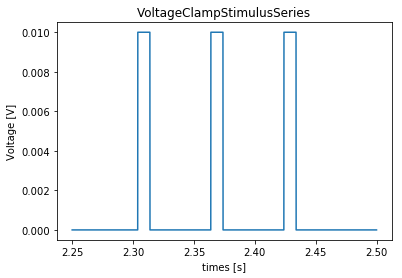

In [9]:
# VoltageClampStimulusSeries
# Voltage vs time

for i in container.stimulus:
    
    if i=='index_00':
        print("neurodata_type = ", container.get_stimulus(i).neurodata_type)
        #print("file = ", container.get_stimulus(i).description)
        print("desc = ", container.get_stimulus(i).stimulus_description)
        print("rate = ", container.get_stimulus(i).rate) # Hz
        print("gain = ", container.get_stimulus(i).gain) # x
        print("data.data = ", container.get_stimulus(i).data)       
        print("conversion = ", container.get_acquisition(i).conversion)
 
        voltage_shape = container.get_stimulus(i).data.shape[0]
        print("voltage_shape = ", voltage_shape)
        temps_voltage = np.zeros(voltage_shape)
        print("temps_voltage = ", temps_voltage)
        
        for k in range(0, voltage_shape):
            temps_voltage[k]=1./container.get_stimulus(i).rate*k+container.get_acquisition(i).starting_time
            # Warning : starting_time = get_acquisition().starting_time
            
        print("temps_voltage = ", temps_voltage)
        
        ###plt.plot(temps_voltage, container.get_stimulus(i).data[:]/1000.)
        plt.plot(temps_voltage, container.get_stimulus(i).data[:]*container.get_stimulus(i).conversion)
        plt.xlabel('times [s]')
        plt.ylabel('Voltage [%s]' %container.get_stimulus(i).unit)
        plt.title('%s' %container.get_stimulus(i).neurodata_type)
       
        plt.show()   


current_shape =  2500
container.get_acquisition(i).unit =  A
container.get_acquisition(i).data[:] =  [19.897459 25.268553 28.07617  ... 29.907225 28.930662 30.273436]


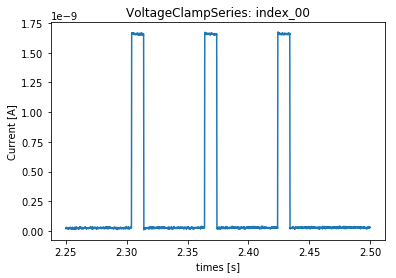

In [10]:
# VoltageClampSeries
# Current vs time

for i in container.stimulus:
    
    if i=='index_00':

#        print("container.get_acquisition(i).neurodata_type = ", container.get_acquisition(i).neurodata_type)
    
        current_shape = container.get_acquisition(i).data.shape[0]
        print("current_shape = ", current_shape)
        print("container.get_acquisition(i).unit = ", container.get_acquisition(i).unit)
        temps = np.zeros(current_shape)
        
        for j in range(0, current_shape):
            temps[j]=1./container.get_acquisition(i).rate*j+container.get_acquisition(i).starting_time
          
        print("container.get_acquisition(i).data[:] = ", container.get_acquisition(i).data[:])

        plt.plot(temps, container.get_acquisition(i).data[:]*container.get_acquisition(i).conversion)
        plt.xlabel('times [s]')
        plt.ylabel('Current [%s]' %container.get_acquisition(i).unit)
        plt.title('%s: %s' %(container.get_acquisition(i).neurodata_type, i))
        
        plt.show()

In [11]:
#for w in container.acquisition:
#    print("container.get_acquisition(w).data[:] = ", container.get_acquisition(w).data[:])
#    print("container.get_acquisition(w).unit = ", container.get_acquisition(w).unit)
#    print("container.get_acquisition(w).conversion = ", container.get_acquisition(w).conversion)
#    print("container.get_stimulus(w).conversion = ", container.get_stimulus(w).conversion)    
#    print("container.get_acquisition(w).data[:]*container.get_acquisition(w).conversion = ", container.get_acquisition(w).data[:]*container.get_acquisition(w).conversion)
    